In [534]:
%matplotlib notebook
import time
import numpy as np
import scipy.constants as consts
from scipy import stats
import matplotlib.pyplot as plt
from IPython import display
import cmath
#3D stuff
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from ipywidgets import interact, interactive, fixed, interact_manual
from scipy.interpolate import griddata

%run "scripts/Magnet_6031A.ipynb"
%run "scripts/GateV_k2400.ipynb"
%run "scripts/GateV_E3640A.ipynb"
%run "scripts/srs.ipynb"
%run "scripts/fileio.ipynb"
%run "scripts/V_to_R.ipynb"
%run "scripts/Vth_to_T.ipynb"

%run "scripts/Meas_T.ipynb"
%run "scripts/Vg_to_n.ipynb"
%run "scripts/B_Vg_R.ipynb"
%run "scripts/B_TG_BG.ipynb"


 #same for Vxx to Rxx, Vxy to Rxy
#run "scripts/Vxy_to_Rxy.ipynb"

# Preliminary checks 

#
# 
#IsHystere
#IsTstable
E3640A_is_flipped = 0
one_machine = 1
fine_sweep_delay = 0
auto_gain = 0
no_sweep_just_set =1 
sweep_by_V =1
sweep_both_gate = 0


In [3]:
rm = visa.ResourceManager()
print(rm.list_resources())

('GPIB0::1::INSTR', 'GPIB0::2::INSTR', 'GPIB0::5::INSTR', 'GPIB0::6::INSTR', 'GPIB0::10::INSTR', 'GPIB0::17::INSTR', 'GPIB0::21::INSTR')


In [4]:
lock_Vth = rm.open_resource('GPIB0::17::INSTR')#Top
lock_Vxx = rm.open_resource('GPIB0::1::INSTR')#Middle
lock_Vxy = rm.open_resource('GPIB0::2::INSTR')#Bottom
GateV_k2400 = init2400('GPIB0::10::INSTR')
GateV_E3640A= initE3640A('GPIB0::21::INSTR')
MagI_hp6031_U = initMag_U('GPIB0::5::INSTR')#Up
MagI_hp6031_D = initMag_D('GPIB0::6::INSTR')#DOwn

In [33]:
V_to_R(readsrs(lock_Vxx)[0])

[0.0024171, -0.000162126]


19172.85500783945

In [9]:
meas_T(lock_Vth,1,1)

[0.000604514, -3.20675e-05]


array([2.101247])

In [93]:
while(1):
    time.sleep(30)
    print (meas_T(lock_Vth,1,1)[0])

[0.000426443, -2.25605e-05]
2.6156054290459605
[0.000426622, -2.26499e-05]
2.614798120746684
[0.000426861, -2.26499e-05]
2.613720205862811
[0.000427397, -2.25903e-05]
2.611302788182004
[0.000427725, -2.25903e-05]
2.6098234716061177
[0.000428172, -2.27393e-05]
2.607807450197237
[0.000428261, -2.27691e-05]
2.607406049746222
[0.00042844, -2.26797e-05]
2.606598738510312
[0.000428768, -2.26499e-05]
2.605119418847247
[0.000429096, -2.27095e-05]
2.603640098213331
[0.000429215, -2.27691e-05]
2.603103393231139
[0.000429453, -2.27393e-05]
2.6020299828833813
[0.000429751, -2.27095e-05]
2.6006859641642253
[0.000430079, -2.27095e-05]
2.599370373925582
[0.000430347, -2.28585e-05]
2.5984111121858757
[0.000430407, -2.28883e-05]
2.598196352024425
[0.000430496, -2.27989e-05]
2.5978777910707875
[0.000430884, -2.27095e-05]
2.596489007823654
[0.000431271, -2.28287e-05]
2.5951038028407902
[0.000431539, -2.29181e-05]
2.594144538813216
[0.000431569, -2.28883e-05]
2.5940371584796087
[0.000431838, -2.27691e-05]

KeyboardInterrupt: 

[0.000258775, -1.36495e-05]
3.81144172001489
[0.000260862, -1.37687e-05]
3.785711772115698
[0.00026268, -1.38879e-05]
3.764608963501441
[0.000264497, -1.39177e-05]
3.743517685905894
[0.000266494, -1.40668e-05]
3.7203369252872545
[0.000268163, -1.41562e-05]
3.7009634494017822
[0.000269951, -1.42456e-05]
3.6802085694345785
[0.00027168, -1.4335e-05]
3.6601384834693675
[0.00027323, -1.44244e-05]
3.642146155372685
[0.000274928, -1.4484e-05]
3.6224357861049334
[0.000276508, -1.46032e-05]
3.6040950996761842
[0.000278028, -1.46926e-05]
3.588825629077063
[0.000279905, -1.4782e-05]
3.5708561157419796
[0.000281425, -1.48416e-05]
3.5563043026999175
[0.000282945, -1.49608e-05]
3.541752445407825
[0.000284465, -1.50204e-05]
3.5272005438654976
[0.000286045, -1.51098e-05]
3.512074178252021
[0.000287475, -1.51694e-05]
3.498383818787205
[0.000289084, -1.52589e-05]
3.4829797241433615
[0.000290515, -1.53185e-05]
3.4692797076944357
[0.000292035, -1.54377e-05]
3.4547275857712942
[0.000293614, -1.55271e-05]
3

KeyboardInterrupt: 

In [59]:
SweepBothGate(GateV_k2400,GateV_E3640A,0)

In [18]:
sweep2400(GateV_k2400,0)

In [16]:
IsweepMag(MagI_hp6031_U,47)

In [134]:
sweepE3640A(GateV_E3640A,0)

In [146]:
IreadSetMag(MagI_hp6031_U)

23.01

In [10]:
np.concatenate((np.arange(-8,-13.5,-0.05),(np.arange(9,14,0.05))))

array([ -8.  ,  -8.05,  -8.1 ,  -8.15,  -8.2 ,  -8.25,  -8.3 ,  -8.35,
        -8.4 ,  -8.45,  -8.5 ,  -8.55,  -8.6 ,  -8.65,  -8.7 ,  -8.75,
        -8.8 ,  -8.85,  -8.9 ,  -8.95,  -9.  ,  -9.05,  -9.1 ,  -9.15,
        -9.2 ,  -9.25,  -9.3 ,  -9.35,  -9.4 ,  -9.45,  -9.5 ,  -9.55,
        -9.6 ,  -9.65,  -9.7 ,  -9.75,  -9.8 ,  -9.85,  -9.9 ,  -9.95,
       -10.  , -10.05, -10.1 , -10.15, -10.2 , -10.25, -10.3 , -10.35,
       -10.4 , -10.45, -10.5 , -10.55, -10.6 , -10.65, -10.7 , -10.75,
       -10.8 , -10.85, -10.9 , -10.95, -11.  , -11.05, -11.1 , -11.15,
       -11.2 , -11.25, -11.3 , -11.35, -11.4 , -11.45, -11.5 , -11.55,
       -11.6 , -11.65, -11.7 , -11.75, -11.8 , -11.85, -11.9 , -11.95,
       -12.  , -12.05, -12.1 , -12.15, -12.2 , -12.25, -12.3 , -12.35,
       -12.4 , -12.45, -12.5 , -12.55, -12.6 , -12.65, -12.7 , -12.75,
       -12.8 , -12.85, -12.9 , -12.95, -13.  , -13.05, -13.1 , -13.15,
       -13.2 , -13.25, -13.3 , -13.35, -13.4 , -13.45,   9.  ,   9.05,
      

<IPython.core.display.Javascript object>


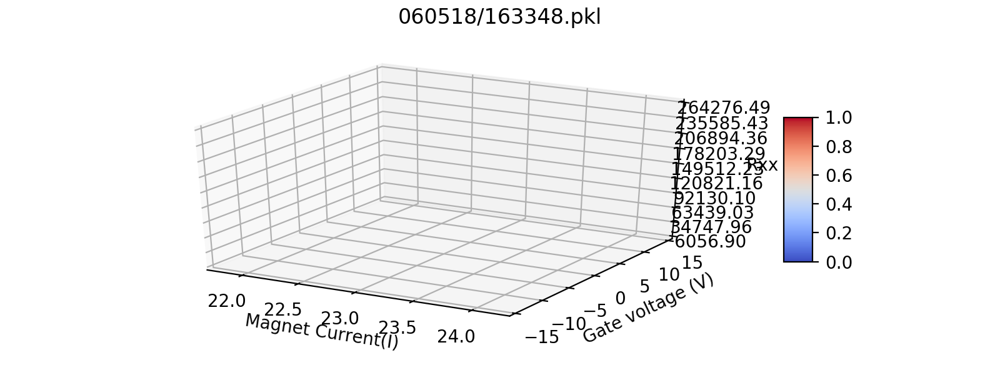

In [22]:
Vtop_R=B_Vg_R(GateV_k2400,GateV_E3640A,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[23], np.arange(-14,14,0.2),3.5)# IMag=0, Vg[],delay 

<IPython.core.display.Javascript object>


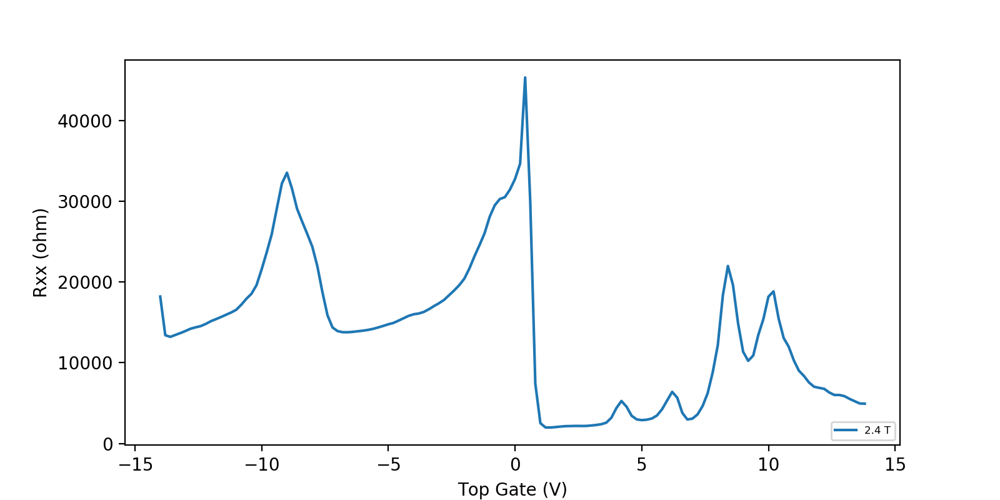

In [31]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop_2_4Tesla'+'.png')
plt.show()

<IPython.core.display.Javascript object>


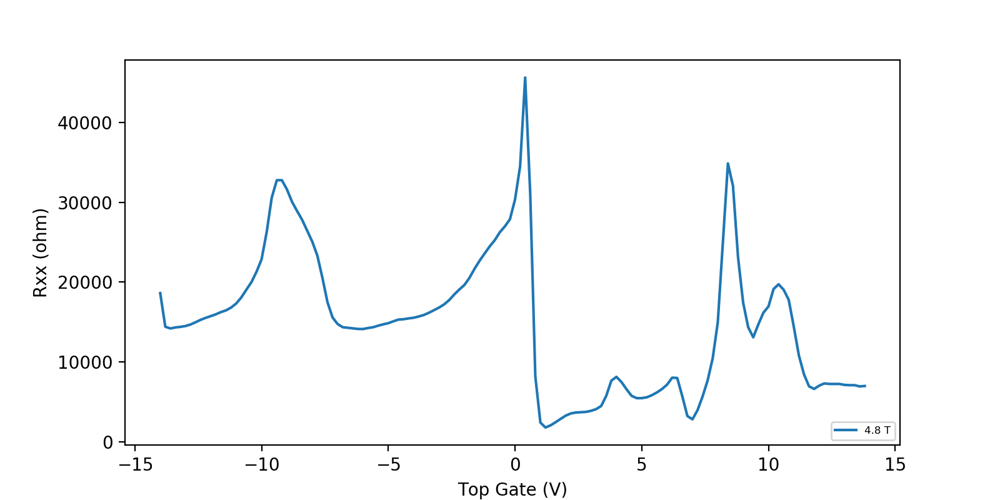

In [32]:
fig = plt.figure(figsize=(8, 4))
data = loaddata('060518/161805.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop_2_4Tesla'+'.png')
plt.show()

<IPython.core.display.Javascript object>


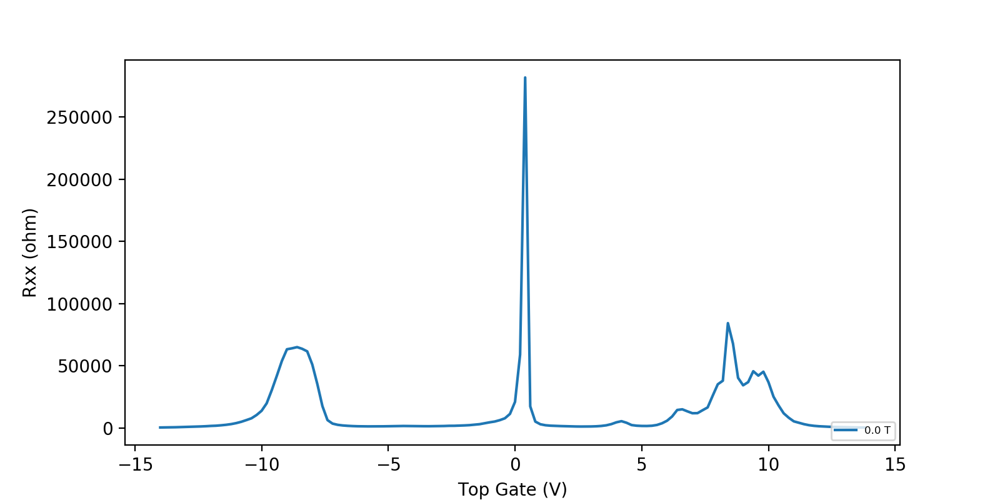

In [26]:
fig = plt.figure(figsize=(8, 4))
data = loaddata('060518/153804.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
plt.savefig(data.filename+'Rxx_Vtop_0Tesla'+'.png')
plt.show()

<IPython.core.display.Javascript object>


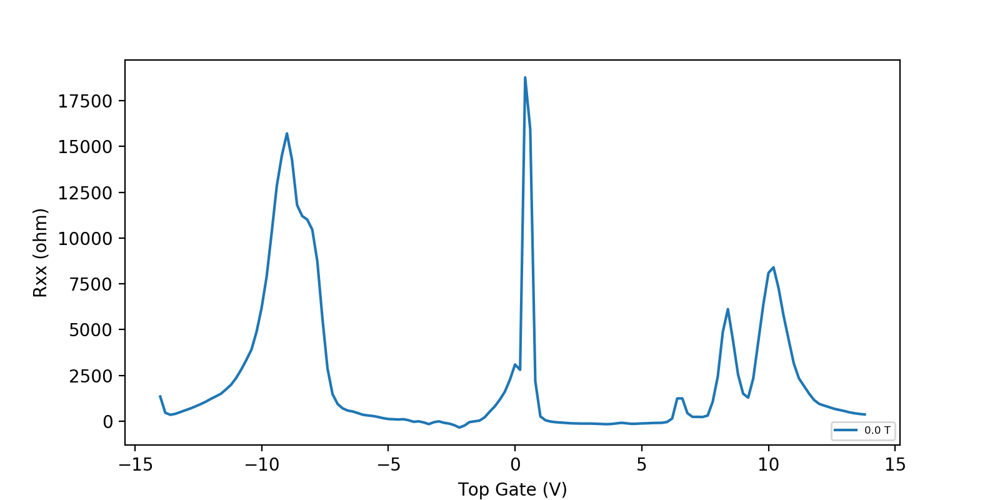

In [29]:
fig = plt.figure(figsize=(8, 4))
data = loaddata('060518/153804.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop_0Tesla'+'.png')
plt.show()

<IPython.core.display.Javascript object>


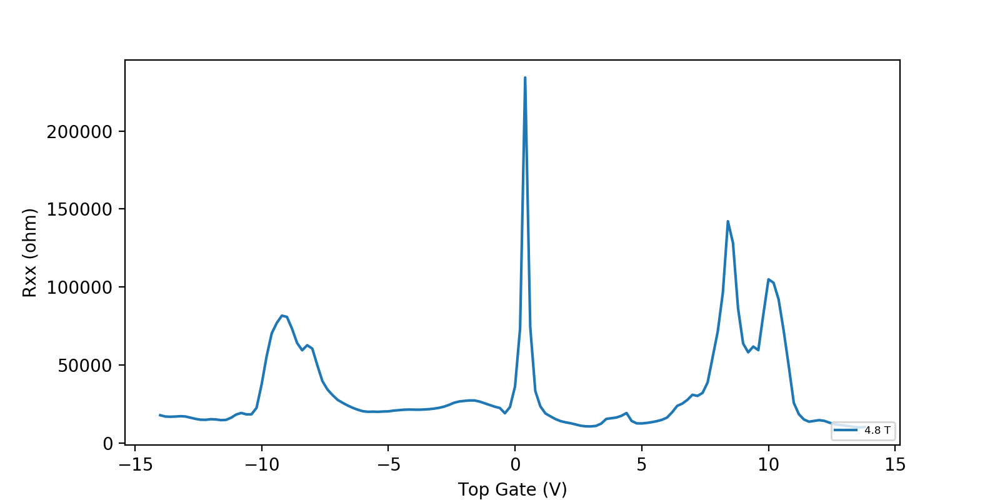

In [27]:
fig = plt.figure(figsize=(8, 4))
data = loaddata('060518/161805.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop_0Tesla'+'.png')
plt.show()

<IPython.core.display.Javascript object>


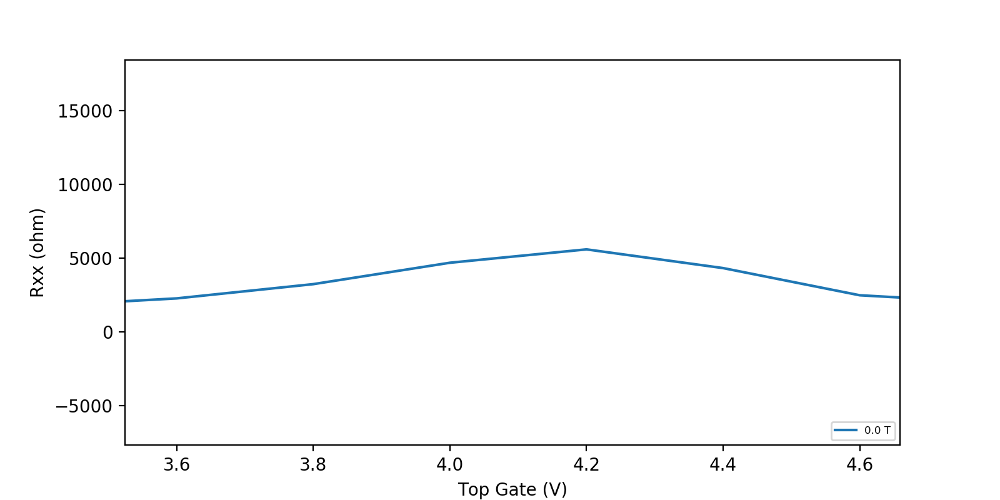

In [20]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop_2_173_4V'+'.png')
plt.show()

<IPython.core.display.Javascript object>


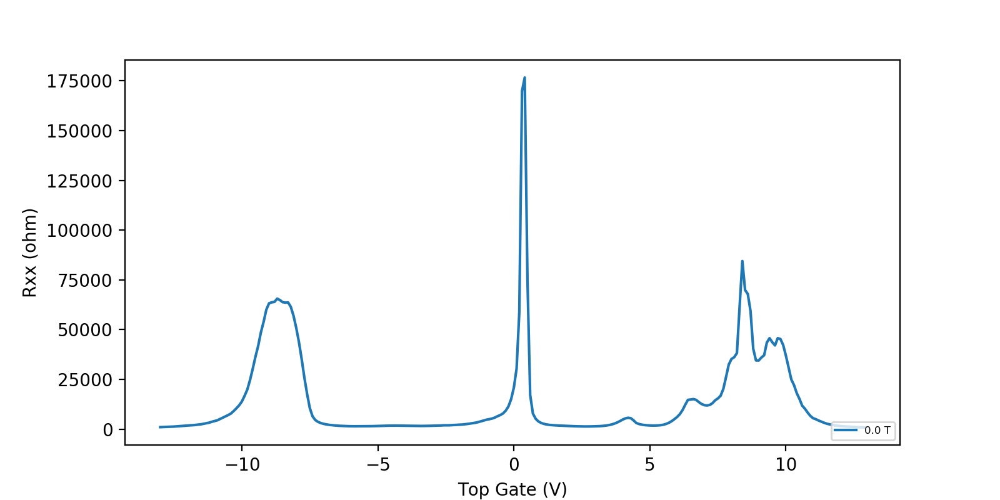

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [12]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
plt.savefig(data.filename+'Rxx_Vtop_2_173'+'.png')
plt.show()

<IPython.core.display.Javascript object>


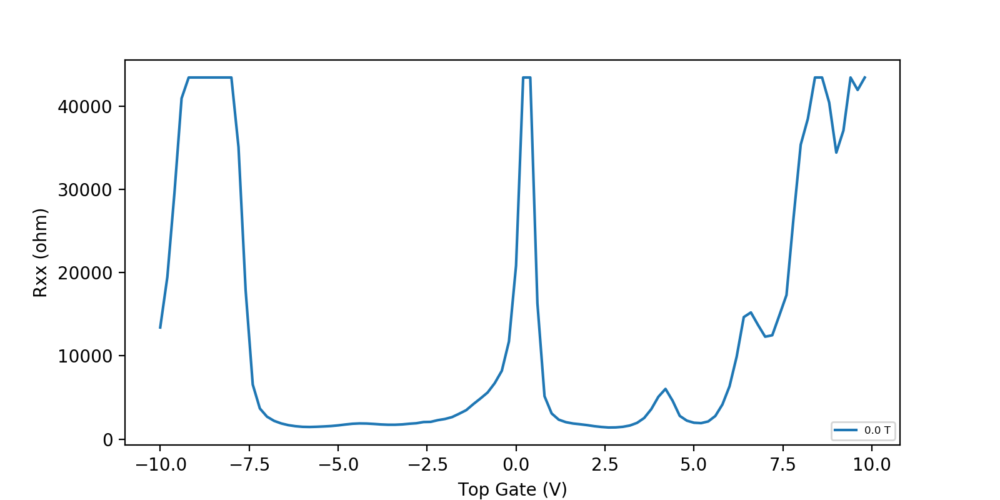

In [95]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop'+'.png')
plt.show()

<IPython.core.display.Javascript object>


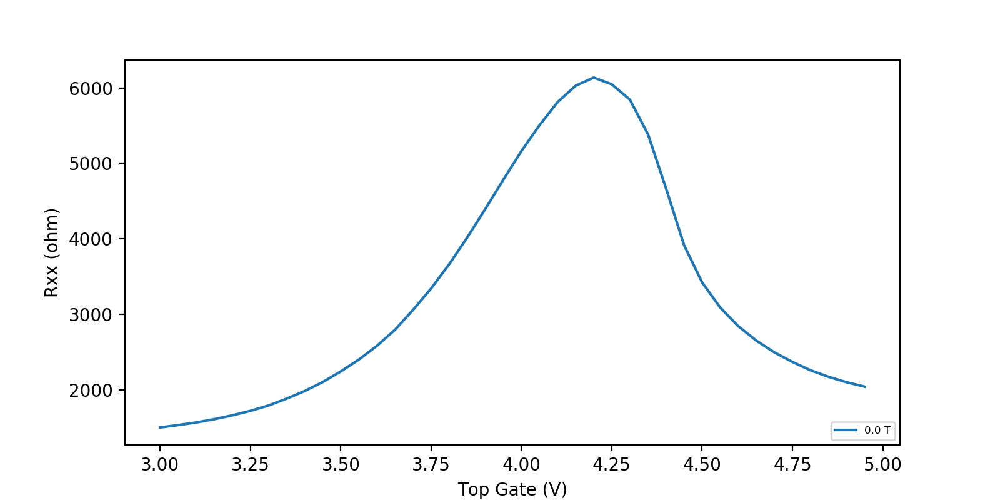

In [92]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop'+'.png')
plt.show()

<IPython.core.display.Javascript object>


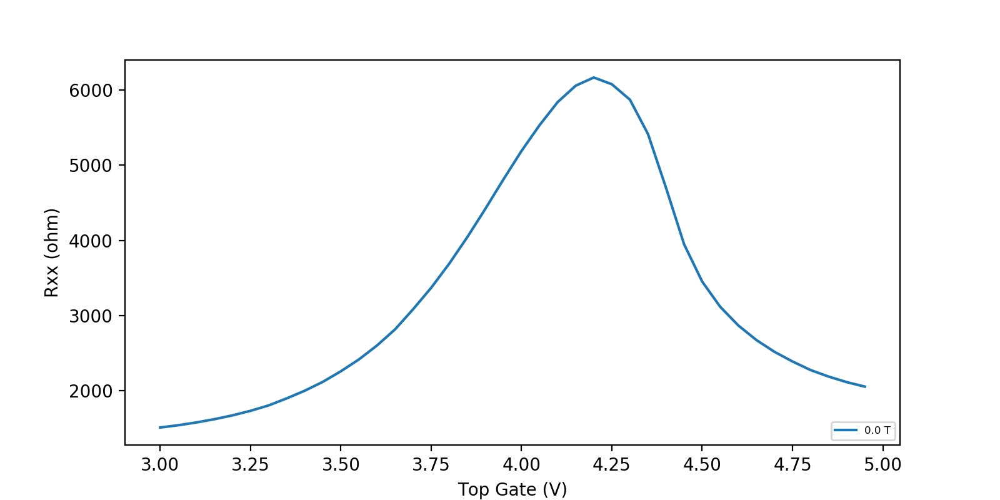

In [86]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop'+'.png')
plt.show()

<IPython.core.display.Javascript object>


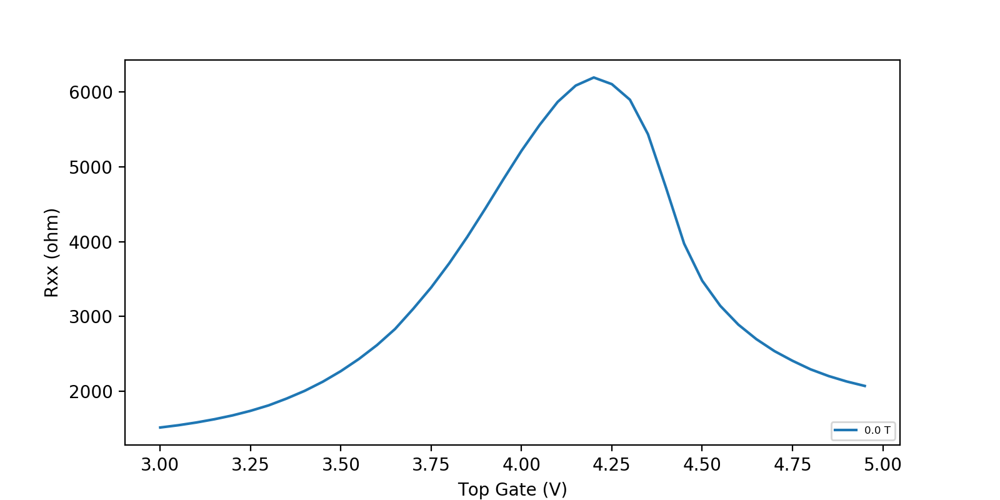

In [83]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop'+'.png')
plt.show()

<IPython.core.display.Javascript object>


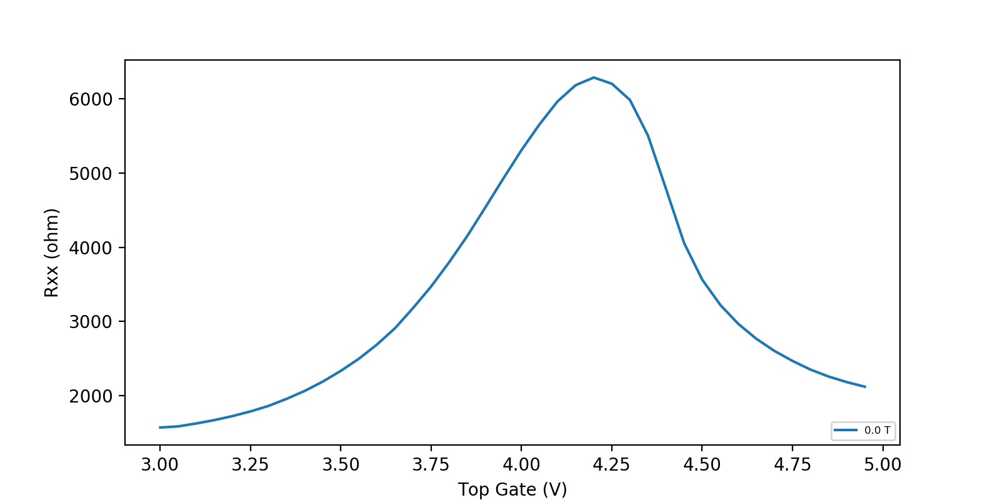

In [73]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop'+'.png')
plt.show()

<IPython.core.display.Javascript object>


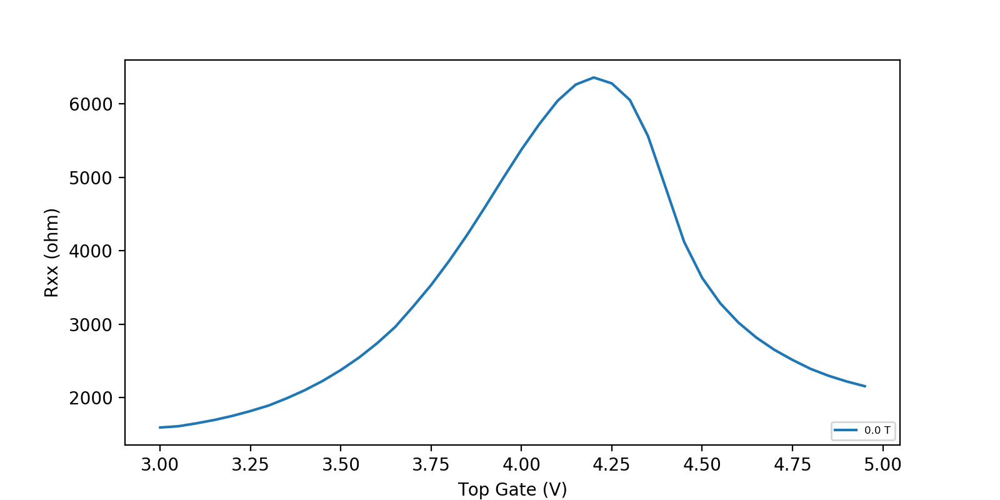

In [65]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop'+'.png')
plt.show()

<IPython.core.display.Javascript object>


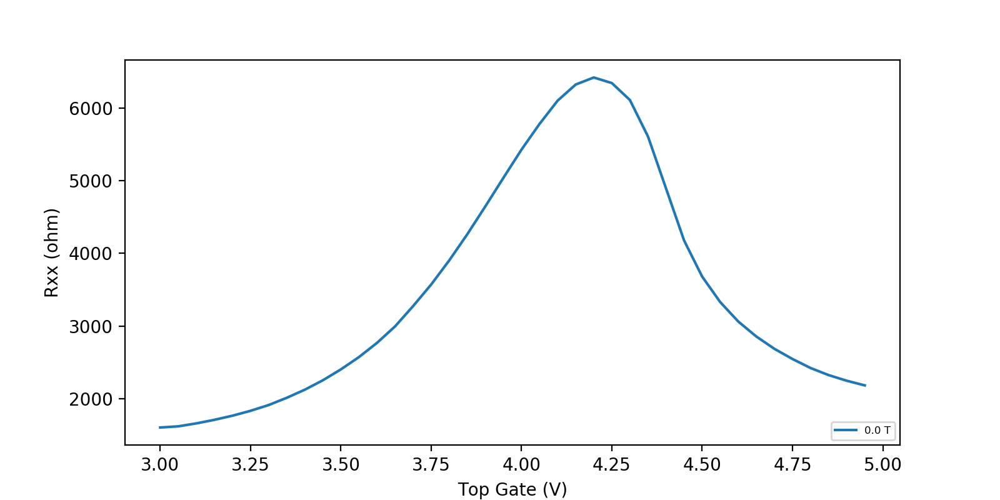

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [58]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop'+'.png')
plt.show()

<IPython.core.display.Javascript object>


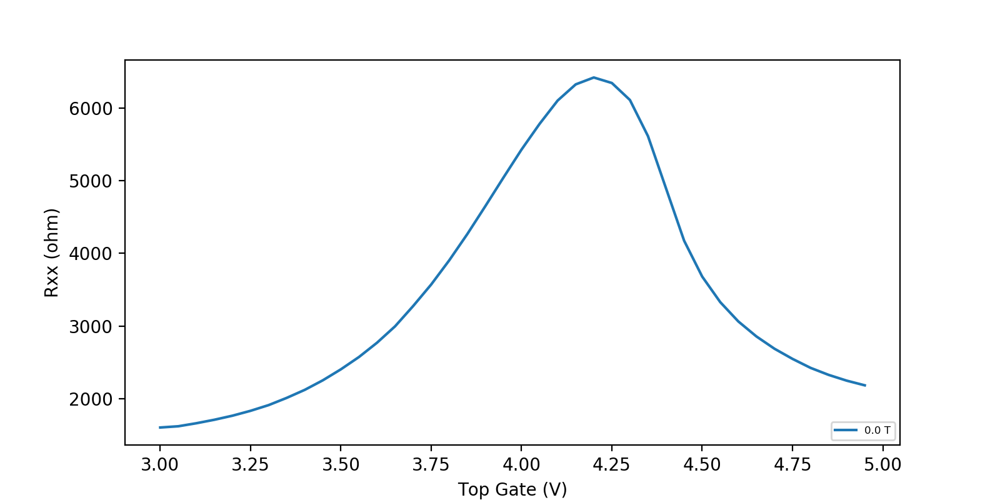

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [53]:
fig = plt.figure(figsize=(8, 4))
data = Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop'+'.png')
plt.show()

<IPython.core.display.Javascript object>


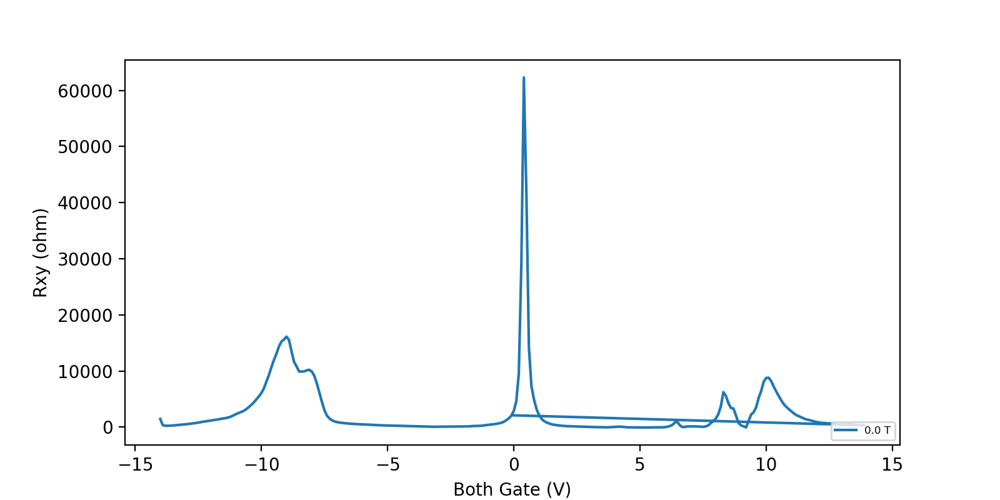

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [13]:
fig = plt.figure(figsize=(8, 4))
data = B_Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i]-0*data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy_fine'+'.png')
plt.show()

In [158]:
B_Vtop_R = loaddata('053118/185325.pkl')

<IPython.core.display.Javascript object>


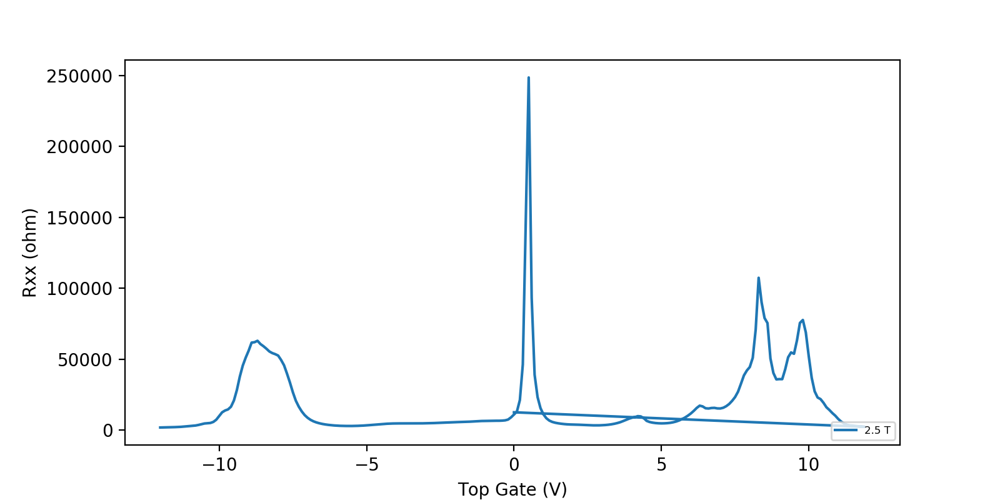

In [159]:
fig = plt.figure(figsize=(8, 4))
data = B_Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vtop'+'.png')
plt.show()

<IPython.core.display.Javascript object>


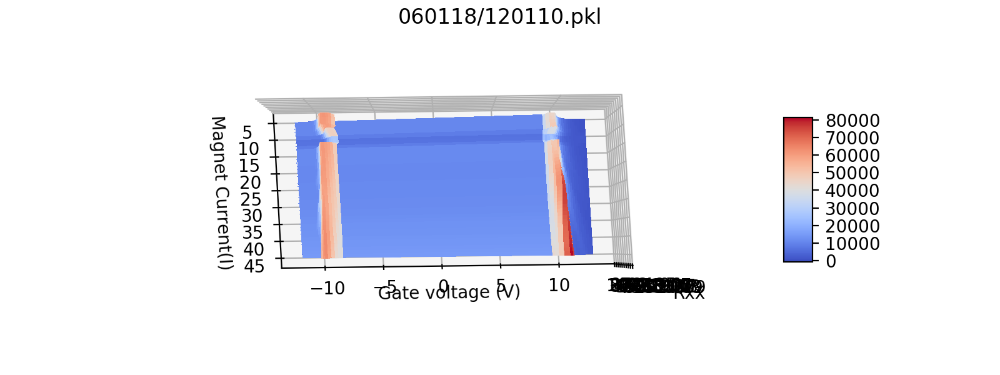

In [36]:
B_Vboth_R=B_Vg_R(GateV_k2400,GateV_E3640A,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,np.arange(5,46,1), np.concatenate((np.arange(-8,-12,-0.1),np.arange(9,13,0.1))),3.5)# IMag=0, Vg[],delay 

<IPython.core.display.Javascript object>


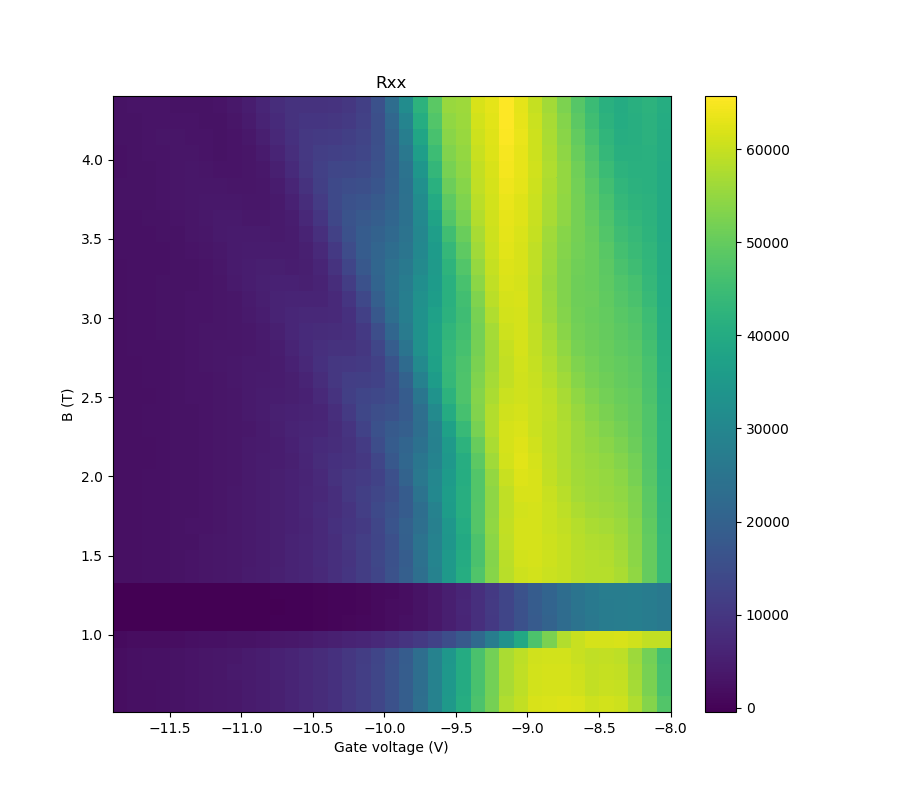

(4.004032315094318, 0.0004089242965142748)

In [527]:
data = loaddata('060118/120110.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxx')
plt.ylabel('B (T)')
plt.xlabel('Gate voltage (V)')
plt.ylim(IMag_to_B(5),IMag_to_B(43))
plt.xlim(-11.9,-8)
IMag_half = np.zeros(int(len(data.IMag)-2))
B_half = np.zeros(int(len(data.IMag)-2))
GateV_half = np.zeros(int(len(data.GateV)/2))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))

#plt.zlabel('Rxx')
for i in range(len(IMag_half)):
    B_half[i]=IMag_to_B(data.IMag[i])
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i]
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        Rxx_half[i][j] = data.Rxx[i][j]
X, Y = np.meshgrid(B_half, GateV_half)
plt.pcolor(Tp(Y),Tp(X), Rxx_half)
#plt.clim(2000,18000)
#plt.imshow()
a,c= -1.8,8.15#3.6
plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= -1.2,8.1#3.6
plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= -0.87,8#3.48
plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= -0.7,7.95#3.5
plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
data.T
plt.colorbar()
plt.show()
plt.savefig(data.filename+'B_VBoth_Rxx_heatmap_neg'+'.png')
data.T

<IPython.core.display.Javascript object>


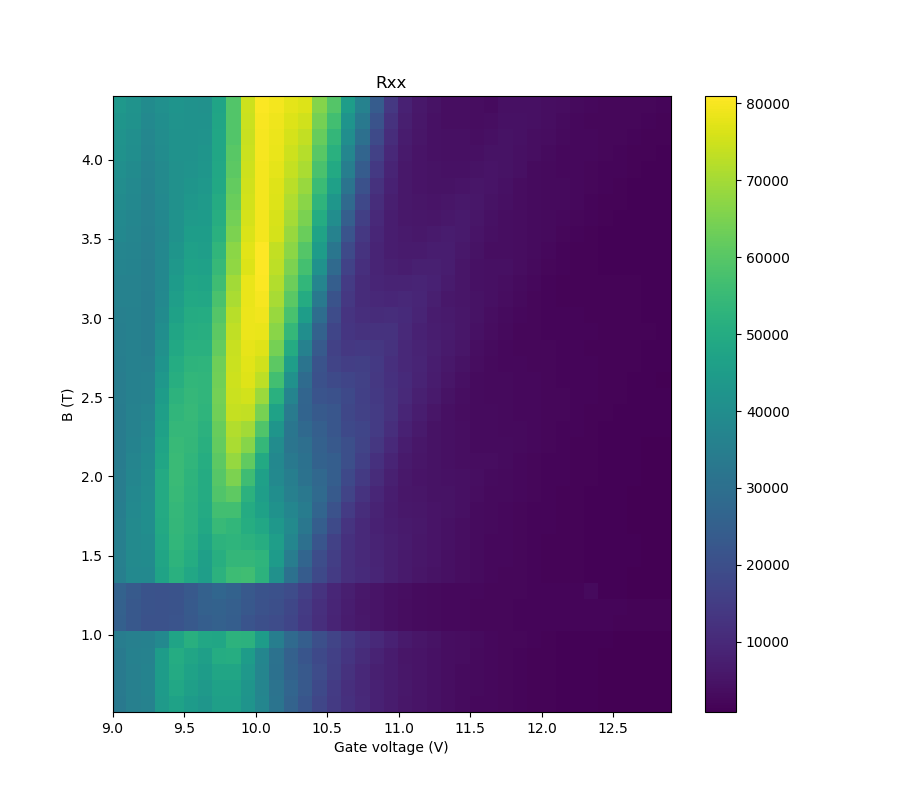

(4.004032315094318, 0.0004089242965142748)

In [525]:
data = loaddata('060118/120110.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxx')
plt.ylabel('B (T)')
plt.xlabel('Gate voltage (V)')
plt.ylim(IMag_to_B(5),IMag_to_B(43))
plt.xlim(9,12.9)
IMag_half = np.zeros(int(len(data.IMag)-2))
B_half = np.zeros(int(len(data.IMag)-2))
GateV_half = np.zeros(int(len(data.GateV)/2))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))

#plt.zlabel('Rxx')
V_shift = int(len(data.GateV)/2)
for i in range(len(IMag_half)):
    B_half[i]=IMag_to_B(data.IMag[i])
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i+V_shift]
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        Rxx_half[i][j] = data.Rxx[i][j+V_shift]
X, Y = np.meshgrid(B_half, GateV_half)
plt.pcolor(Tp(Y),Tp(X), Rxx_half)
#plt.clim(2000,10000)
#plt.imshow()
a,c= -1.8,8.15#3.6
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= 1.27,-8.6#3.81
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= 0.95,-8.4#3.8
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= 0.76,-8.4#3.8
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= 0.64,-8.4#3.84
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')

data.T
plt.colorbar()
plt.show()
plt.savefig(data.filename+'B_VBoth_Rxx_heatmap'+'.png')
data.T

<IPython.core.display.Javascript object>


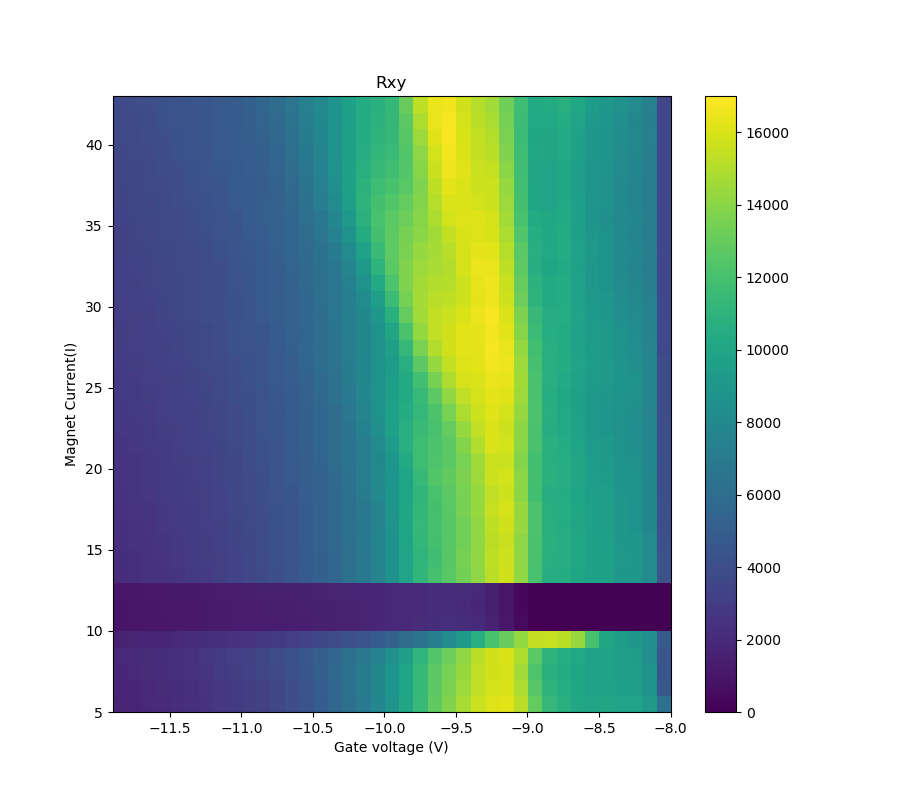

(4.004032315094318, 0.0004089242965142748)

In [548]:
data = loaddata('060118/120110.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxy')
plt.ylabel('Magnet Current(I)')
plt.xlabel('Gate voltage (V)')
IMag_half = np.zeros(int(len(data.IMag)-2))
GateV_half = np.zeros(int(len(data.GateV)/2))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))
Rxy_half = np.zeros((len(IMag_half),len(GateV_half)))
#plt.zlabel('Rxx')
for i in range(len(IMag_half)):
    IMag_half[i]=data.IMag[i]
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i]
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        Rxx_half[i][j] = data.Rxx[i][j]
        Rxy_half[i][j] = V_to_R(data.Vxy[i][j][0]) 
X, Y = np.meshgrid(IMag_half, GateV_half)
plt.pcolor(Tp(Y),Tp(X), Rxy_half-0*Rxx_half)
plt.clim(0,17000)
#plt.imshow()
plt.colorbar()
plt.show()
plt.savefig(data.filename+'B_VBoth_Rxy_heatmap'+'.png')
data.T

<IPython.core.display.Javascript object>


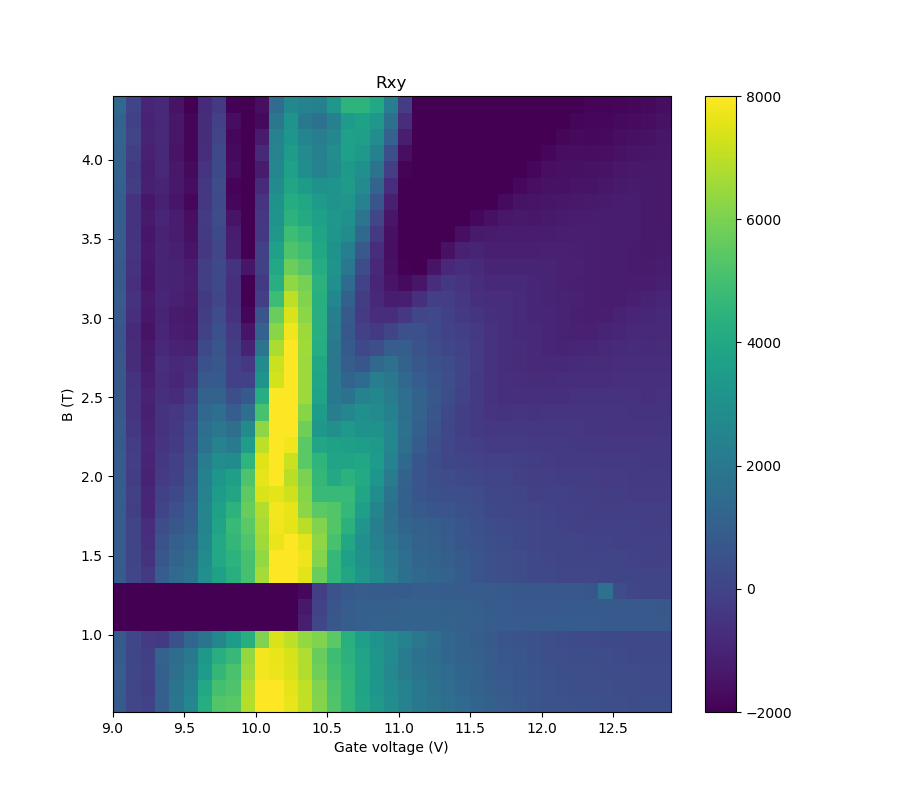

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


(4.004032315094318, 0.0004089242965142748)

In [547]:
data = loaddata('060118/120110.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxy')
plt.ylabel('B (T)')
plt.xlabel('Gate voltage (V)')
plt.ylim(IMag_to_B(5),IMag_to_B(43))
plt.xlim(9,12.9)
IMag_half = np.zeros(int(len(data.IMag)-2))
B_half = np.zeros(int(len(data.IMag)-2))
GateV_half = np.zeros(int(len(data.GateV)/2))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))
Rxy_half = np.zeros((len(IMag_half),len(GateV_half)))

#plt.zlabel('Rxx')
V_shift = int(len(data.GateV)/2)
for i in range(len(IMag_half)):
    B_half[i]=IMag_to_B(data.IMag[i])
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i+V_shift]
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        Rxx_half[i][j] = data.Rxx[i][j+V_shift]
        Rxy_half[i][j] = V_to_R(data.Vxy[i][j+V_shift][0]) 


X, Y = np.meshgrid(B_half, GateV_half)
plt.pcolor(Tp(Y),Tp(X), Rxy_half)
plt.clim(-2000,8000)
#plt.imshow()
a,c= -1.8,8.15#3.6
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= 1.27,-8.6#3.81
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= 0.95,-8.4#3.8
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= 0.76,-8.4#3.8
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')
a,c= 0.64,-8.4#3.84
#plt.plot(np.array(data.GateV), a*(np.array(data.GateV) + c), 'r', label='Fitted line',color='red')

data.T
plt.colorbar()
plt.show()
plt.savefig(data.filename+'B_VBoth_Rxy_heatmap_pos'+'.png')
data.T

<IPython.core.display.Javascript object>


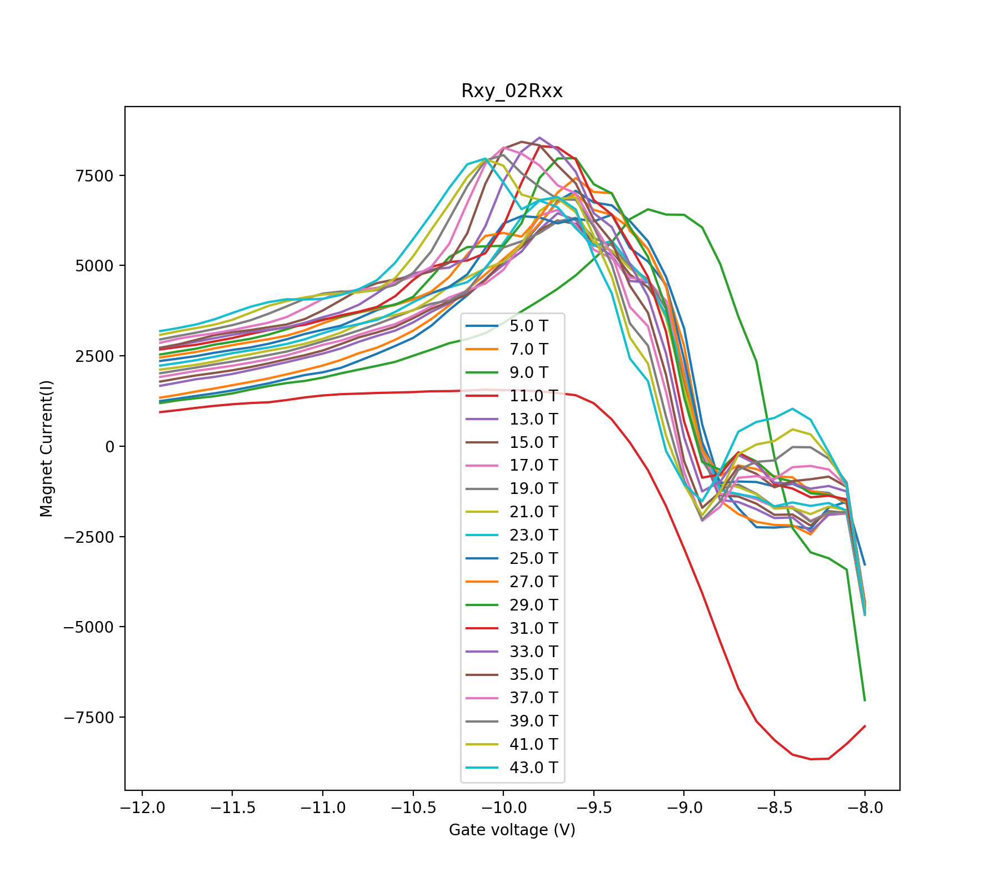

(4.004032315094318, 0.0004089242965142748)

In [43]:
data = loaddata('060118/120110.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxy_02Rxx')
plt.ylabel('Magnet Current(I)')
plt.xlabel('Gate voltage (V)')
IMag_half = np.zeros(int(len(data.IMag)-2))
GateV_half = np.zeros(int(len(data.GateV)/2))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))
Rxy_half = np.zeros((len(IMag_half),len(GateV_half)))
#plt.zlabel('Rxx')
for i in range(len(IMag_half)):
    IMag_half[i]=data.IMag[i]
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i]
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        Rxx_half[i][j] = data.Rxx[i][j]
        Rxy_half[i][j] = V_to_R(data.Vxy[i][j][0]) 
#X, Y = np.meshgrid(IMag_half, GateV_half)
for i in range(len(IMag_half)):
    if i%2 ==0:
        plt.plot(IMag_half_,Rxy_half[i]-0.2*Rxx_half[i],label="%1.1f T"%IMag_half[i])
#plt.pcolor(Tp(Y),Tp(X), Rxy_half-0.2*Rxx_half)
#plt.clim(0,50000)
#plt.imshow()
#plt.colorbar()
plt.show()
plt.legend()
#plt.savefig(data.filename+'B_VBoth_Rxx_heatmap'+'.png')
data.T


<IPython.core.display.Javascript object>


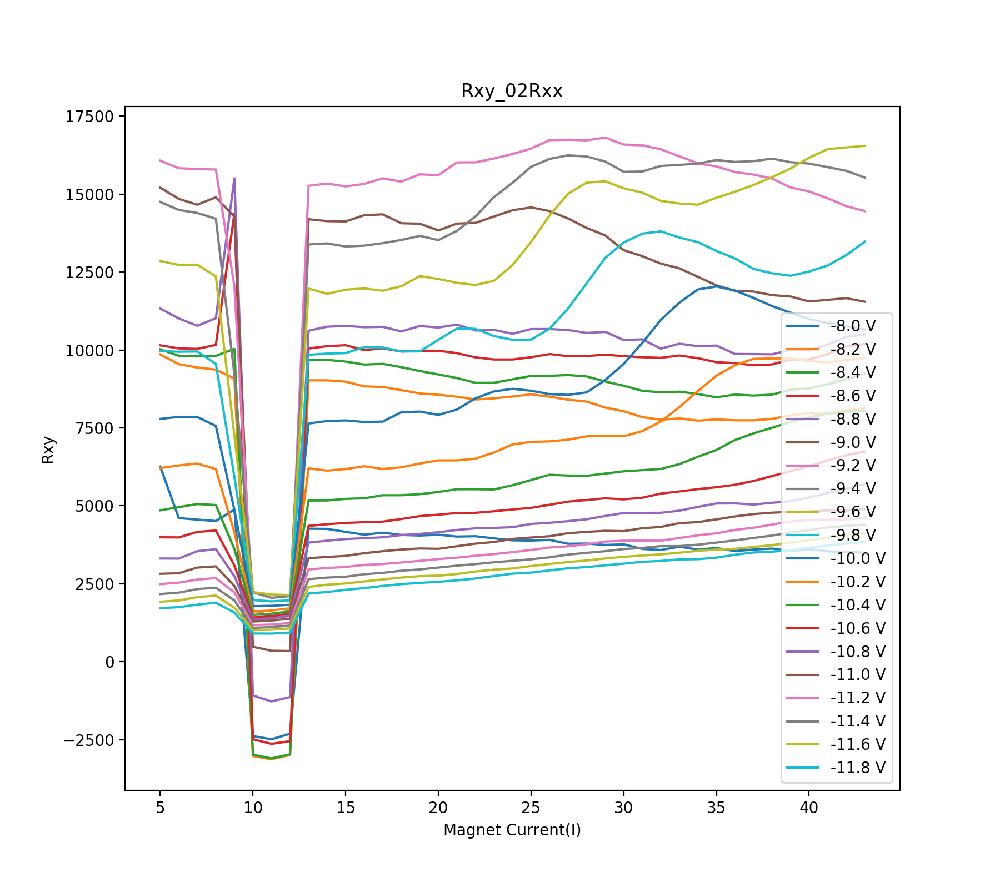

(4.004032315094318, 0.0004089242965142748)

In [75]:
data = loaddata('060118/120110.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxy_02Rxx')
plt.xlabel('Magnet Current(I)')
plt.ylabel('Rxy')
IMag_half = np.zeros(int(len(data.IMag)-2))
GateV_half = np.zeros(int(len(data.GateV)/2))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))
Rxy_half = np.zeros((len(IMag_half),len(GateV_half)))
#plt.zlabel('Rxx')
for i in range(len(IMag_half)):
    IMag_half[i]=data.IMag[i]
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i]
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        Rxx_half[i][j] = data.Rxx[i][j]
        Rxy_half[i][j] = V_to_R(data.Vxy[i][j][0]) 
#X, Y = np.meshgrid(IMag_half, GateV_half)
for i in range(len(GateV_half)):
    if i%2 ==0:
        plt.plot(IMag_half,Tp(Tp(Rxy_half)[i]-0*Tp(Rxx_half)[i]),label="%1.1f V"%GateV_half[i])
#plt.pcolor(Tp(Y),Tp(X), Rxy_half-0.2*Rxx_half)
#plt.clim(0,50000)
#plt.imshow()
#plt.colorbar()
plt.show()
plt.legend()
#plt.savefig(data.filename+'B_VBoth_Rxx_heatmap'+'.png')
data.T



<IPython.core.display.Javascript object>


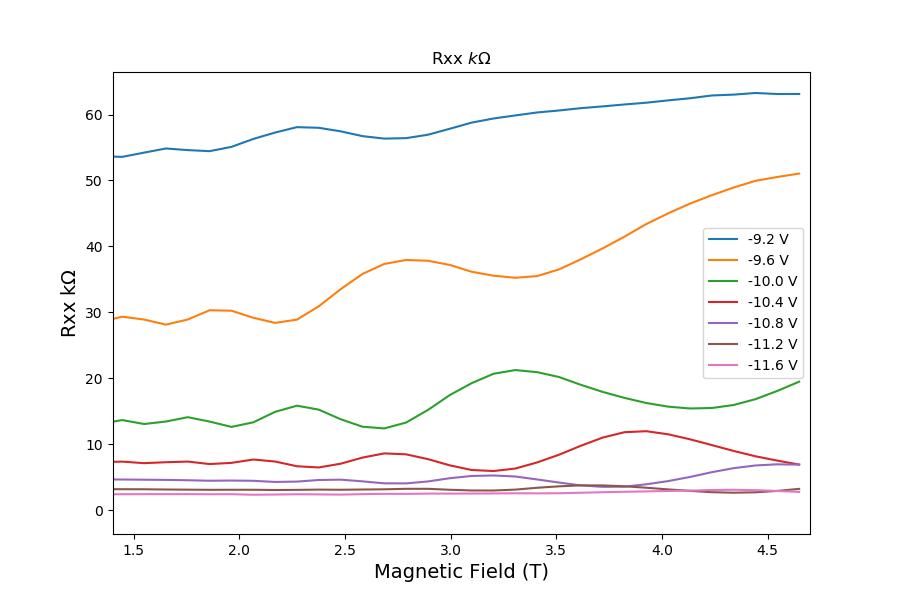

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


(4.004032315094318, 0.0004089242965142748)

In [291]:
data = loaddata('060118/120110.pkl')
fig = plt.figure(figsize=(9, 6)) 
plt.title(r'Rxx $k\Omega$')
plt.xlabel('Magnetic Field (T)',fontsize = 14)
plt.ylabel(r'Rxx k$\Omega$',fontsize = 14)
plt.xlim(1.4,4.7)
IMag_half = np.zeros(int(len(data.IMag)))
GateV_half = np.zeros(int(len(data.GateV)))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))
Rxy_half = np.zeros((len(IMag_half),len(GateV_half)))
#plt.zlabel('Rxx')
for i in range(len(IMag_half)):
    IMag_half[i]=data.IMag[i]
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i]
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        Rxx_half[i][j] = data.Rxx[i][j]
        Rxy_half[i][j] = V_to_R(data.Vxy[i][j][0]) 
#X, Y = np.meshgrid(IMag_half, GateV_half)
for i in range(12,len(GateV_half)):
    if GateV_half[i]<0 and i%4==0:
        plt.plot(IMag_half/9.68,Tp(Tp(Rxx_half)[i])/1000,label="%1.1f V"%GateV_half[i])
#plt.pcolor(Tp(Y),Tp(X), Rxy_half-0.2*Rxx_half)
#plt.clim(0,50000)
#plt.imshow()
#plt.colorbar()
plt.show()
plt.legend()
#plt.savefig(data.filename+'landau'+'.png')
data.T



In [47]:
data.filename

'060118/120110.pkl'

<IPython.core.display.Javascript object>


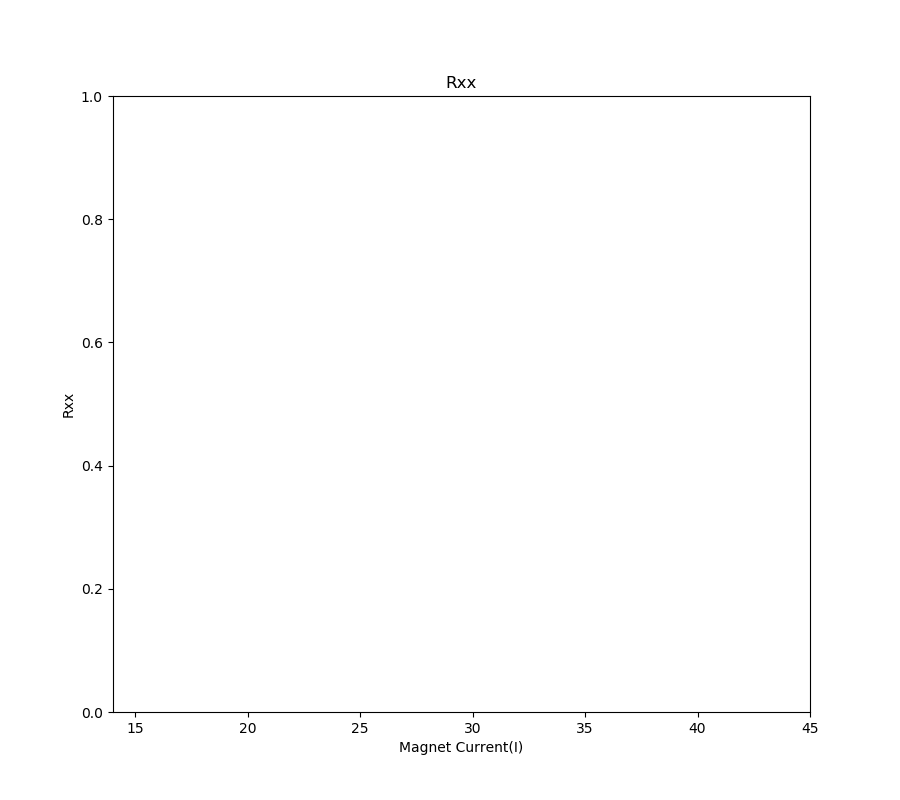

(4.004032315094318, 0.0004089242965142748)

In [287]:
data = loaddata('060118/120110.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxx')
plt.xlabel('Magnet Current(I)')
plt.ylabel('Rxx')
plt.xlim(14,45)
IMag_half = np.zeros(int(len(data.IMag))-2)
GateV_half = np.zeros(int(len(data.GateV)/2))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))
Rxy_half = np.zeros((len(IMag_half),len(GateV_half)))
#plt.zlabel('Rxx')
for i in range(len(IMag_half)):
    IMag_half[i]=data.IMag[i]
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i]
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        Rxx_half[i][j] = data.Rxx[i][j]
        Rxy_half[i][j] = V_to_R(data.Vxy[i][j][0]) 
#X, Y = np.meshgrid(IMag_half, GateV_half)
for i in range(len(GateV_half)):
    if GateV_half[i]>0 and i%4==0:
        plt.plot(IMag_half,Tp(Tp(Rxx_half)[i]),label="%1.1f V"%GateV_half[i])
#plt.pcolor(Tp(Y),Tp(X), Rxy_half-0.2*Rxx_half)
#plt.clim(0,50000)
#plt.imshow()
#plt.colorbar()
plt.show()
#plt.legend()
#plt.savefig(data.filename+'B_VBoth_Rxx_heatmap'+'.png')
data.T



In [ ]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i]-0*data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy_fine'+'.png')
plt.show()

<IPython.core.display.Javascript object>


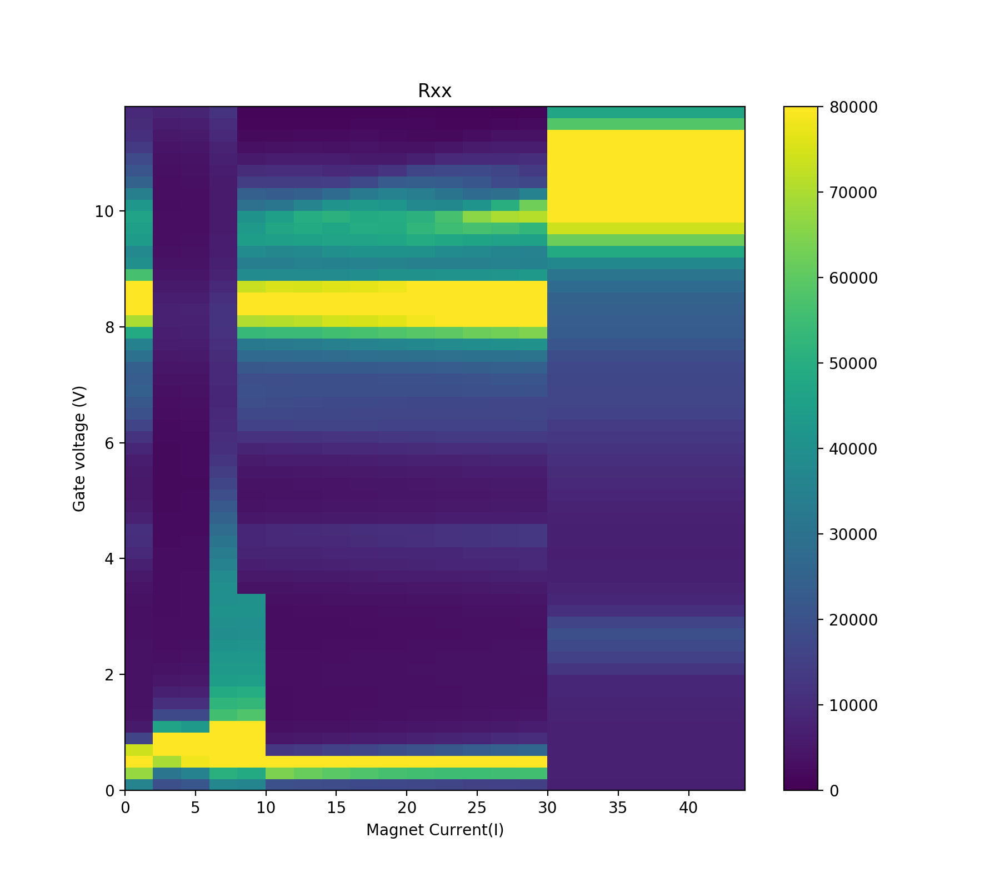

(3.9550913760093778, 0.0001890110809096222)

In [4]:
B_Vboth_R = loaddata('053118/124839.pkl')
data = B_Vboth_R
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxx')
plt.xlabel('Magnet Current(I)')
plt.ylabel('Gate voltage (V)')
IMag_half = np.zeros(int(len(data.IMag)-2))
GateV_half = np.zeros(int(len(data.GateV)/2))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))

#plt.zlabel('Rxx')
for i in range(len(IMag_half)):
    IMag_half[i]=data.IMag[i]
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i]
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        Rxx_half[i][j] = data.Rxx[i][j]
X, Y = np.meshgrid(IMag_half, GateV_half)
plt.pcolor(X, Y, np.transpose(Rxx_half))
plt.clim(0,80000)
#plt.imshow()
plt.colorbar()
plt.show()
#plt.savefig(data.filename+'B_VBoth_Rxx_heatmap'+'.png')
data.T

<IPython.core.display.Javascript object>


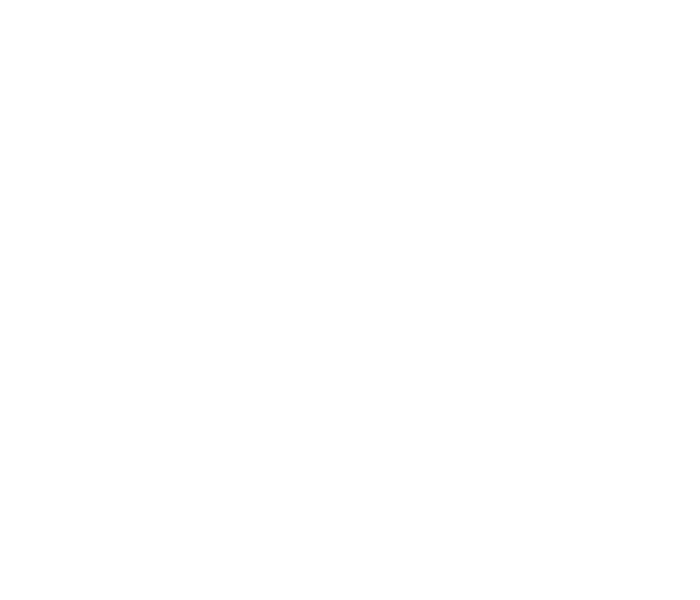

<IPython.core.display.Javascript object>


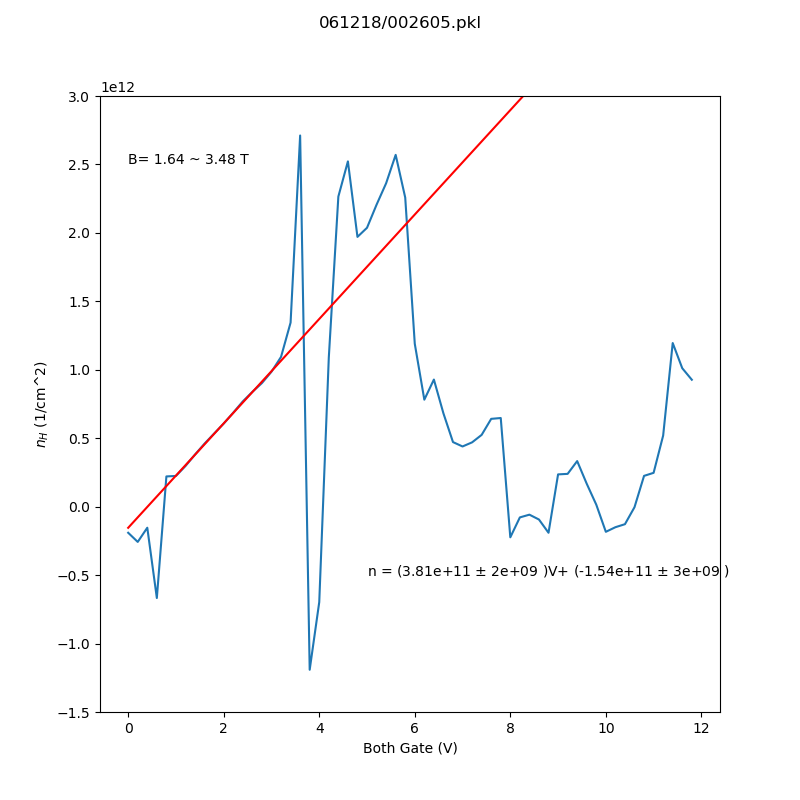

(-1500000000000.0, 3000000000000.0)

In [535]:
data = loaddata('053118/124839.pkl')
fig = plt.figure(figsize=(7, 6)) 
#plt.title('Rxy')
#plt.xlabel('Magnet Current(I)')
#plt.ylabel('Rxy')
#plt.xlim(13,34)
IMag_half = np.zeros(10)
GateV_half = np.zeros(int(len(data.GateV)/2))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))
Rxy_half = np.zeros((len(IMag_half),len(GateV_half)))
#plt.zlabel('Rxx')
for i in range(len(IMag_half)):
    IMag_half[i]=data.IMag[i+8]
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i]
data_cut=B_Vg_R_data(IMag_half,GateV_half,0)
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        data_cut.Rxx[i][j] = data.Rxx[i+8][j]
        data_cut.Vxx[i][j] = data.Vxx[i+8][j]
        data_cut.Vxy[i][j] = data.Vxy[i+8][j]
        Rxy_half[i][j] = V_to_R(data_cut.Vxy[i][j][0]) 
#X, Y = np.meshgrid(IMag_half, GateV_half)
#plt.pcolor(Tp(Y),Tp(X), Rxy_half-0*Rxx_half)
#plt.colorbar()


B_Vg_R_to_Vg_to_n(data_cut,5,15)
#for i in range(len(GateV_half)):
#    if i%8==0:
#        plt.plot(IMag_half,Tp(Tp(Rxy_half)[i]-0*Tp(Rxx_half)[i]),label="%1.1f V"%GateV_half[i])
#plt.plot([1,2.8],[2.22e11,9.01e11])
#plt.clim(0,50000)
#plt.imshow()
#plt.show()
#plt.legend()
plt.text(0,2.5e12,r'B= %.2f ~ %.2f T'%(IMag_to_B(IMag_half[0]),IMag_to_B(IMag_half[len(IMag_half)-1])))


plt.xlabel('Both Gate (V)')
plt.ylim(-1.5e12,3e12)
#plt.savefig(data.filename+'B_VBoth_Rxx_heatmap'+'.png')
#data.T

<IPython.core.display.Javascript object>


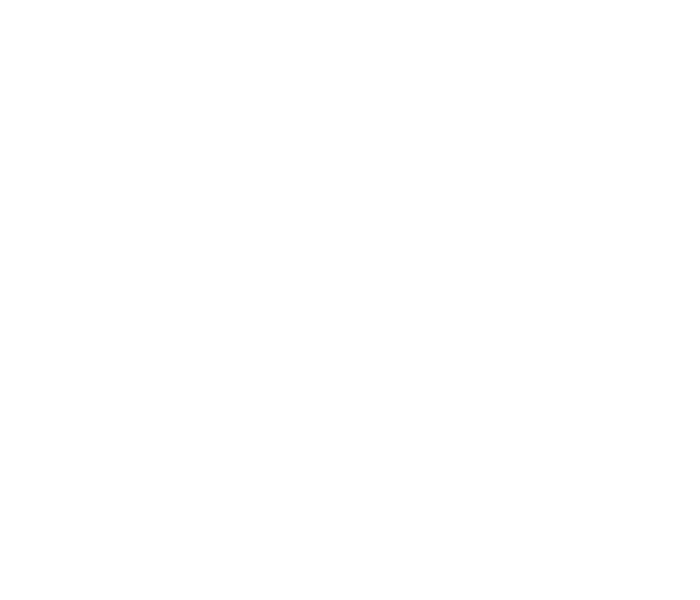

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


<IPython.core.display.Javascript object>


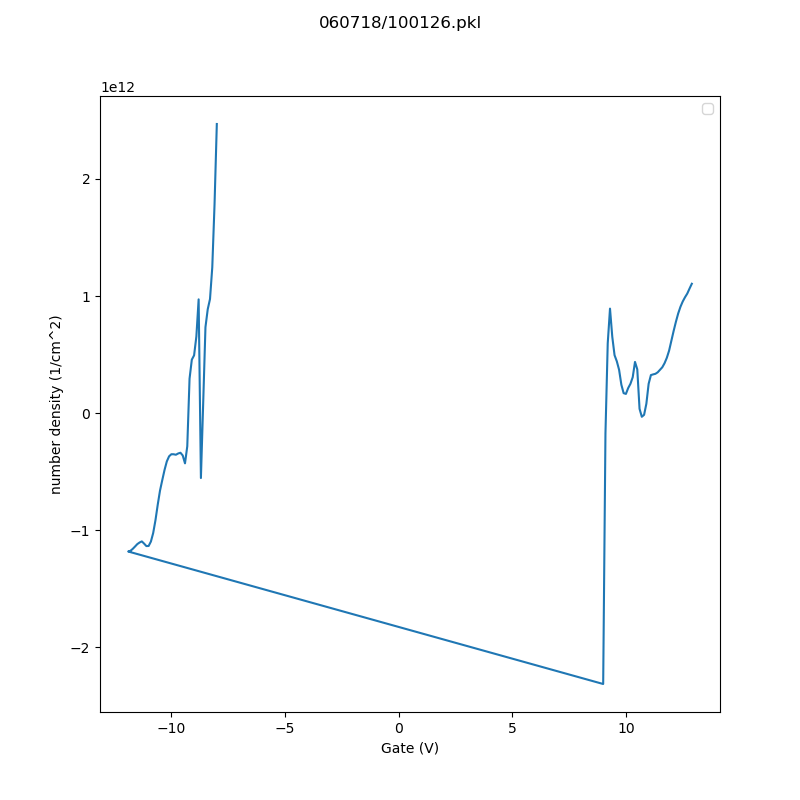

No handles with labels found to put in legend.


(4.004032315094318, 0.0004089242965142748)

In [297]:
data = loaddata('060118/120110.pkl')
fig = plt.figure(figsize=(7, 6)) 
#plt.title('Rxy')
#plt.xlabel('Magnet Current(I)')
#plt.ylabel('Rxy')
#plt.xlim(13,34)
IMag_half = np.zeros(int(len(data.IMag)-8))
GateV_half = np.zeros(int(len(data.GateV)))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))
Rxy_half = np.zeros((len(IMag_half),len(GateV_half)))
#plt.zlabel('Rxx')
i_shift = 8
j_shift = 0*int(len(data.GateV)/2)
for i in range(len(IMag_half)):
    IMag_half[i]=data.IMag[i+i_shift]
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i+j_shift]
data_cut=B_Vg_R_data(IMag_half,GateV_half,0)
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        data_cut.Rxx[i][j] = data.Rxx[i+i_shift][j+j_shift]
        data_cut.Vxx[i][j] = data.Vxx[i+i_shift][j+j_shift]
        data_cut.Vxy[i][j] = data.Vxy[i+i_shift][j+j_shift]
        Rxy_half[i][j] = V_to_R(data_cut.Vxy[i][j][0]) 
#X, Y = np.meshgrid(IMag_half, GateV_half)
#plt.pcolor(Tp(Y),Tp(X), Rxy_half-0*Rxx_half)
#plt.colorbar()
B_Vg_R_to_Vg_to_n(data_cut)
#for i in range(len(GateV_half)):
#    if i%2==0:
#        plt.plot(IMag_half,Tp(Tp(Rxy_half)[i]-0*Tp(Rxx_half)[i]),label="%1.1f V"%GateV_half[i])


#plt.clim(0,50000)
#plt.imshow()
plt.show()
plt.legend()
#plt.savefig(data.filename+'B_VBoth_Rxx_heatmap'+'.png')
data.T


<IPython.core.display.Javascript object>


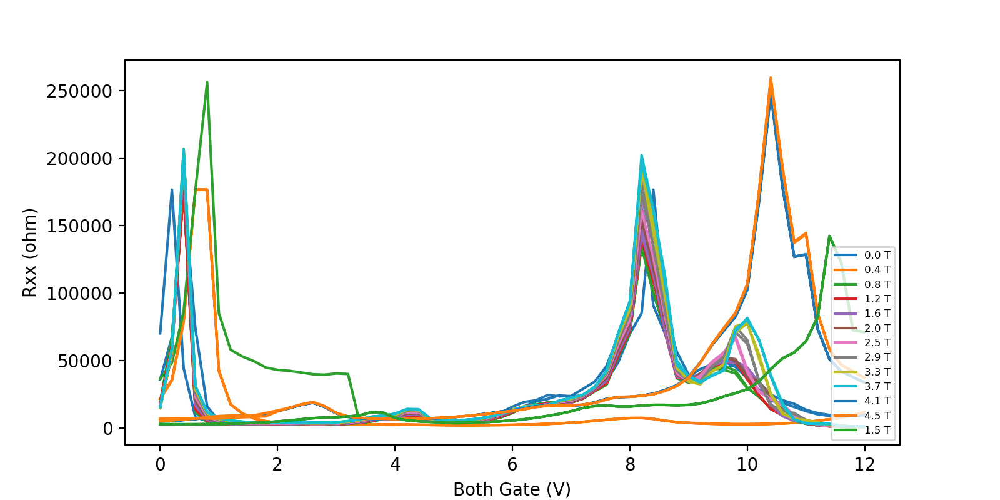

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [39]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vboth_neg'+'.png')
plt.show()

<IPython.core.display.Javascript object>


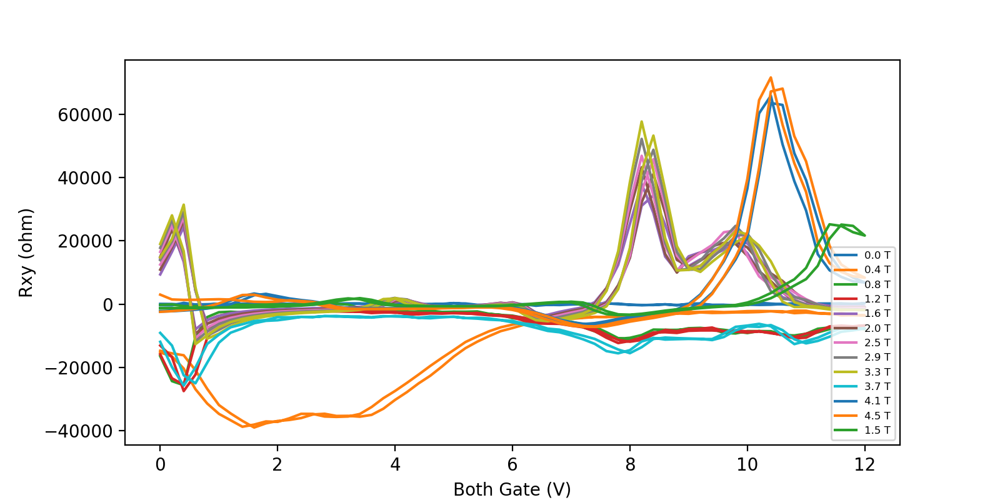

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [40]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i]-0*data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy_fine'+'.png')
plt.show()

<IPython.core.display.Javascript object>


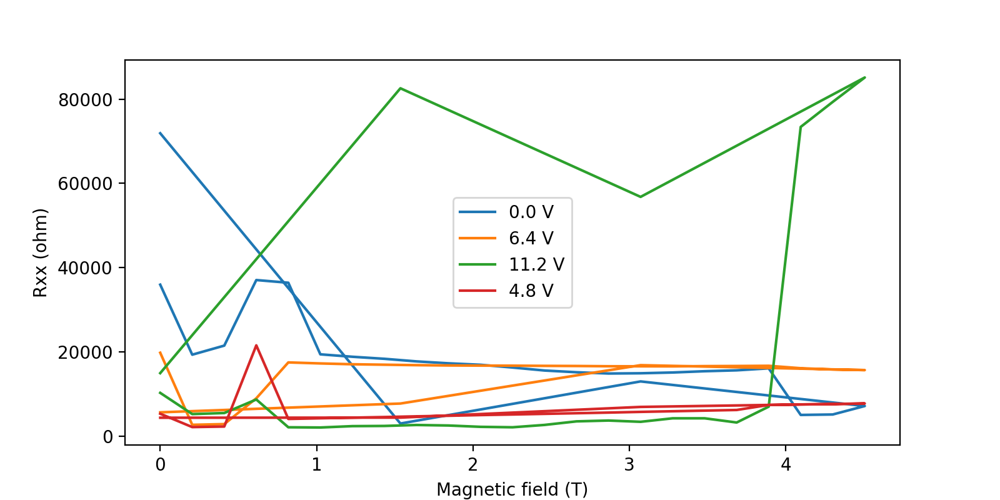

In [43]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Magnetic field (T)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
for j in range(len(data.IMag)):
    B[j] = IMag_to_B(data.IMag[j])
for i in range(len(data.GateV)):
    if i%32 == 0:
        plt.plot(B,Tp(Tp(data.Rxx)[i]),label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend()
#plt.savefig(data.filename+'_B_Rxx'+'.png')
plt.show()



<IPython.core.display.Javascript object>


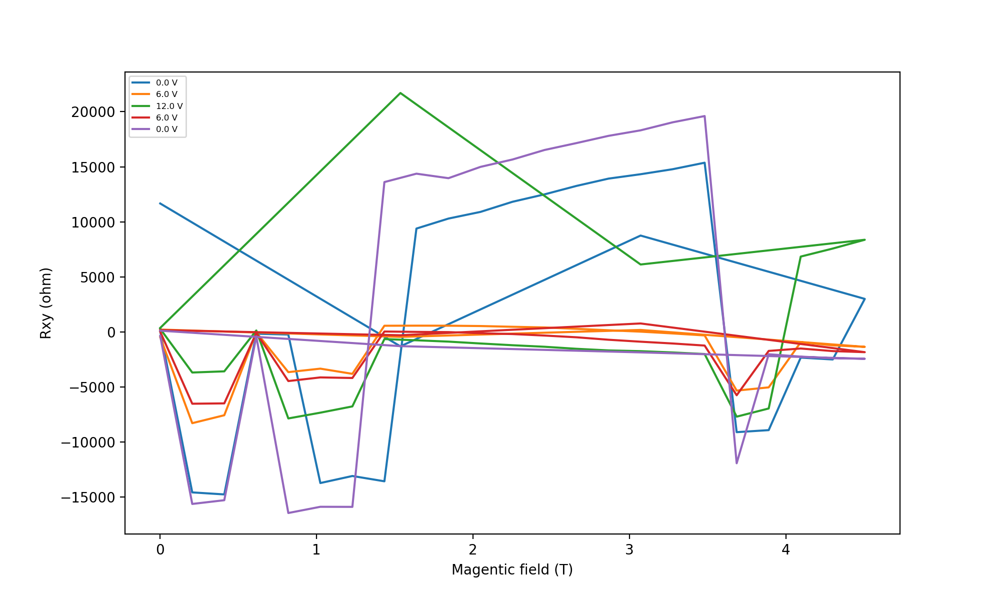

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [46]:
fig = plt.figure(figsize=(10, 6))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Magentic field (T)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = Tp(np.zeros((len(data.IMag),len(data.GateV))))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[i][j]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.GateV)):
    if i%30 == 0:
        plt.plot(B,Rxy[i],label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'upper left', fontsize = 6)
#plt.savefig(data.filename+'_B_Rxy_'+'.png')
plt.show()

<IPython.core.display.Javascript object>


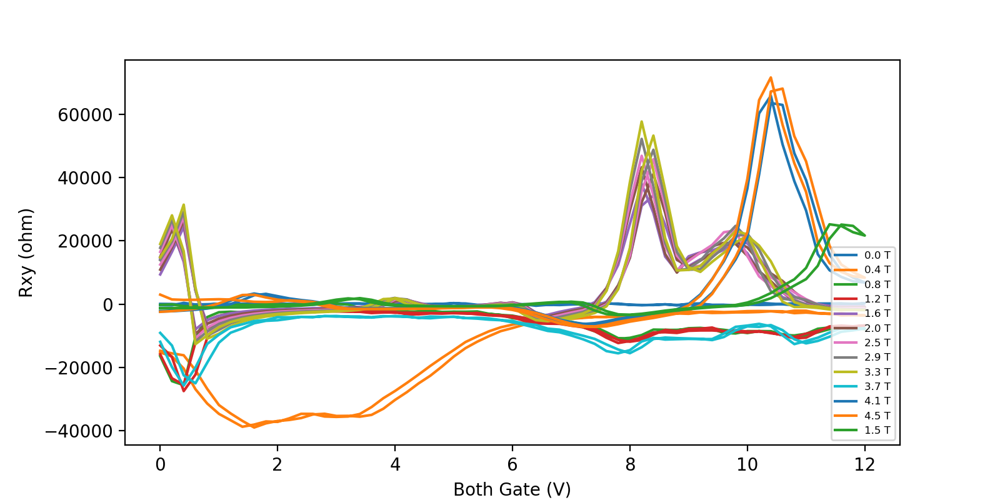

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [44]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy'+'.png')
plt.show()

<IPython.core.display.Javascript object>


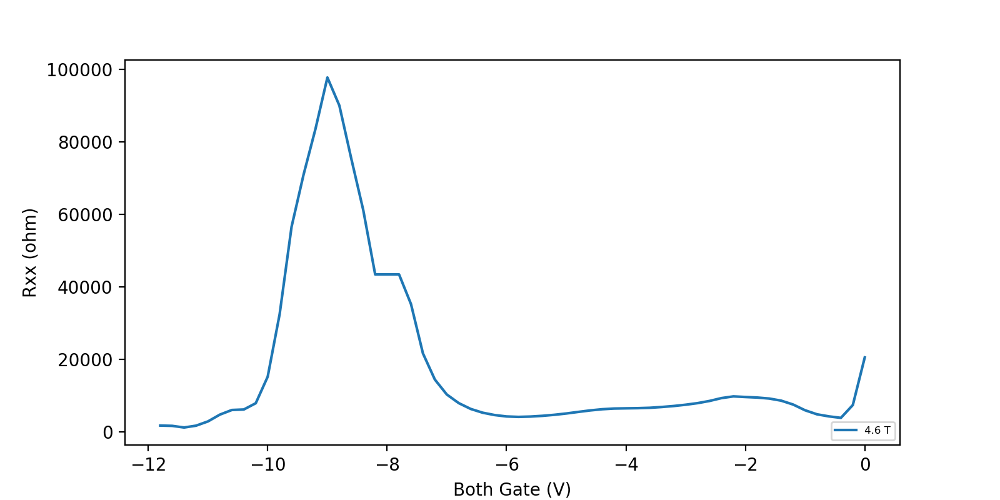

In [57]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vboth_neg'+'.png')
plt.show()

<IPython.core.display.Javascript object>


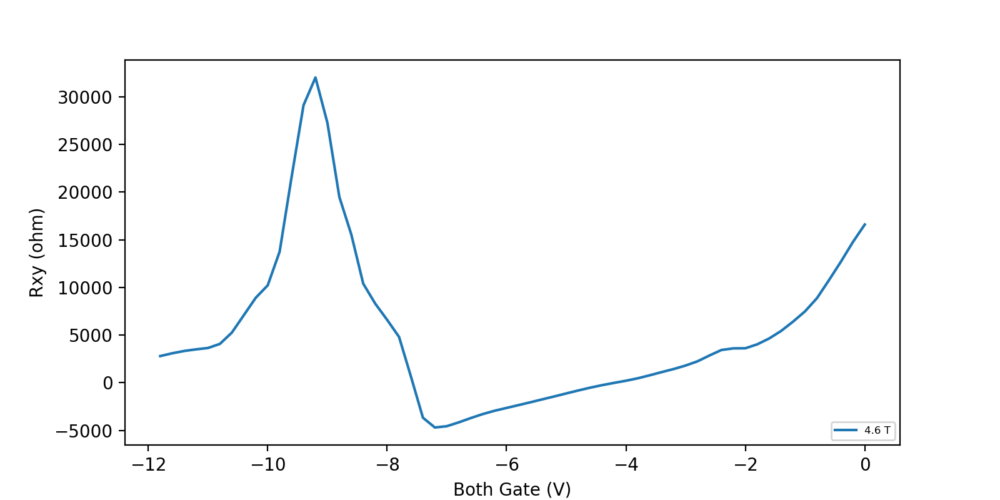

In [65]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i]-0*data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy_fine'+'.png')
plt.show()

<IPython.core.display.Javascript object>


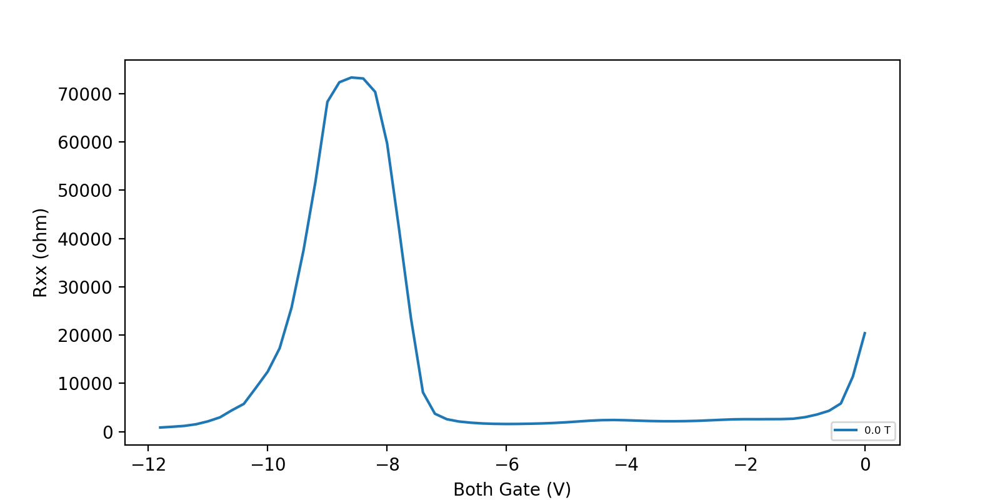

In [34]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vboth_neg'+'.png')
plt.show()

<IPython.core.display.Javascript object>


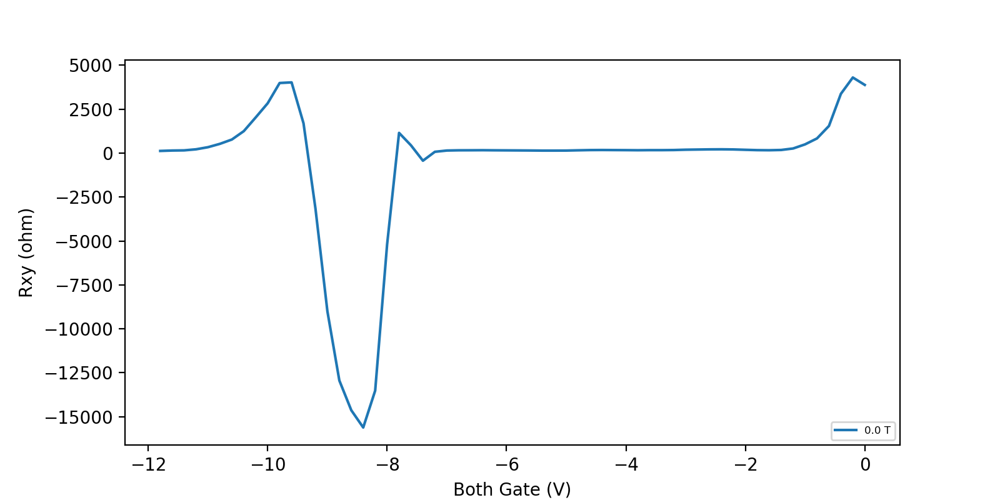

In [35]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy_fine'+'.png')
plt.show()

In [ ]:
R_TG_BG=B_TG_BG(GateV_E3640A,GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[0],np.arange(0,8,1),np.arange(20,-40,-0.5),2)

<IPython.core.display.Javascript object>


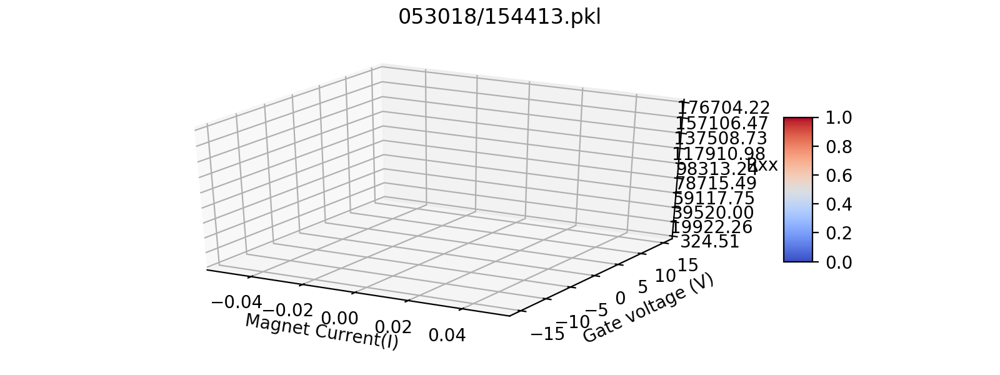

In [35]:
B_Vtop_R=B_Vg_R(GateV_k2400,GateV_E3640A,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[0], np.arange(-15,15,0.2),3)# IMag=0, Vg[],delay 

In [ ]:
B_Vboth_R=B_Vg_R(GateV_k2400,GateV_E3640A,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[0,47,2], np.arange(0,-12,-0.2),4)# IMag=0, Vg[],delay 

<IPython.core.display.Javascript object>


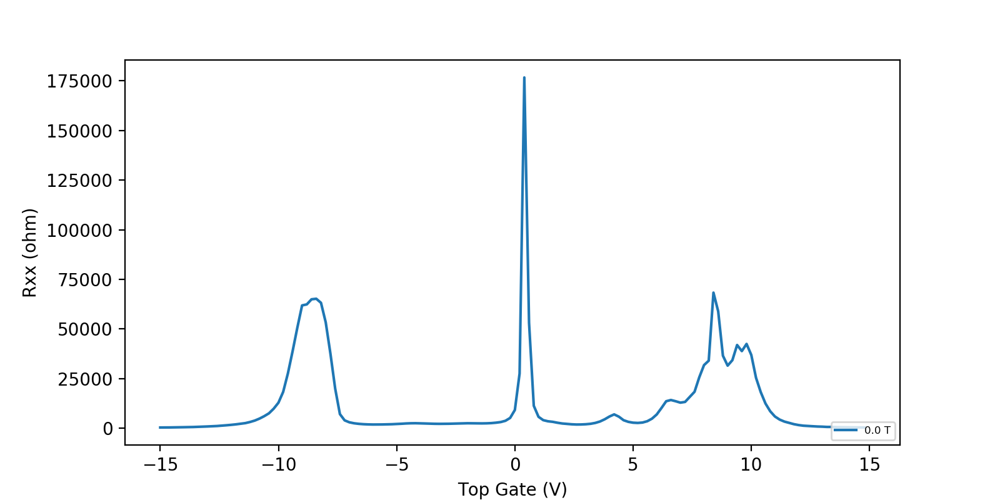

In [37]:
fig = plt.figure(figsize=(8, 4))
data = B_Vtop_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
plt.savefig(data.filename+'_Vtop_Rxx'+'.png')
plt.show()

<IPython.core.display.Javascript object>


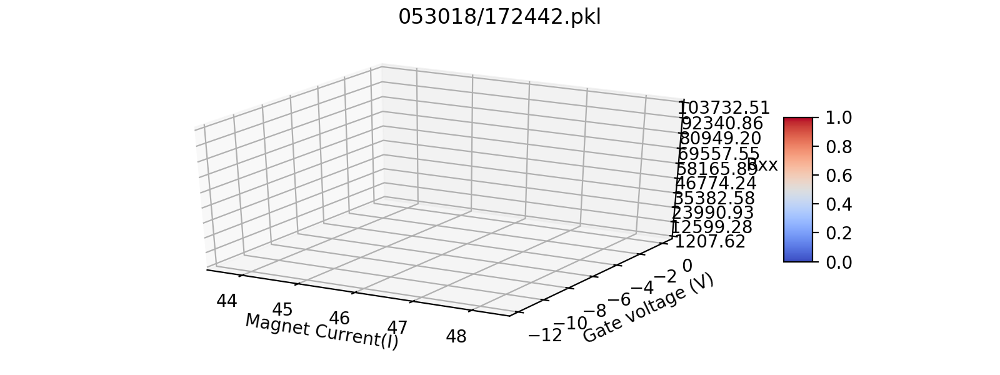

In [22]:
B_Vboth_R=B_Vg_R(GateV_k2400,GateV_E3640A,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[46], np.arange(0,-12,-0.2),3)# IMag=0, Vg[],delay 

<IPython.core.display.Javascript object>


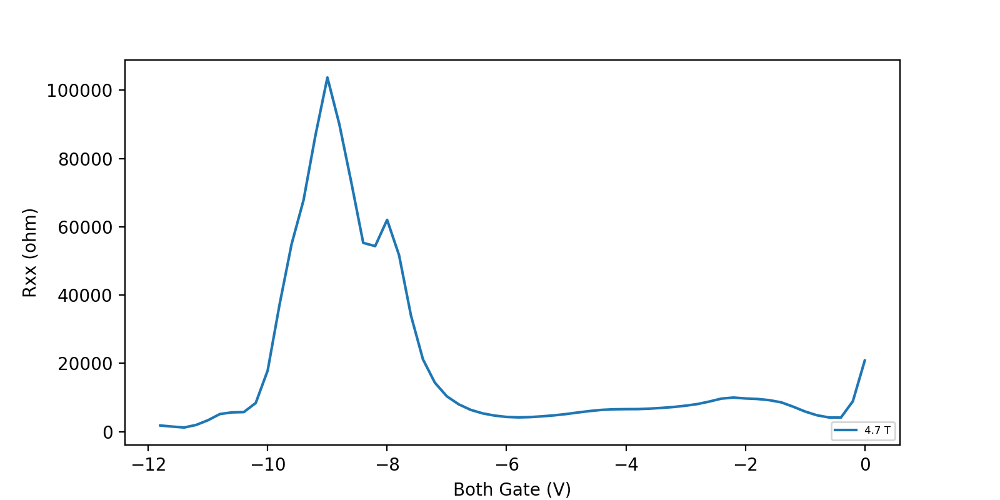

In [24]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vboth_neg'+'.png')
plt.show()

<IPython.core.display.Javascript object>


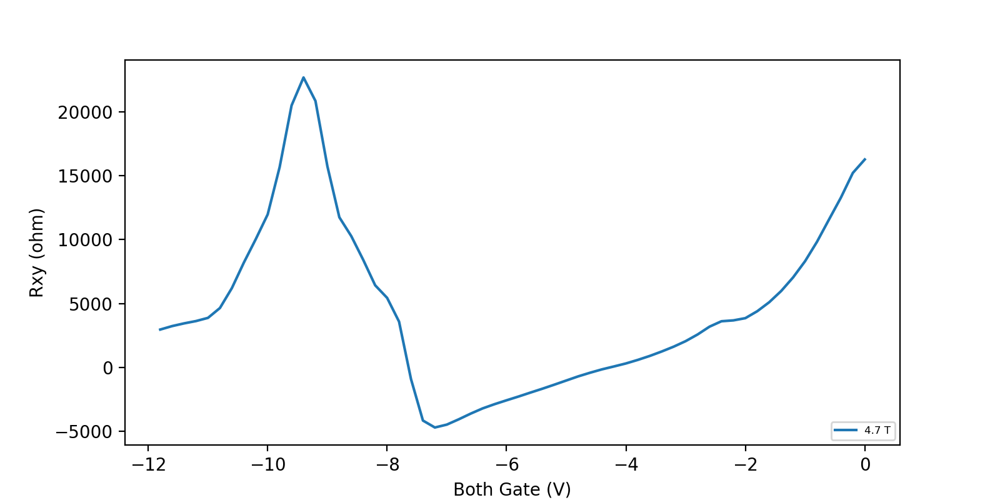

In [25]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy_fine'+'.png')
plt.show()

<IPython.core.display.Javascript object>


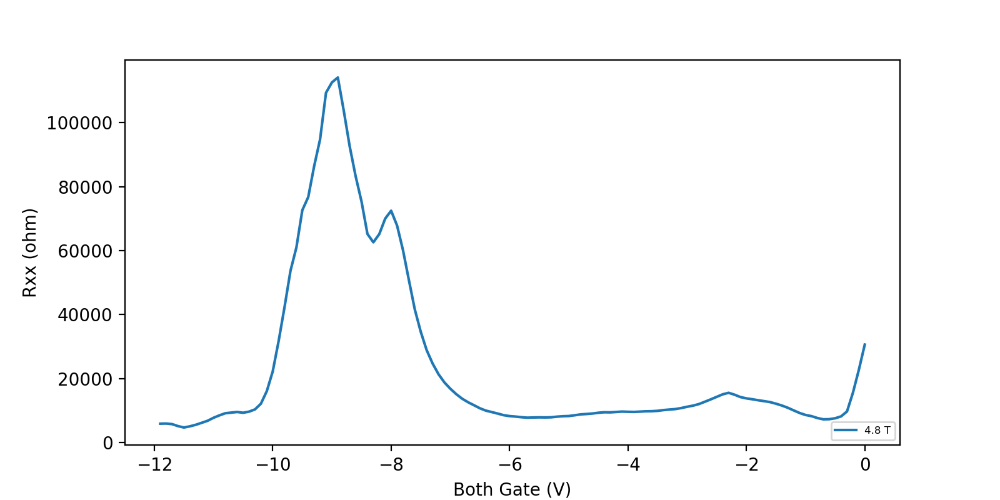

In [20]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'Rxx_Vboth_neg'+'.png')
plt.show()

<IPython.core.display.Javascript object>


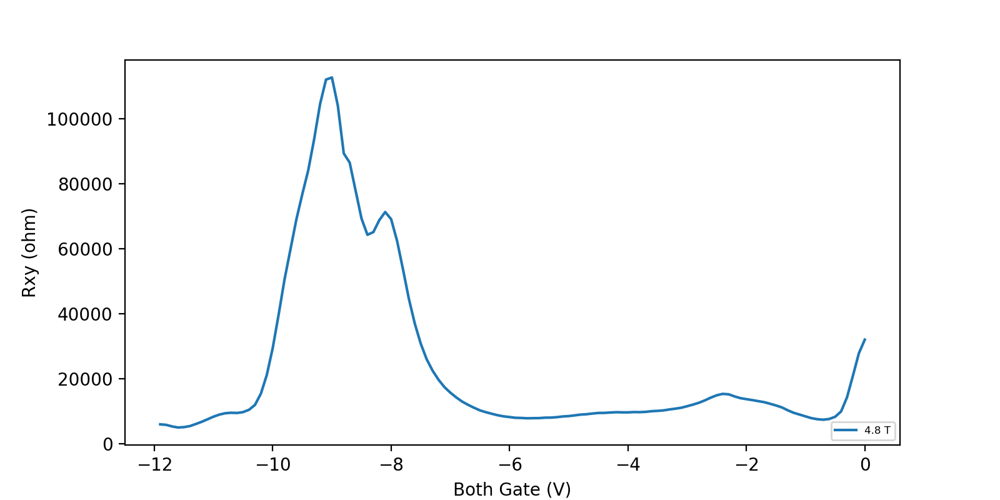

In [21]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy_fine'+'.png')
plt.show()

<IPython.core.display.Javascript object>


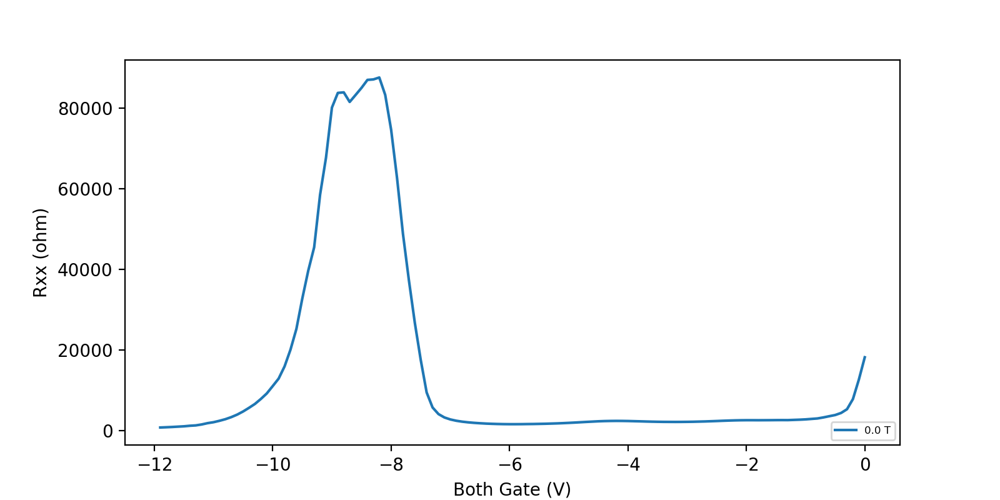

In [15]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
plt.savefig(data.filename+'Rxx_Vboth_neg'+'.png')
plt.show()

<IPython.core.display.Javascript object>


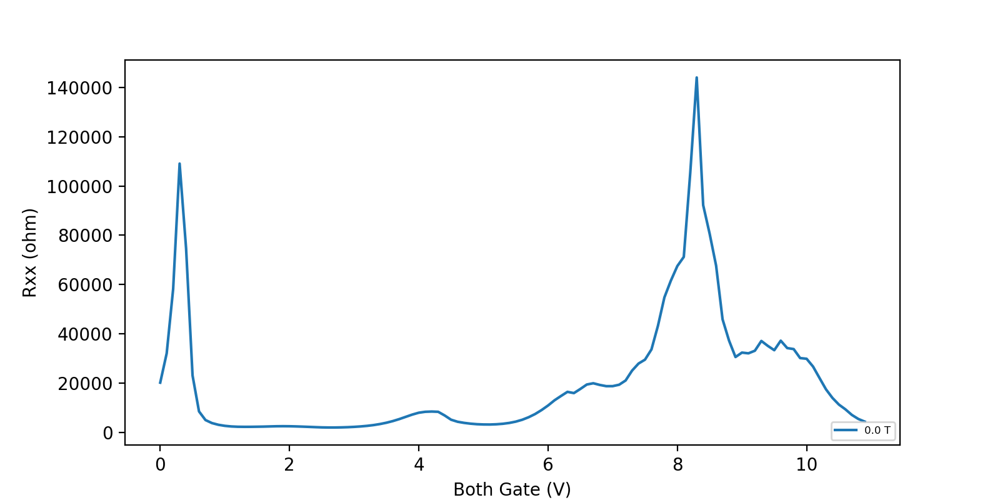

In [9]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
plt.savefig(data.filename+'Rxx_Vboth_pos'+'.png')
plt.show()

<IPython.core.display.Javascript object>


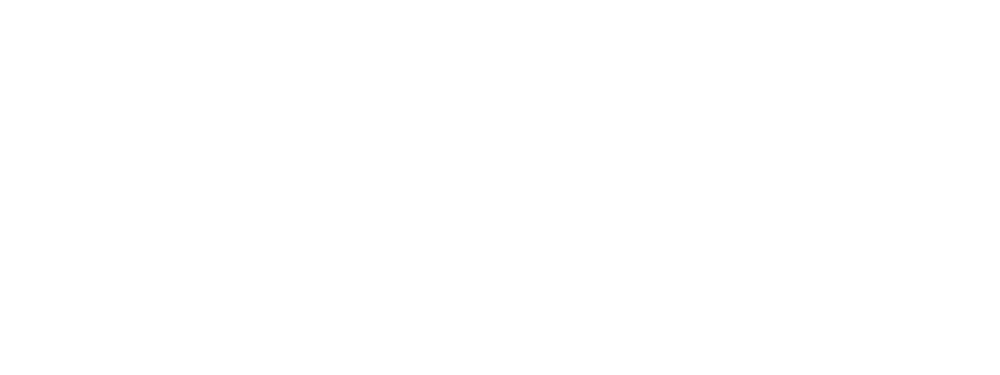

[0.000251414, -1.32025e-05]


KeyboardInterrupt: 

In [5]:
R_TG_BG=B_TG_BG(GateV_E3640A,GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[30],np.arange(0,8,1),np.arange(20,-40,-0.5),2)

<IPython.core.display.Javascript object>


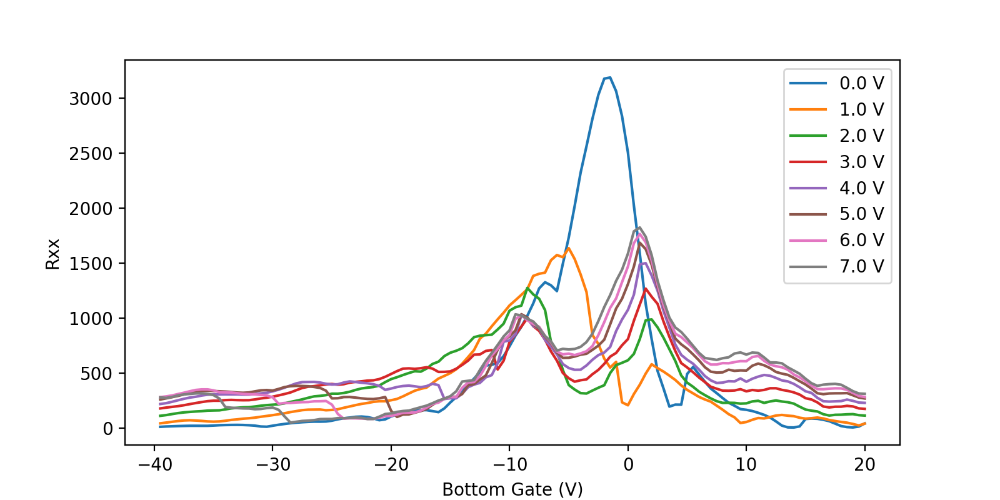

In [460]:
fig = plt.figure(figsize=(8, 4))
data = R_TG_BG
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Bottom Gate (V)')
plt.ylabel('Rxx')
for i in range(len(data.TGateV)):
    plt.plot(data.BGateV,data.Rxx[0][i],label="%1.1f V"%data.TGateV[i])
#X, Y = np.meshgrid(data.TGateV,data.BGateV)
#plt.pcolor(X, Y, np.transpose(data.Rxx[0]))
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend()
plt.savefig(data.filename+'30A_BGate_Rxx'+'.png')
plt.show()

<IPython.core.display.Javascript object>


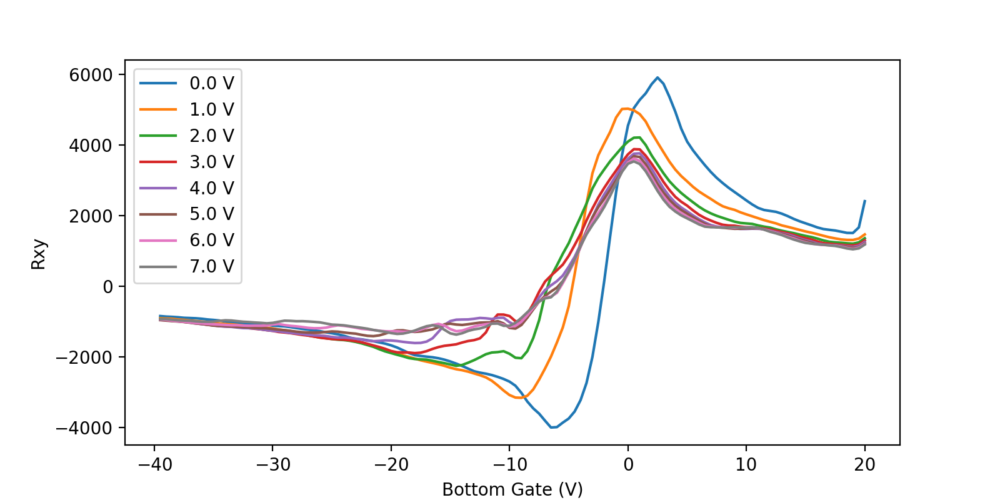

In [469]:
fig = plt.figure(figsize=(8, 4))
data = R_TG_BG
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Bottom Gate (V)')
plt.ylabel('Rxy')
Rxy = np.zeros((len(data.TGateV),len(data.BGateV)))


for i in range(len(data.TGateV)):
    for j in range(len(data.BGateV)):
        Rxy[i][j]= V_to_R(data.Vxy[0][i][j][0])
    
for i in range(len(data.TGateV)):
    plt.plot(data.BGateV,Rxy[i],label="%1.1f V"%data.TGateV[i])
#X, Y = np.meshgrid(data.TGateV,data.BGateV)
#plt.pcolor(X, Y, np.transpose(data.Rxx[0]))
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend()
plt.savefig(data.filename+'30A_BGate_Rxy'+'.png')
plt.show()

In [32]:
R_TG_BG = loaddata('052518/151214.pkl')

<IPython.core.display.Javascript object>


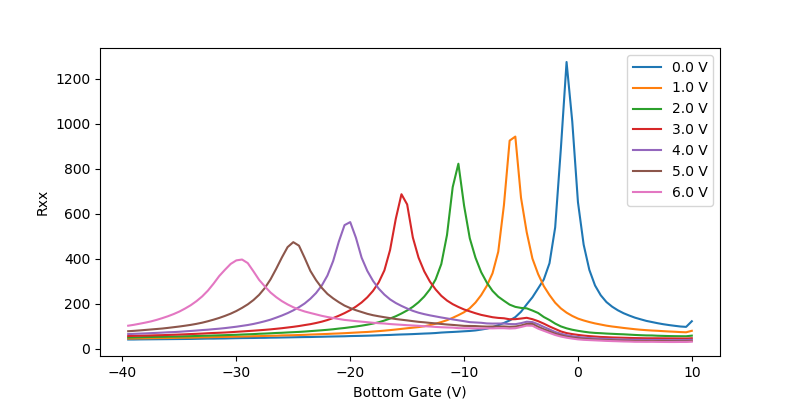

In [33]:
    fig = plt.figure(figsize=(8, 4))
    data = R_TG_BG
    # not sure what to plot...
    #ax1=plt.axes(projection='2d')
    plt.xlabel('Bottom Gate (V)')
    plt.ylabel('Rxx')
    for i in range(len(data.TGateV)):
        plt.plot(data.BGateV,data.Rxx[0][i],label="%1.1f V"%data.TGateV[i])
    #ax1.set_zlabel('Rxx')
    #X, Y = np.meshgrid(data.IMag, data.GateV)
    #surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
    #ax1.zaxis.set_major_locator(LinearLocator(10))
    #ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    #fig.colorbar(fig, shrink=0.5, aspect=5)
    plt.legend()
    #plt.savefig(data.filename+'.png')
    plt.show()

<IPython.core.display.Javascript object>


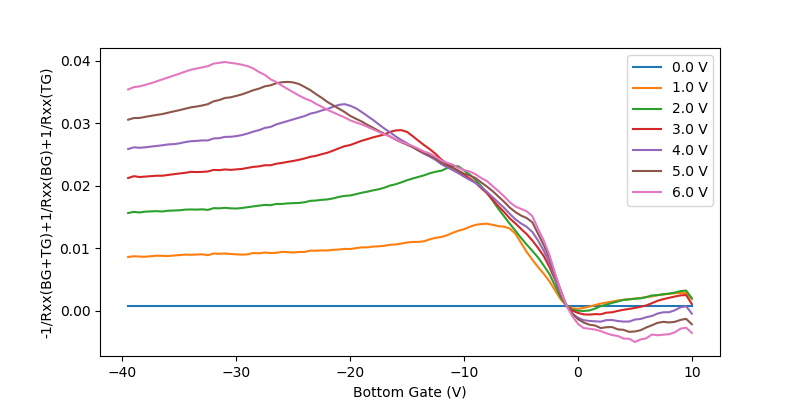

In [45]:
    fig = plt.figure(figsize=(8, 4))
    data = R_TG_BG
    # not sure what to plot...
    #ax1=plt.axes(projection='2d')
    plt.xlabel('Bottom Gate (V)')
    plt.ylabel('-1/Rxx(BG+TG)+1/Rxx(BG)+1/Rxx(TG)')
    Ans = np.zeros((len(data.TGateV),len(data.BGateV)))
    for i in range(len(data.BGateV)):
        for j in range(len(data.TGateV)):
            Ans[j][i]= -1/data.Rxx[0][j][i]+1/data.Rxx[0][0][i]+1/data.Rxx[0][j][22]
    
    for i in range(len(data.TGateV)):
        plt.plot(data.BGateV,Ans[i],label="%1.1f V"%data.TGateV[i])
    #ax1.set_zlabel('Rxx')
    #X, Y = np.meshgrid(data.IMag, data.GateV)
    #surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
    #ax1.zaxis.set_major_locator(LinearLocator(10))
    #ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    #fig.colorbar(fig, shrink=0.5, aspect=5)
    plt.legend()
    #plt.savefig(data.filename+'.png')
    plt.show()

<IPython.core.display.Javascript object>


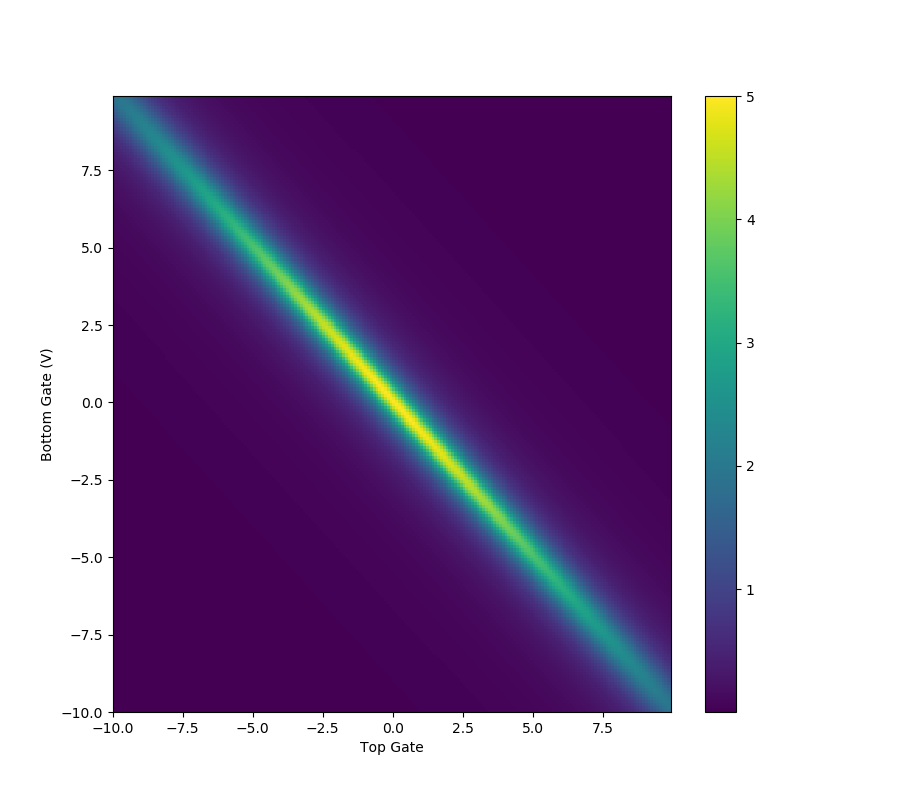

In [69]:
#data = R_TG_BG
#R_0=interp1d(data.BGateV,data.Rxx[0][0])
alpha = 0.52
VT = np.arange(-10,10,0.1)
VB = np.arange(-10,10,0.1)
R_guess = np.zeros((len(VT),len(VB)))
def R_0(x):
    return 1/(0.1+x*x)
for i in range(len(VT)):
    for j in range(len(VB)):
        R_guess[i][j] =  1/(1/R_0((1-alpha)*VT[i]+alpha*VB[j])+1/R_0((1-alpha)*VB[j]+alpha*VT[i]))

fig = plt.figure(figsize=(9, 8)) 
plt.xlabel('Top Gate')
plt.ylabel('Bottom Gate (V)')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(VT,VB)
plt.pcolor(X, Y, np.transpose(R_guess))
#plt.clim(0,0.001)
#plt.imshow()
plt.colorbar()
plt.show()

<IPython.core.display.Javascript object>


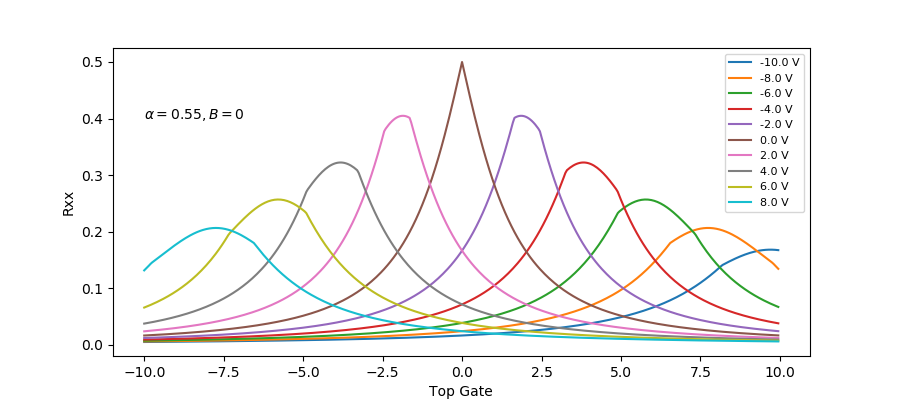

In [253]:
#data = R_TG_BG
#R_0=interp1d(data.BGateV,data.Rxx[0][0])
alpha = 0.55
B_field = 0.0
VT = np.arange(-10,10,0.5)
VB = np.arange(-10,10,0.05)
R_guess = np.zeros((len(VT),len(VB)))
Z_guess = np.zeros((len(VT),len(VB)),dtype=complex)

def R_0(x):
    #return 1/(0.3+1*abs(x)**0.66+8*x**2)
    return 1/(1+abs(x)+x*x)
for i in range(len(VT)):
    for j in range(len(VB)):
        n_T = (1-alpha)*VT[i]+alpha*VB[j]
        n_B = (1-alpha)*VB[j]+alpha*VT[i]
        #R_guess[i][j] =  1/(1/R_0((1-alpha)*VT[i]+alpha*VB[j])+1/R_0((1-alpha)*VB[j]+alpha*VT[i]))
        Z_guess[i][j] =  1/(1/(R_0(n_T)-B_field/n_T*1j)+1/(R_0(n_B)-B_field/n_B*1j))


fig = plt.figure(figsize=(9, 4)) 
plt.xlabel('Top Gate')
plt.ylabel('Rxx')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(VB,VT)
#plt.pcolor(X, Y, np.transpose(R_guess))
#plt.clim(0,0.001)
#plt.imshow()
#plt.colorbar()
for i in range(len(VT)):
    if i% 4 == 0:
        plt.plot(VB,Z_guess[i].real,label="%1.1f V"%VT[i])
plt.legend(fontsize=8)
plt.text(-10, 0.4, r'$\alpha=0.55,B=0$')
plt.savefig('simulated_Rxx_TG_BG_055')
plt.show()

<IPython.core.display.Javascript object>


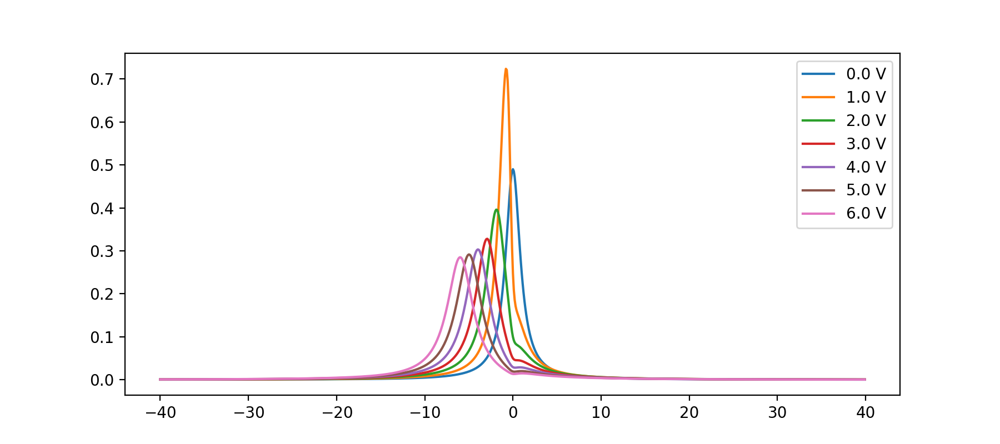

interactive(children=(FloatSlider(value=0.0, description='alpha', max=1.0, step=0.01), FloatSlider(value=0.0, description='B_field', max=1.0, min=-1.0, step=0.01), Output()), _dom_classes=('widget-interact',))

<function __main__.f_VT_VB>

In [468]:
#data = R_TG_BG
#R_0=interp1d(data.BGateV,data.Rxx[0][0])

VT = np.arange(0,7,0.5)
VB = np.arange(-40,40,0.1)
R_guess = np.zeros((len(VT),len(VB)))
Z_guess = np.zeros((len(VT),len(VB)),dtype=complex)
fig = plt.figure(figsize=(9, 4)) 
plt.xlabel('Bottom Gate')
plt.ylabel('R')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(VB,VT)

def R_0(x):
    return 1/(1+x**2)/2

def f_VT_VB(alpha, B_field):
    fig.clear()
    for i in range(len(VT)):
        for j in range(len(VB)):
            n_T = (1-alpha)*VT[i]+alpha*VB[j]
            n_B = (1-alpha)*VB[j]+alpha*VT[i]
            #R_guess[i][j] =  1/(1/R_0((1-alpha)*VT[i]+alpha*VB[j])+1/R_0((1-alpha)*VB[j]+alpha*VT[i]))
            Z_guess[i][j] =  1/(1/(R_0(n_T)-B_field/n_T*1j)+1/(R_0(n_B)-B_field/n_B*1j))
    #plt.pcolor(X, Y, np.transpose(R_guess))
    #plt.clim(0,0.001)
    #plt.imshow()
    #plt.colorbar()
    for i in range(len(VT)):
        if i% 2 == 0:
            plt.plot(VB,Z_guess[i].real,label="%1.1f V"%VT[i])
    plt.legend()
    plt.show()
interact(f_VT_VB, alpha=(0, 1,0.01), B_field=(-1, 1, 0.01) )    

<IPython.core.display.Javascript object>


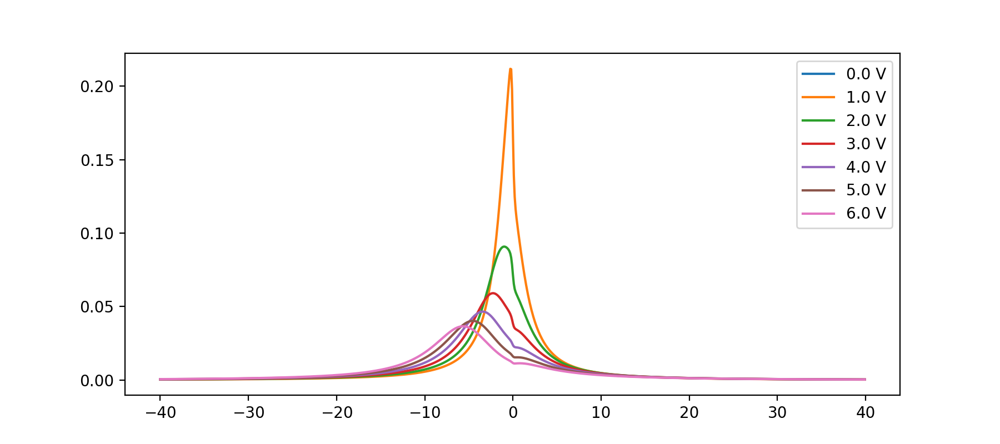

interactive(children=(FloatSlider(value=0.0, description='alpha', max=1.0, step=0.01), FloatSlider(value=0.0, description='B_field', max=1.0, min=-1.0, step=0.01), Output()), _dom_classes=('widget-interact',))

<function __main__.f_VT_VB>

In [467]:
#data = R_TG_BG
#R_0=interp1d(data.BGateV,data.Rxx[0][0])

VT = np.arange(0,7,0.5)
VB = np.arange(-40,40,0.1)
R_guess = np.zeros((len(VT),len(VB)))
Z_guess = np.zeros((len(VT),len(VB)),dtype=complex)
fig = plt.figure(figsize=(9, 4)) 
plt.xlabel('Bottom Gate')
plt.ylabel('R')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(VB,VT)

def R_0(x):
    return 1/(1+abs(x)+x**2)/2

def f_VT_VB(alpha, B_field):
    fig.clear()
    for i in range(len(VT)):
        for j in range(len(VB)):
            n_T = (1-alpha)*VT[i]+alpha*VB[j]
            n_B = (1-alpha)*VB[j]+alpha*VT[i]
            #R_guess[i][j] =  1/(1/R_0((1-alpha)*VT[i]+alpha*VB[j])+1/R_0((1-alpha)*VB[j]+alpha*VT[i]))
            Z_guess[i][j] =  1/(1/(R_0(n_T)-B_field/n_T*1j)+1/(R_0(n_B)-B_field/n_B*1j))
    #plt.pcolor(X, Y, np.transpose(R_guess))
    #plt.clim(0,0.001)
    #plt.imshow()
    #plt.colorbar()
    for i in range(len(VT)):
        if i% 2 == 0:
            plt.plot(VB,Z_guess[i].imag,label="%1.1f V"%VT[i])
    plt.legend()
    plt.show()
interact(f_VT_VB, alpha=(0, 1,0.01), B_field=(-1, 1, 0.01) )  

<IPython.core.display.Javascript object>


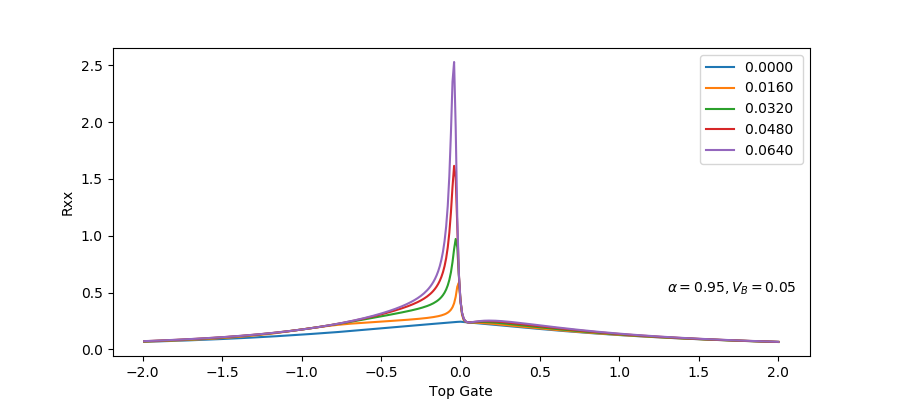

interactive(children=(FloatSlider(value=0.0, description='alpha', max=1.0, step=0.001), FloatSlider(value=0.0, description='VB', max=1.0, min=-1.0, step=0.0001), Output()), _dom_classes=('widget-interact',))

In [235]:
#data = R_TG_BG
#R_0=interp1d(data.BGateV,data.Rxx[0][0])
VT = np.arange(2,-2,-0.01)
B_field = np.arange(0,0.08,.008)
Z_guess = np.zeros((len(B_field),len(VT)),dtype=complex)
fig = plt.figure(figsize=(9, 4)) 
plt.xlabel('Top Gate')
plt.ylabel('Rxx')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(VT,B_field)
def R_0(x):
    return 1/(1+abs(x)+x*x)/2

def f(alpha, VB):
    #for i in range(len(VT)):
    #    for j in range(len(VB)):
    #        n_T = (1-alpha)*VT[i]+alpha*VB[j]
    #        n_B = (1-alpha)*VB[j]+alpha*VT[i]
    #        Z_guess[i][j] =  1/(1/(R_0(n_T)+b/n_T*1j)+1/(R_0(n_B)+b/n_B*1j))

    for i in range(len(B_field)):
        for j in range(len(VT)):
            n_T = (1-alpha)*VT[j]+alpha*VB
            n_B = (1-alpha)*VB+alpha*VT[j]
            Z_guess[i][j] =  1/(1/(R_0(n_T)-B_field[i]/n_T*1j)+1/(R_0(n_B)-B_field[i]/n_B*1j))




    #plt.pcolor(X, Y, np.transpose(R_guess))
    #plt.clim(0,0.001)
    #plt.imshow()
    #plt.colorbar()
    #for i in range(len(B_field)):
    fig.clear()
    for i in range(len(B_field)):
        if i% 2 == 0:
            plt.plot(VT,Z_guess[i].real+0.0*Z_guess[i].imag,label="%1.4f "%B_field[i])
    #ax = fig.gca(projection='3d')
    #surf = ax.plot_surface(X,Y,Z_guess.real-0.01*Z_guess.imag)
    plt.text(1.3, 0.5, r"$\alpha=%1.2f,V_B=%1.2f$"%(alpha,VB))
    plt.xlabel('Top Gate')
    plt.ylabel('Rxx')
    plt.legend()
    plt.show()

interactive_plot = interact(f, alpha=(0, 1,0.001), VB=(-1, 1, 0.0001));


<IPython.core.display.Javascript object>


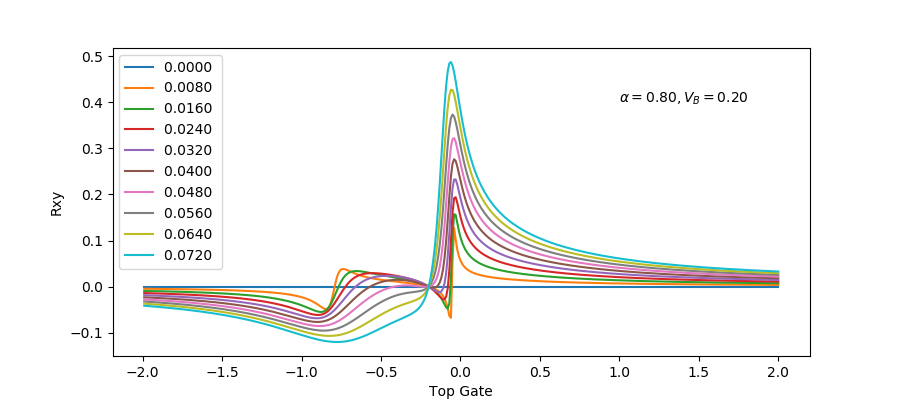

interactive(children=(FloatSlider(value=0.0, description='alpha', max=1.0, step=0.001), FloatSlider(value=0.0, description='VB', max=1.0, min=-1.0, step=0.0001), Output()), _dom_classes=('widget-interact',))

In [239]:
#data = R_TG_BG
#R_0=interp1d(data.BGateV,data.Rxx[0][0])
VT = np.arange(2,-2,-0.01)
B_field = np.arange(0,0.08,0.008)
Z_guess = np.zeros((len(B_field),len(VT)),dtype=complex)
fig = plt.figure(figsize=(9, 4)) 
plt.xlabel('Top Gate')
plt.ylabel('R')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(VT,B_field)
def R_0(x):
    return 1/(1+abs(x)+x*x)/2

def f2(alpha, VB):
    #for i in range(len(VT)):
    #    for j in range(len(VB)):
    #        n_T = (1-alpha)*VT[i]+alpha*VB[j]
    #        n_B = (1-alpha)*VB[j]+alpha*VT[i]
    #        Z_guess[i][j] =  1/(1/(R_0(n_T)+b/n_T*1j)+1/(R_0(n_B)+b/n_B*1j))

    for i in range(len(B_field)):
        for j in range(len(VT)):
            n_T = (1-alpha)*VT[j]+alpha*VB
            n_B = (1-alpha)*VB+alpha*VT[j]
            Z_guess[i][j] =  1/(1/(R_0(n_T)-B_field[i]/n_T*1j)+1/(R_0(n_B)-B_field[i]/n_B*1j))




    #plt.pcolor(X, Y, np.transpose(R_guess))
    #plt.clim(0,0.001)
    #plt.imshow()
    #plt.colorbar()
    #for i in range(len(B_field)):
    fig.clear()
    plt.xlabel('Top Gate')
    plt.ylabel('Rxy')
    for i in range(len(B_field)):
        #if i% 2 == 0:
        plt.plot(VT,-Z_guess[i].imag+0.0000*Z_guess[i].real,label="%1.4f "%B_field[i])
    #ax = fig.gca(projection='3d')
    #surf = ax.plot_surface(X,Y,Z_guess.real-0.01*Z_guess.imag)
    plt.text(1, 0.4, r"$\alpha=%1.2f,V_B=%1.2f$"%(alpha,VB))
    plt.legend()
    plt.show()

interactive_plot = interact(f2, alpha=(0, 1,0.001), VB=(-1, 1, 0.0001));



<IPython.core.display.Javascript object>


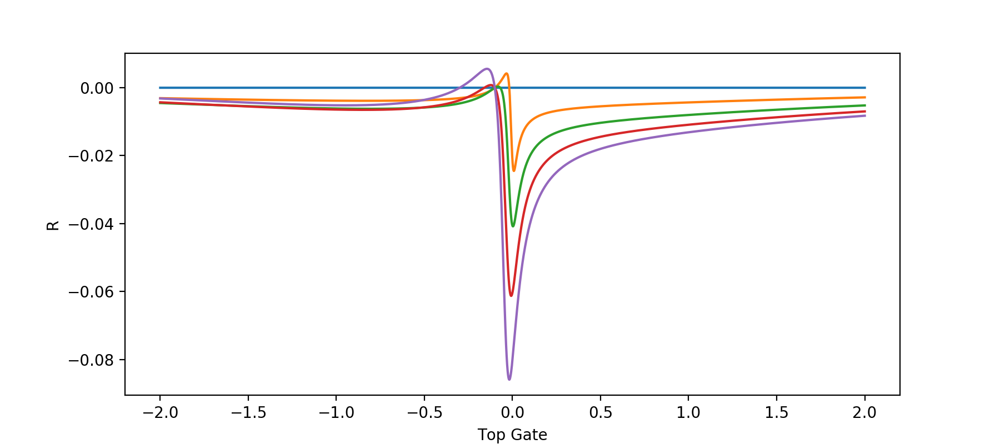

In [434]:
#data = R_TG_BG
#R_0=interp1d(data.BGateV,data.Rxx[0][0])
alpha = 0.99
VB = 0.1
VT = np.arange(2,-2,-0.001)
B_field = np.arange(0,0.01,0.001)
Z_guess = np.zeros((len(B_field),len(VT)),dtype=complex)

def R_0(x):
    return 1/(10+abs(x)+x*x)/2
#for i in range(len(VT)):
#    for j in range(len(VB)):
#        n_T = (1-alpha)*VT[i]+alpha*VB[j]
#        n_B = (1-alpha)*VB[j]+alpha*VT[i]
#        Z_guess[i][j] =  1/(1/(R_0(n_T)+b/n_T*1j)+1/(R_0(n_B)+b/n_B*1j))

for i in range(len(B_field)):
    for j in range(len(VT)):
        n_T = (1-alpha)*VT[j]+alpha*VB
        n_B = (1-alpha)*VB+alpha*VT[j]
        Z_guess[i][j] =  1/(1/(R_0(n_T)-B_field[i]/n_T*1j)+1/(R_0(n_B)-B_field[i]/n_B*1j))

        

fig = plt.figure(figsize=(9, 4)) 
plt.xlabel('Top Gate')
plt.ylabel('R')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(VT,B_field)
#plt.pcolor(X, Y, np.transpose(R_guess))
#plt.clim(0,0.001)
#plt.imshow()
#plt.colorbar()
#for i in range(len(B_field)):
for i in range(len(B_field)):
    if i% 2 == 0:
        plt.plot(VT,Z_guess[i].imag,label="%1.4f "%B_field[i])
        
#ax = fig.gca(projection='3d')
#surf = ax.plot_surface(X,Y,Z_guess.real)
#plt.legend()
plt.show()

<IPython.core.display.Javascript object>


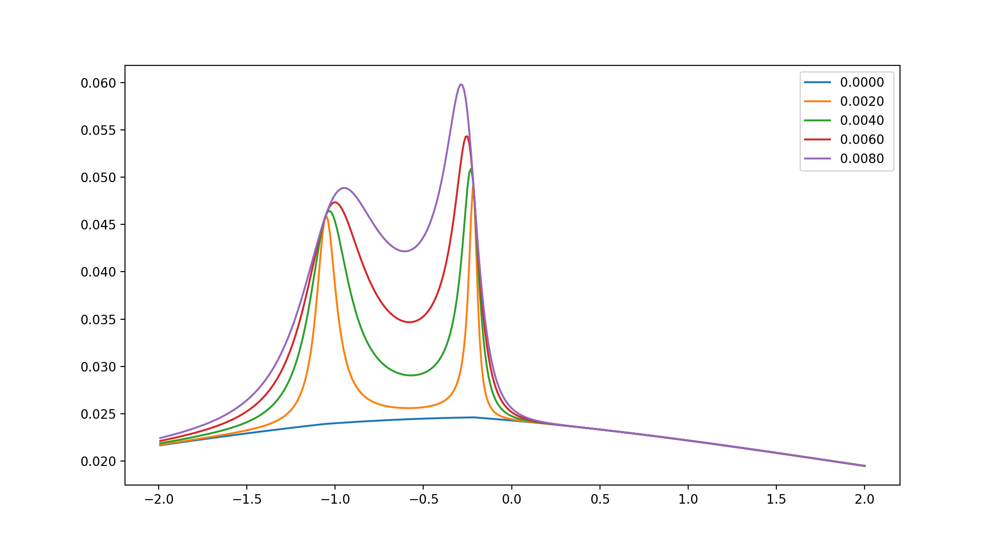

interactive(children=(FloatSlider(value=0.0, description='alpha', max=1.0, step=0.01), FloatSlider(value=0.0, description='VB', max=1.0, min=-1.0, step=0.01), Output()), _dom_classes=('widget-interact',))

<function __main__.surf_f>

In [419]:
#data = R_TG_BG
#R_0=interp1d(data.BGateV,data.Rxx[0][0])
alpha = 0.99
VB = 0.1
VT = np.arange(2,-2,-0.01)
B_field = np.arange(0,0.01,0.001)
Z_guess = np.zeros((len(B_field),len(VT)),dtype=complex)
fig = plt.figure(figsize=(11, 6)) 
ax = fig.gca(projection='3d')
plt.xlabel('Top Gate')
plt.ylabel('R')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(VT,B_field)

def R_0(x):
    return 1/(10+abs(x)+x*x)/2
#for i in range(len(VT)):
#    for j in range(len(VB)):
#        n_T = (1-alpha)*VT[i]+alpha*VB[j]
#        n_B = (1-alpha)*VB[j]+alpha*VT[i]
#        Z_guess[i][j] =  1/(1/(R_0(n_T)+b/n_T*1j)+1/(R_0(n_B)+b/n_B*1j))
def surf_f(alpha,VB):
    fig.clear()
    for i in range(len(B_field)):
        for j in range(len(VT)):
            n_T = (1-alpha)*VT[j]+alpha*VB
            n_B = (1-alpha)*VB+alpha*VT[j]
            Z_guess[i][j] =  1/(1/(R_0(n_T)-B_field[i]/n_T*1j)+1/(R_0(n_B)-B_field[i]/n_B*1j))

    
    #plt.pcolor(X, Y, np.transpose(R_guess))
    #plt.clim(0,0.001)
    #plt.imshow()
    #plt.colorbar()
    #for i in range(len(B_field)):
    #for i in range(len(B_field)):
    #    if i% 2 == 0:
    #        plt.plot(VT,Z_guess[i]-0.1*Z_guess.imag[i],label="%1.4f "%B_field[i])
    fig.gca(projection='3d')
    surf = ax.plot_surface(X,Y,-Z_guess.imag+0.0*Z_guess.real)
    #plt.legend()
    plt.show()
interact(surf_f, alpha=(0,1,0.01),VB=(-1,1,0.01))

In [38]:
SweepBothGate(GateV_k2400,GateV_E3640A,0)

In [42]:
IsweepMag(MagI_hp6031_U,0)

In [43]:
V_to_R(readsrs(lock_Vxx)[0])

[8.53245e-05, 4.55978e-06]


675.2303821947456

<IPython.core.display.Javascript object>


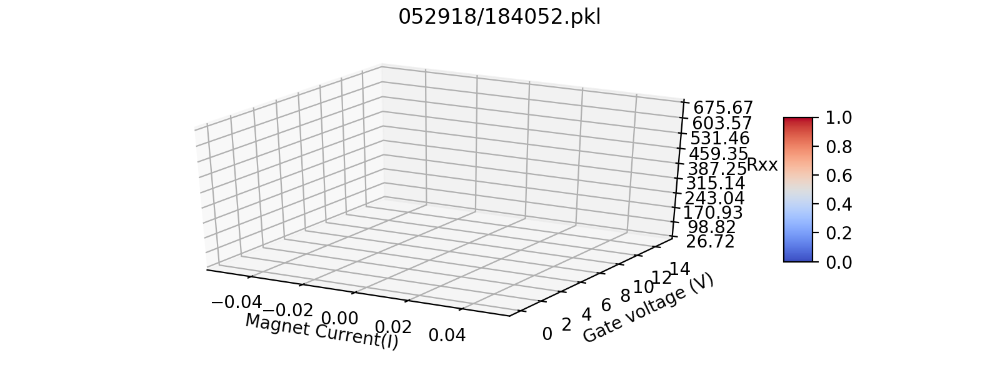

In [44]:
B_Vboth_R=B_Vg_R(GateV_k2400,GateV_E3640A,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[0], np.arange(0,15,0.4),4)# IMag=0, Vg[],delay 

<IPython.core.display.Javascript object>


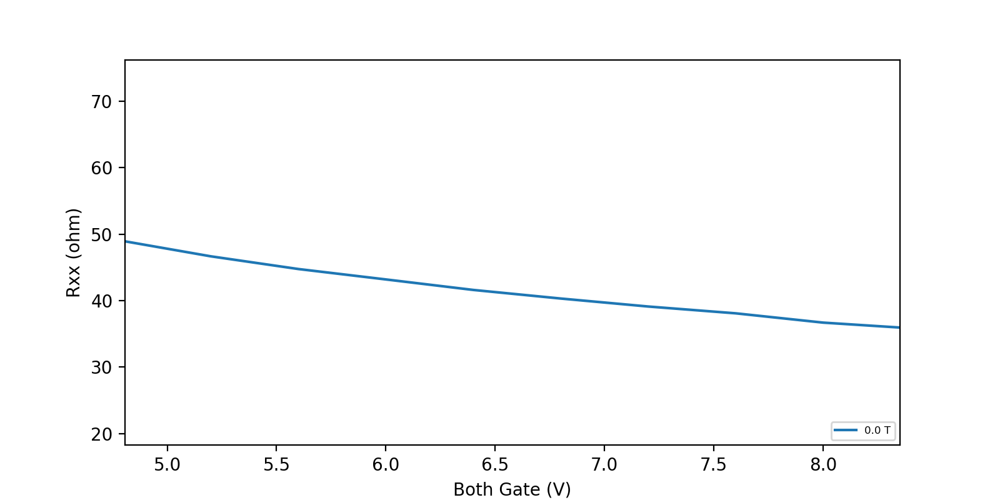

In [45]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxx_fine'+'.png')
plt.show()

<IPython.core.display.Javascript object>


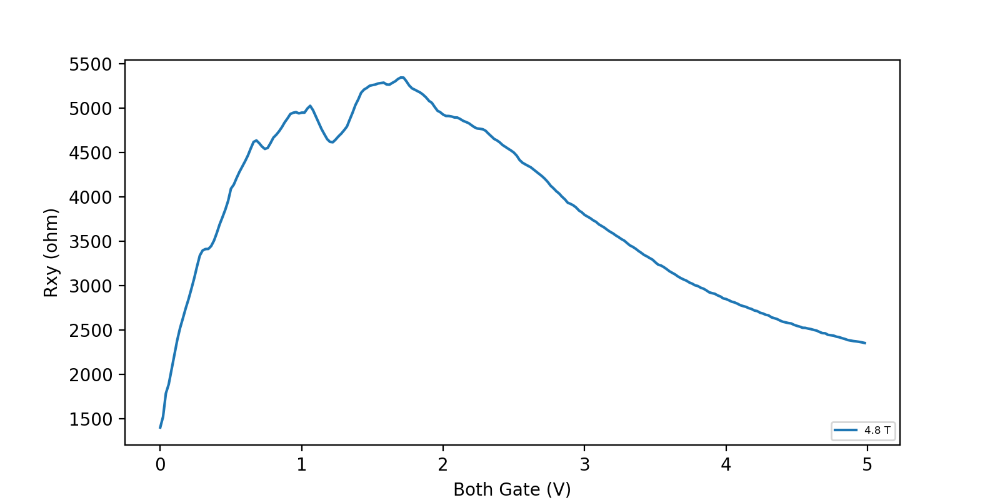

In [20]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy_fine'+'.png')
plt.show()

<IPython.core.display.Javascript object>


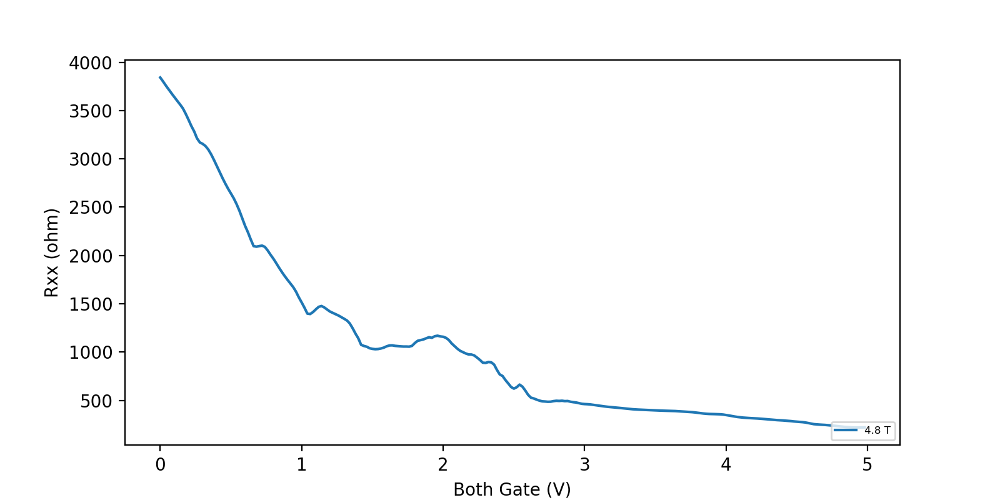

In [21]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxx_fine'+'.png')
plt.show()

<IPython.core.display.Javascript object>


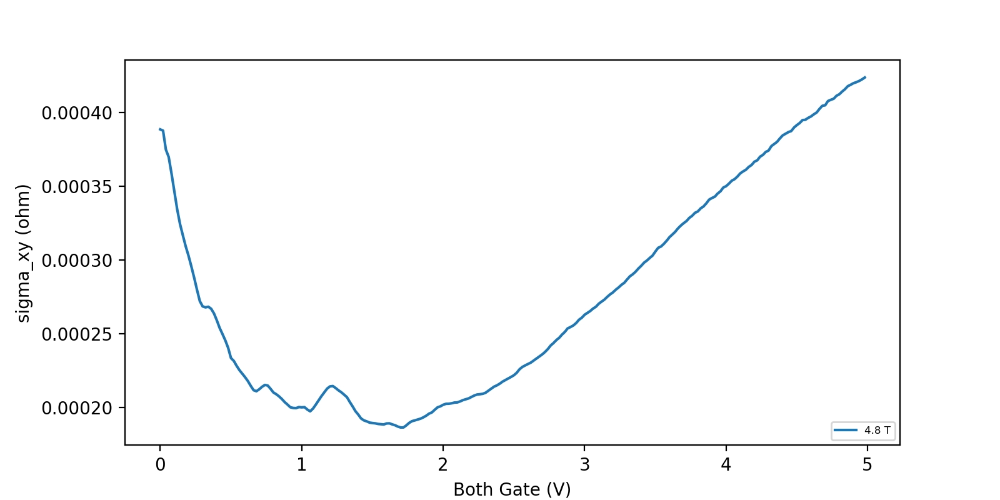

In [22]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('sigma_xy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
sigma_xy = np.zeros((len(data.IMag),len(data.GateV)))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])
        sigma_xy[j][i] = Rxy[j][i]/(data.Rxx[j][i]**2/9.0+Rxy[j][i]**2)

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,sigma_xy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
plt.savefig(data.filename+'_Vboth_sigma_xy'+'.png')
plt.show()

<IPython.core.display.Javascript object>


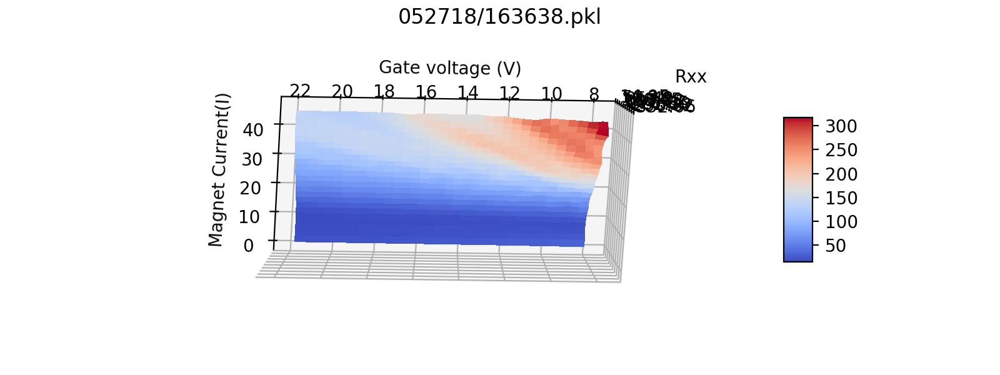

In [529]:
B_Vboth_R=B_Vg_R(GateV_k2400,GateV_E3640A,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,np.arange(0,47,2), np.arange(8, 22, 0.2),3)# IMag=0, Vg[],delay 

<IPython.core.display.Javascript object>


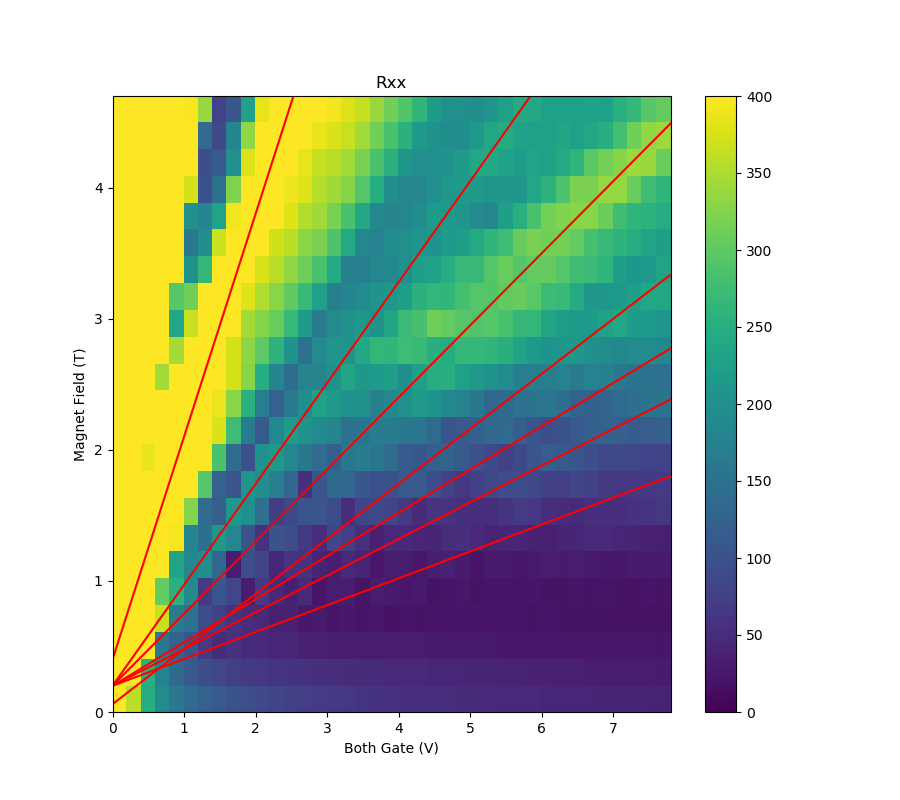

(4.039108350993581, 0.00019528615268737774)

In [506]:
data = loaddata('052718/134318.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxx')
plt.ylabel('Magnet Field (T)')
plt.xlabel('Both Gate (V)')
plt.ylim(0,4.7)
B = np.zeros(len(data.IMag))
#plt.zlabel('Rxx')
for j in range(len(data.IMag)):
    B[j] = IMag_to_B(data.IMag[j])
X, Y = np.meshgrid(data.GateV,B)
plt.pcolor(X, Y, data.Rxx)
plt.clim(0,400)
#plt.imshow()
plt.colorbar()
plt.show()
plt.plot
#Int_Rxx = interp1d.bisplrep(X, Y, Z,s=0)
#plt.savefig(data.filename+'B_Vboth_Rxx'+'.png')
#cost
def cost(a,b):

    return np.average(griddata((X.flatten(),Y.flatten()),data.Rxx.flatten(),Tp((data.GateV[0],a*data.GateV[0]+b)),'nearest'))

a,b= 1.7,0.4
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.77,0.2#1.54
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.55,0.2#1.65
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.42,0.06#1.68
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.33,0.2#1.66
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.28,0.2#
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.205,0.2
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
data.T

<IPython.core.display.Javascript object>


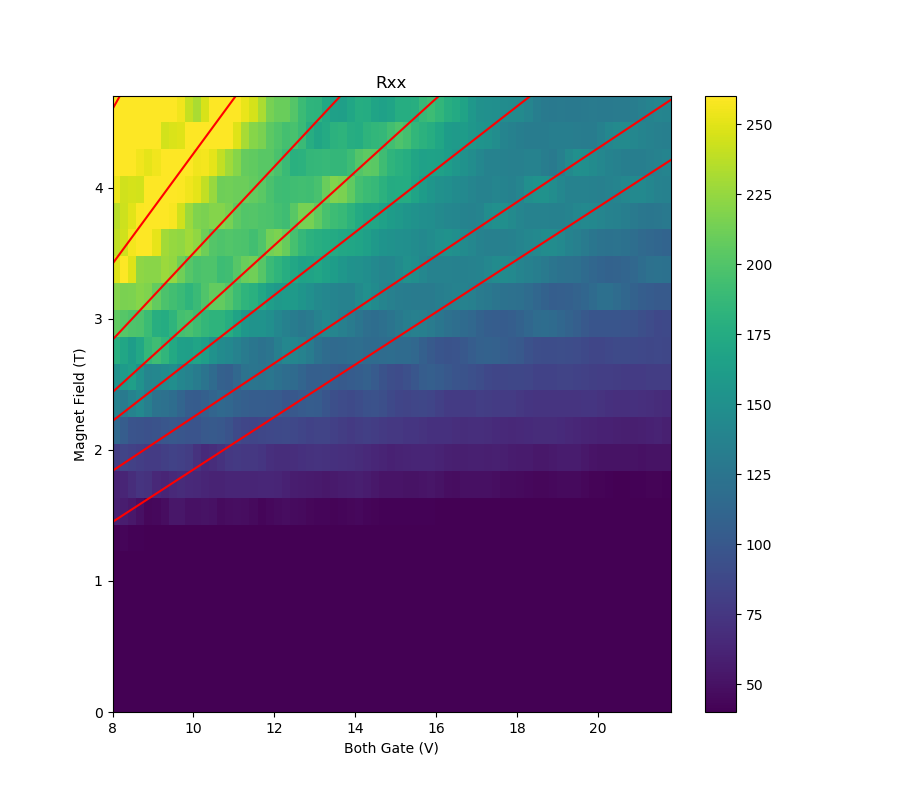

(4.030740203336983, 0.00019528638552748377)

In [511]:
data = loaddata('052718/163638.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxx')
plt.ylabel('Magnet Field (T)')
plt.xlabel('Both Gate (V)')
plt.ylim(0,4.7)
B = np.zeros(len(data.IMag))
#plt.zlabel('Rxx')
for j in range(len(data.IMag)):
    B[j] = IMag_to_B(data.IMag[j])
X, Y = np.meshgrid(data.GateV,B)
plt.pcolor(X, Y, data.Rxx)
plt.clim(40,260)
#plt.imshow()
plt.colorbar()
plt.show()
plt.plot
#Int_Rxx = interp1d.bisplrep(X, Y, Z,s=0)
#plt.savefig(data.filename+'B_Vboth_Rxx_heatmap'+'.png')
#cost
def cost(a,b):

    return np.average(griddata((X.flatten(),Y.flatten()),data.Rxx.flatten(),Tp((data.GateV[0],a*data.GateV[0]+b)),'nearest'))

a,b= 1.7,0.4
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.77,0.2
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.55,0.2
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.42,0.06
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.33,0.2
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.28,0.2
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.24,0.3
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.205,0.2
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
a,b= 0.2,-0.15
plt.plot(np.array(data.GateV), a*np.array(data.GateV) + b, 'r', label='Fitted line',color='red')
data.T

In [529]:
a,b= 2.5,0.7
a,b= 0.9,0.35
a,b= 0.6,0.1
a,b= 0.44,0.06
a,b= 0.36,0.03
np.average([4.11,3.72,3.99,4.06,3.98,4.06,4.06,3.96,4.35]),np.std([4.11,3.72,3.99,4.06,3.98,4.06,4.06,3.96,4.35])
#np.average([2.8,1.8,1.8,1.76,1.8]),np.std([2.8,1.8,1.8,1.76,1.8])

(4.032222222222222, 0.15511843344703324)

<IPython.core.display.Javascript object>


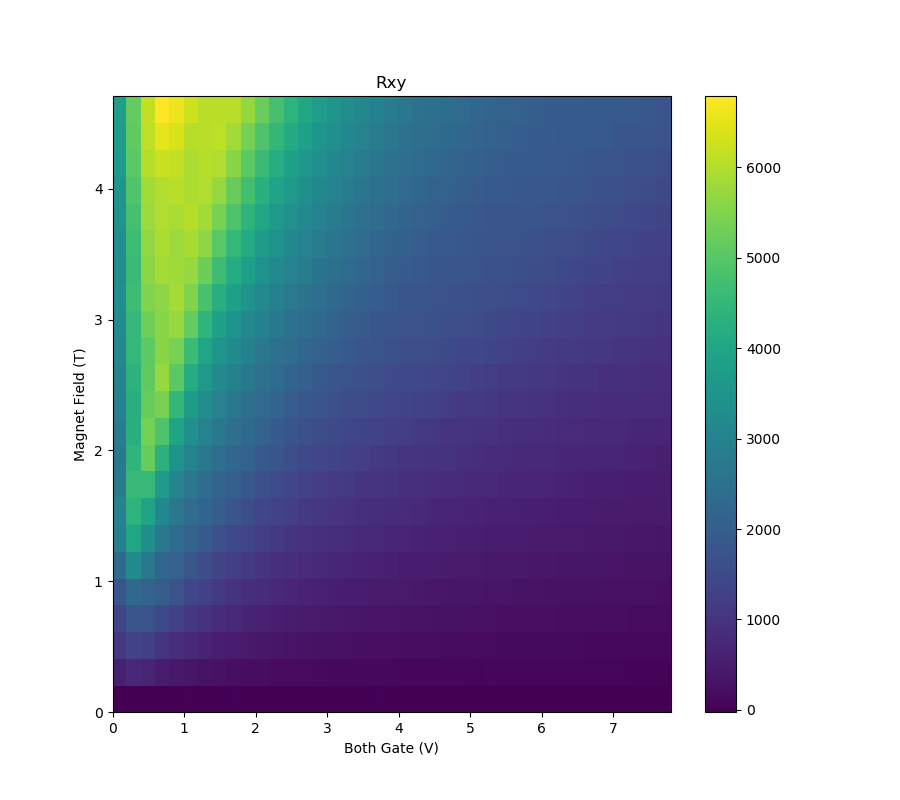

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [347]:
data = loaddata('052718/134318.pkl')
fig = plt.figure(figsize=(9, 8))
plt.title('Rxy')
plt.ylabel('Magnet Field (T)')
plt.xlabel('Both Gate (V)')
B = np.zeros(len(data.IMag))
#plt.zlabel('Rxx')
Rxy = Tp(np.zeros((len(data.IMag),len(data.GateV))))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[i][j]= V_to_R(data.Vxy[j][i][0])


X, Y = np.meshgrid(data.GateV,B)
plt.pcolor(X, Y, Tp(Rxy))

#plt.clim(0,10000)
#plt.imshow()
plt.colorbar()
plt.show()
plt.savefig(data.filename+'B_Vboth_Rxy_heatmap'+'.png')
#data.T

<IPython.core.display.Javascript object>


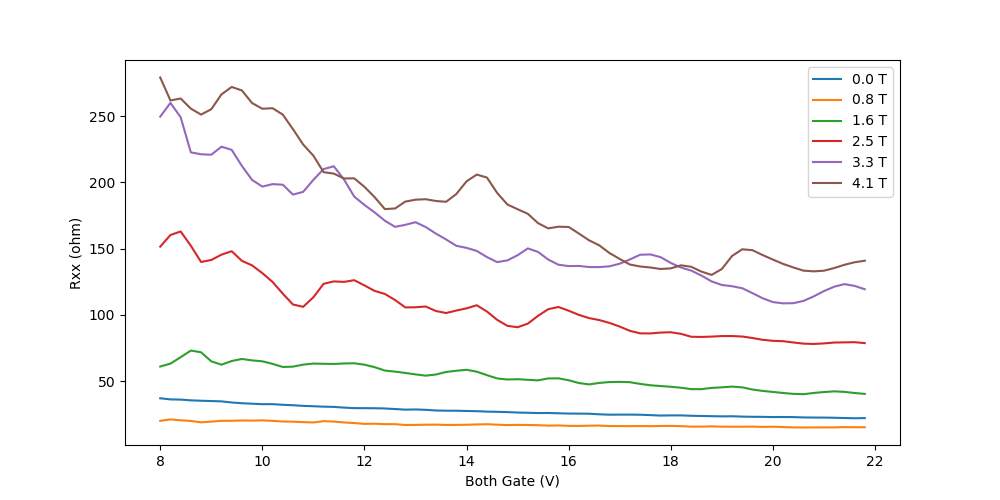

In [68]:
fig = plt.figure(figsize=(10, 5))
data = loaddata('052718/163638.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
B = np.zeros(len(data.IMag))
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
for j in range(len(data.IMag)):
    B[j] = IMag_to_B(data.IMag[j])

for i in range(len(data.IMag)):
    if i%4 ==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend()
#plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.savefig(data.filename+'_Vboth_Rxx'+'.png')
plt.show()

<IPython.core.display.Javascript object>


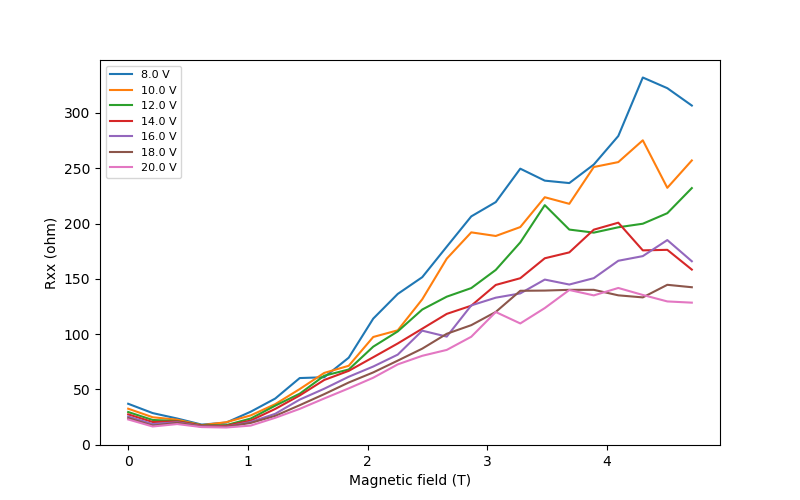

In [67]:
fig = plt.figure(figsize=(10, 5))
data = loaddata('052718/163638.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Magnetic field (T)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
for j in range(len(data.IMag)):
    B[j] = IMag_to_B(data.IMag[j])
for i in range(len(data.GateV)):
    if i%10 == 0:
        plt.plot(B,Tp(Tp(data.Rxx)[i]),label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(fontsize=8)
#plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.savefig(data.filename+'_B_Rxx'+'.png')
plt.show()

<IPython.core.display.Javascript object>


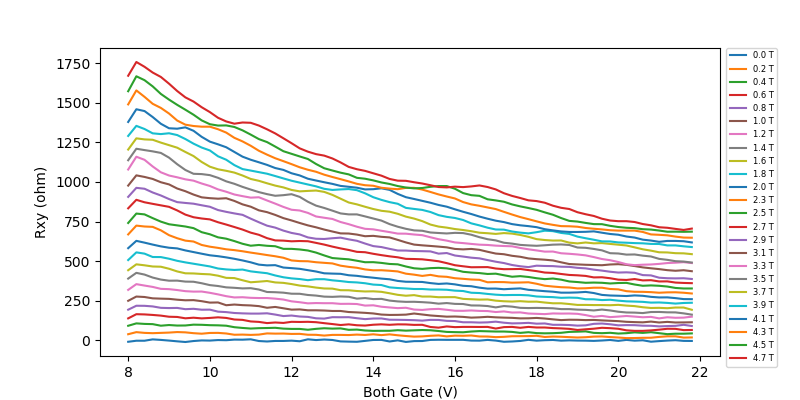

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [66]:
fig = plt.figure(figsize=(8, 4))
data = loaddata('052718/163638.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%1 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.,fontsize =6)
plt.savefig(data.filename+'_Vboth_Rxy'+'.png')
plt.show()

<IPython.core.display.Javascript object>


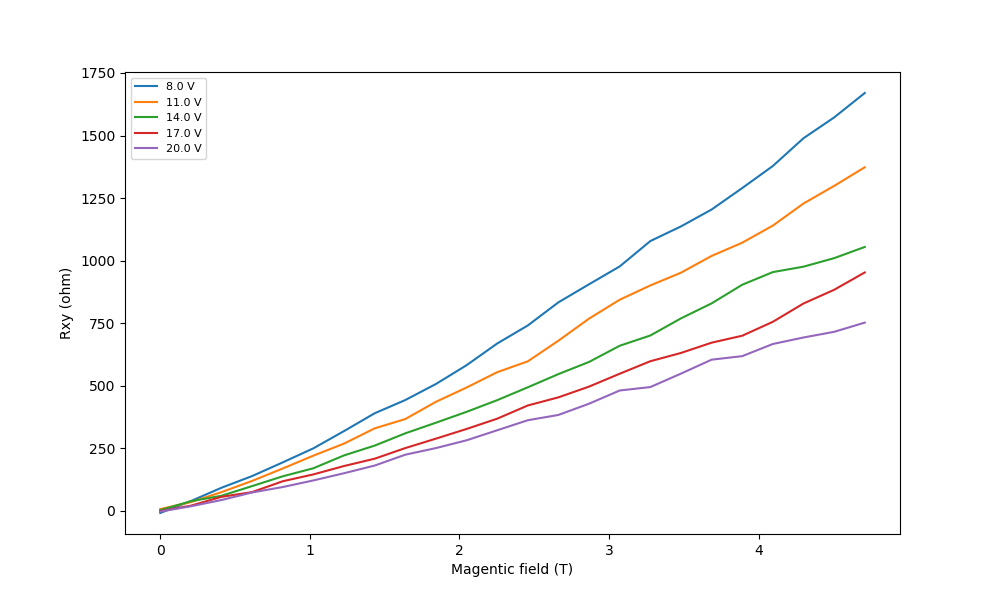

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [195]:
fig = plt.figure(figsize=(10, 6))
data = loaddata('052718/163638.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Magentic field (T)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = Tp(np.zeros((len(data.IMag),len(data.GateV))))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[i][j]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.GateV)):
    if i%15 == 0:
        plt.plot(B,Rxy[i],label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'upper left', fontsize = 8)
#plt.savefig(data.filename+'_B_Rxy_'+'.png')
plt.show()

<IPython.core.display.Javascript object>


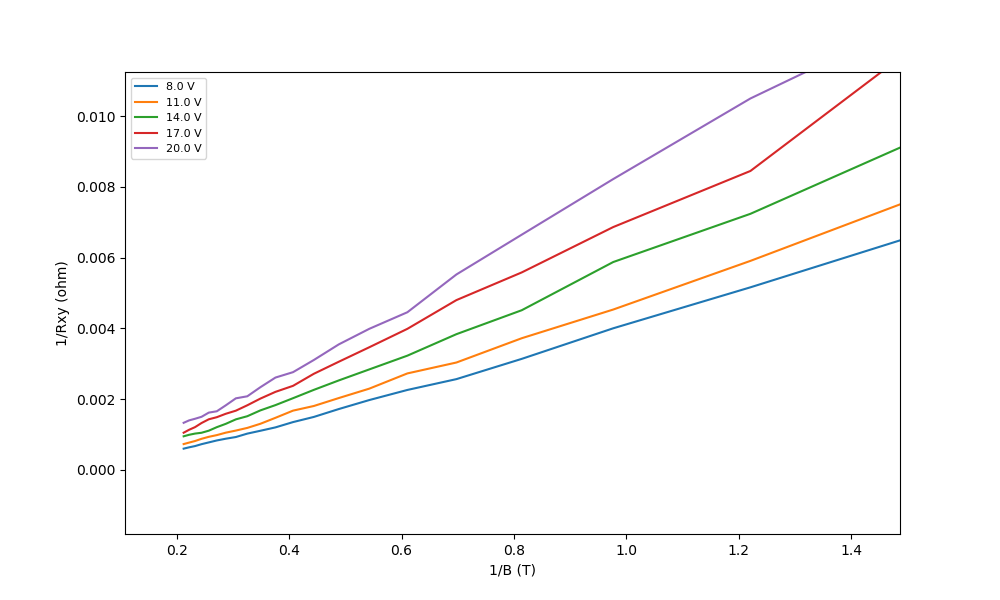

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  if sys.path[0] == '':
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in double_scalars
  del sys.path[0]


In [194]:
fig = plt.figure(figsize=(10, 6))
data = loaddata('052718/163638.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('1/B (T)')
plt.ylabel('1/Rxy (ohm)')
B_inv = np.zeros(len(data.IMag))
Sxy = Tp(np.zeros((len(data.IMag),len(data.GateV))))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B_inv[j] = 1/IMag_to_B(data.IMag[j])
        Sxy[i][j]= 1/V_to_R(data.Vxy[j][i][0])

for i in range(len(data.GateV)):
    if i%15 == 0:
        plt.plot(B_inv,Sxy[i],label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'upper left', fontsize = 8)
#plt.savefig(data.filename+'_B_Rxy_'+'.png')
plt.show()

<IPython.core.display.Javascript object>


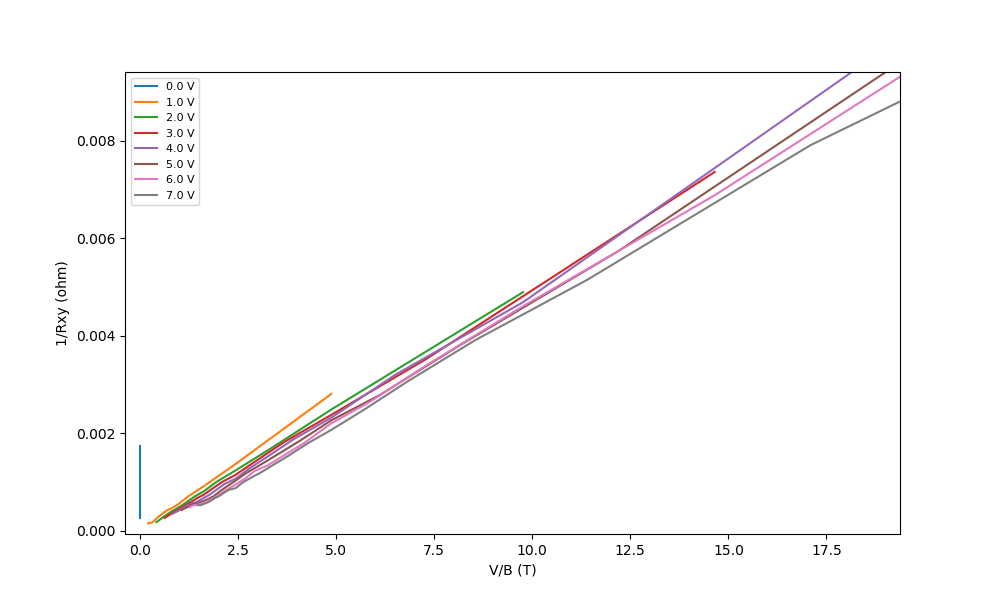

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  if sys.path[0] == '':
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in double_scalars
  del sys.path[0]
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in multiply


In [215]:
fig = plt.figure(figsize=(10, 6))
data = loaddata('052718/134318.pkl')
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('V/B (T)')
plt.ylabel('1/Rxy (ohm)')
B_inv = np.zeros(len(data.IMag))
Sxy = Tp(np.zeros((len(data.IMag),len(data.GateV))))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B_inv[j] = 1/IMag_to_B(data.IMag[j])
        Sxy[i][j]= 1/V_to_R(data.Vxy[j][i][0])

for i in range(len(data.GateV)):
    if i%5 == 0:
        plt.plot(data.GateV[i]*B_inv,Sxy[i],label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'upper left', fontsize = 8)
#plt.savefig(data.filename+'_B_Rxy_'+'.png')
plt.show()

<IPython.core.display.Javascript object>


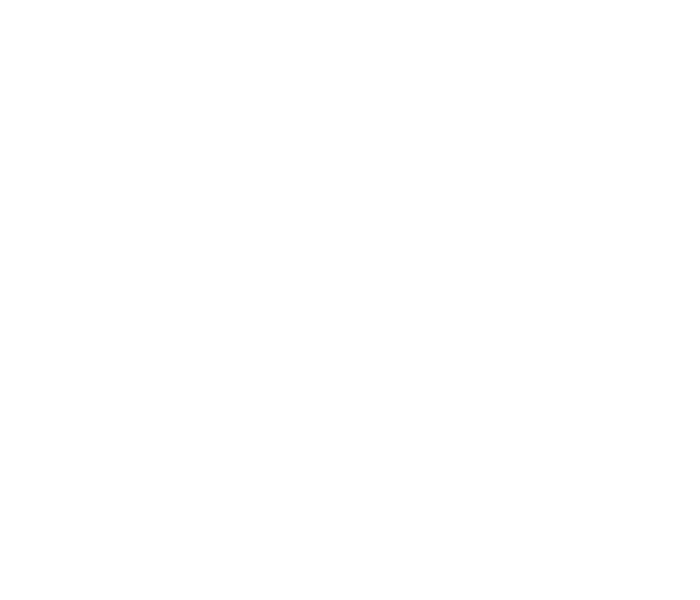

<IPython.core.display.Javascript object>


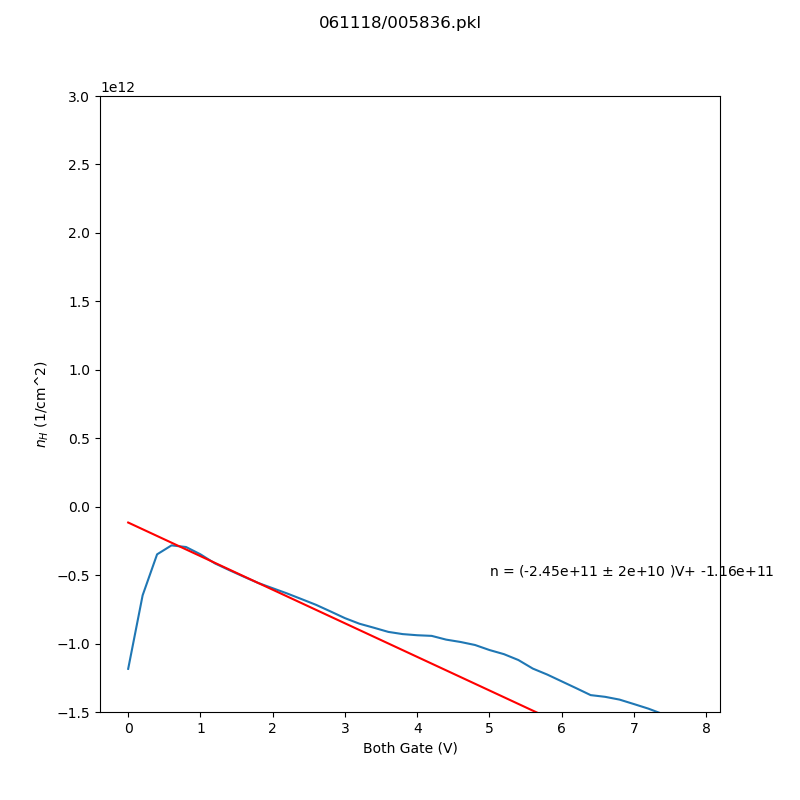

(-1500000000000.0, 3000000000000.0)

In [466]:
data = loaddata('052718/134318.pkl')
fig = plt.figure(figsize=(7, 6)) 
#plt.title('Rxy')
#plt.xlabel('Magnet Current(I)')
#plt.ylabel('Rxy')
#plt.xlim(13,34)
IMag_half = np.zeros(10)
GateV_half = np.zeros(int(len(data.GateV)))
Rxx_half = np.zeros((len(IMag_half),len(GateV_half)))
Rxy_half = np.zeros((len(IMag_half),len(GateV_half)))
#plt.zlabel('Rxx')
for i in range(len(IMag_half)):
    IMag_half[i]=data.IMag[i+5]
for i in range(len(GateV_half)):
    GateV_half[i] = data.GateV[i]
data_cut=B_Vg_R_data(IMag_half,GateV_half,0)
for i in range(len(IMag_half)):
    for j in range(len(GateV_half)):
        data_cut.Rxx[i][j] = data.Rxx[i+5][j]
        data_cut.Vxx[i][j] = data.Vxx[i+5][j]
        data_cut.Vxy[i][j] = data.Vxy[i+5][j]
        Rxy_half[i][j] = V_to_R(data_cut.Vxy[i][j][0]) 
#X, Y = np.meshgrid(IMag_half, GateV_half)
#plt.pcolor(Tp(Y),Tp(X), Rxy_half-0*Rxx_half)
#plt.colorbar()
B_Vg_R_to_Vg_to_n(data_cut,3,9)
#for i in range(len(GateV_half)):
#    if i%8==0:
#        plt.plot(IMag_half,Tp(Tp(Rxy_half)[i]-0*Tp(Rxx_half)[i]),label="%1.1f V"%GateV_half[i])
#plt.plot([1,2.8],[2.22e11,9.01e11])
#plt.clim(0,50000)
#plt.imshow()
#plt.show()
#plt.legend()
plt.xlabel('Both Gate (V)')
plt.ylim(-1.5e12,3e12)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


<IPython.core.display.Javascript object>


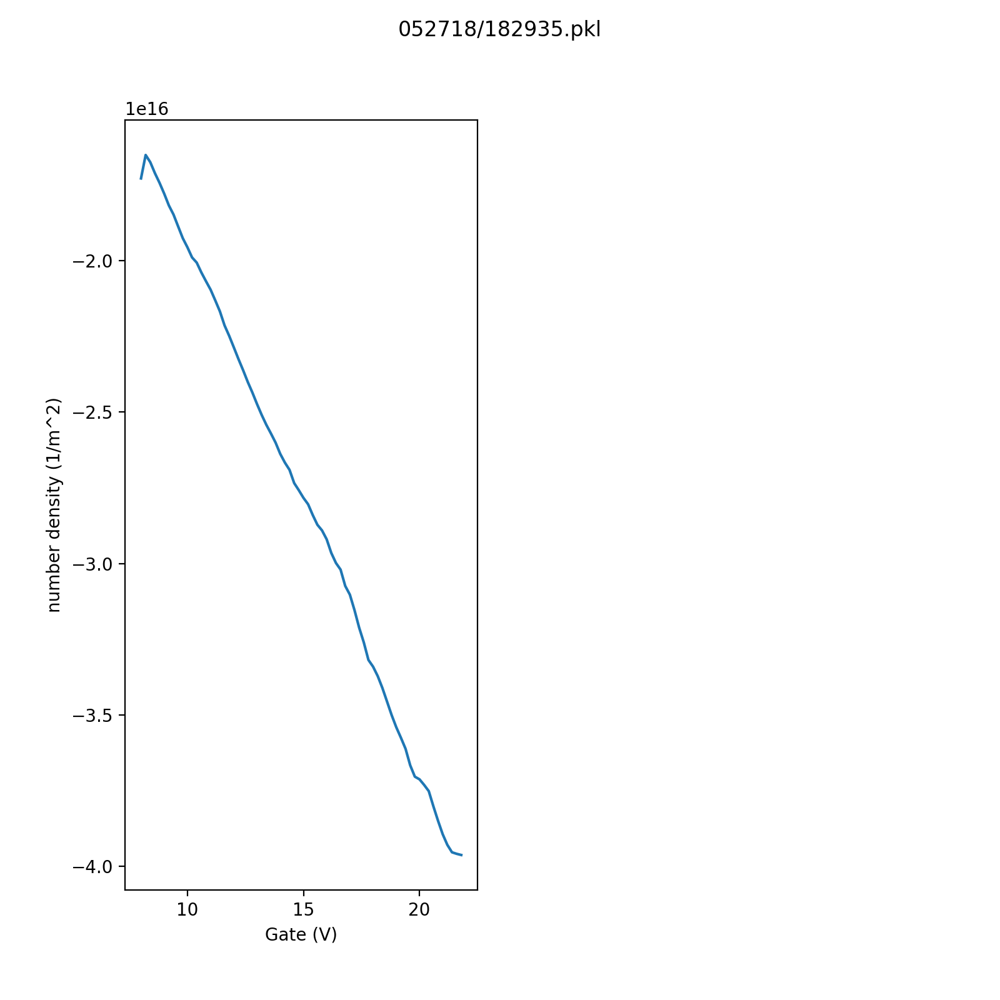

(-1739475523977964.8, -2025642845024580.0)

In [545]:
B_Vg_R_to_Vg_to_n(B_Vboth_R)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


<IPython.core.display.Javascript object>


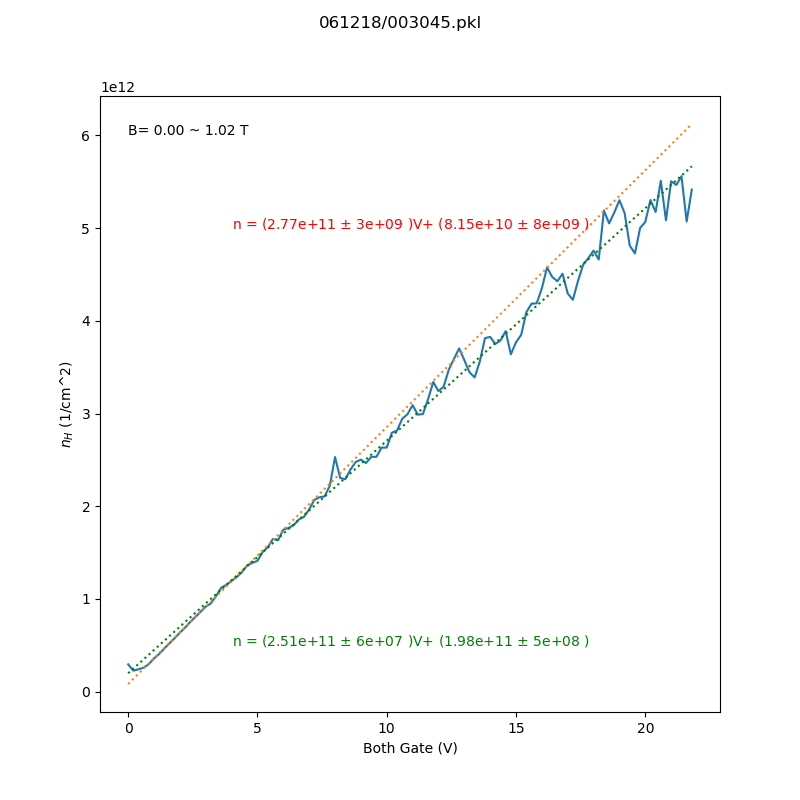

Text(4,5e+11,'n = (2.51e+11 $\\pm$ 6e+07 )V+ (1.98e+11 $\\pm$ 5e+08 )')

In [538]:
    data1=loaddata('052718/134318.pkl')
    data2=loaddata('052718/163638.pkl')
    density = np.zeros(len(data1.GateV)+len(data2.GateV))
    I_start = 0
    I_end=5
    G_min=9
    G_max=18
    B =np.zeros(len(data1.IMag))
    Rxy =np.zeros(len(data1.IMag))
    for i in range(len(data1.GateV)):
        for j in range(len(data1.IMag)):
            B[j] = IMag_to_B(data1.IMag[j])
            Rxy[j]= V_to_R(data1.Vxy[j][i][0])
        a, b, r_value, p_value, std_err = stats.linregress(Rxy[I_start:I_end],B[I_start:I_end])    
        #plt.plot(x, a*x + b, 'r', label='Fitted line')
        # formula
        density[i]=a/consts.e/10000 

    B =np.zeros(len(data2.IMag))
    Rxy =np.zeros(len(data2.IMag))
    for i in range(len(data2.GateV)):
        for j in range(len(data2.IMag)):
            B[j] = IMag_to_B(data2.IMag[j])
            Rxy[j]= V_to_R(data2.Vxy[j][i][0])
        a, b, r_value, p_value, std_err = stats.linregress(Rxy[I_start:I_end],B[I_start:I_end])    
        #plt.plot(x, a*x + b, 'r', label='Fitted line')
        # formula
        density[i+len(data1.GateV)]=a/consts.e/10000 

    GateV=np.append(data1.GateV,data2.GateV)    
    a, b, r_value, p_value, std_err = stats.linregress(GateV[G_min:G_max],density[G_min:G_max])
    n=len(data.GateV[G_min:G_max])
    a_std = std_err/np.sqrt(np.var(data.GateV[G_min:G_max])*n)
    b_std = std_err*np.sqrt((1/n+np.average(data.GateV[G_min:G_max])**2/np.var(data.GateV[G_min:G_max])/n))    
    
    fig = plt.figure(figsize=(8, 8))
    full_filename = makefilename()
    fig.suptitle(full_filename)
    #ax1=plt.subplot(1,2,1)
    plt.xlabel('Both Gate (V)')
    plt.ylabel(r'$n_H$ (1/cm^2)')
    plt.plot(GateV,density)
    plt.text(0,6e12,r'B= %.2f ~ %.2f T'%(B[0],B[I_end]))

    #ax1.lines[0].set_xdata(data.GateV)
    #ax1.lines[0].set_ydata(data.density)#plot the X component,  
    plt.plot(np.array(GateV), a*np.array(GateV) + b, linestyle=':', label='Fitted line')
    plt.text(4,5e12,r'n = (%.2e $\pm$ %.0e )V+ (%.2e $\pm$ %.0e )'%(a,a_std,b,b_std),color='red')

    G_min=0
    G_max=len(GateV)-1
    a, b, r_value, p_value, std_err = stats.linregress(GateV[G_min:G_max],density[G_min:G_max])
    n=len(data.GateV[G_min:G_max])
    a_std = std_err/np.sqrt(np.var(data.GateV[G_min:G_max])*n)
    b_std = std_err*np.sqrt((1/n+np.average(data.GateV[G_min:G_max])**2/np.var(data.GateV[G_min:G_max])/n))
    plt.plot(np.array(GateV), a*np.array(GateV) + b,linestyle=':', label='Fitted line', color = 'green')


    plt.text(4,0.5e12,r'n = (%.2e $\pm$ %.0e )V+ (%.2e $\pm$ %.0e )'%(a,a_std,b,b_std),color='green')
    #plt.savefig('052718_V_to_n.png')

In [51]:
B_Vboth_R =loaddata('052718/134318.pkl')

<IPython.core.display.Javascript object>


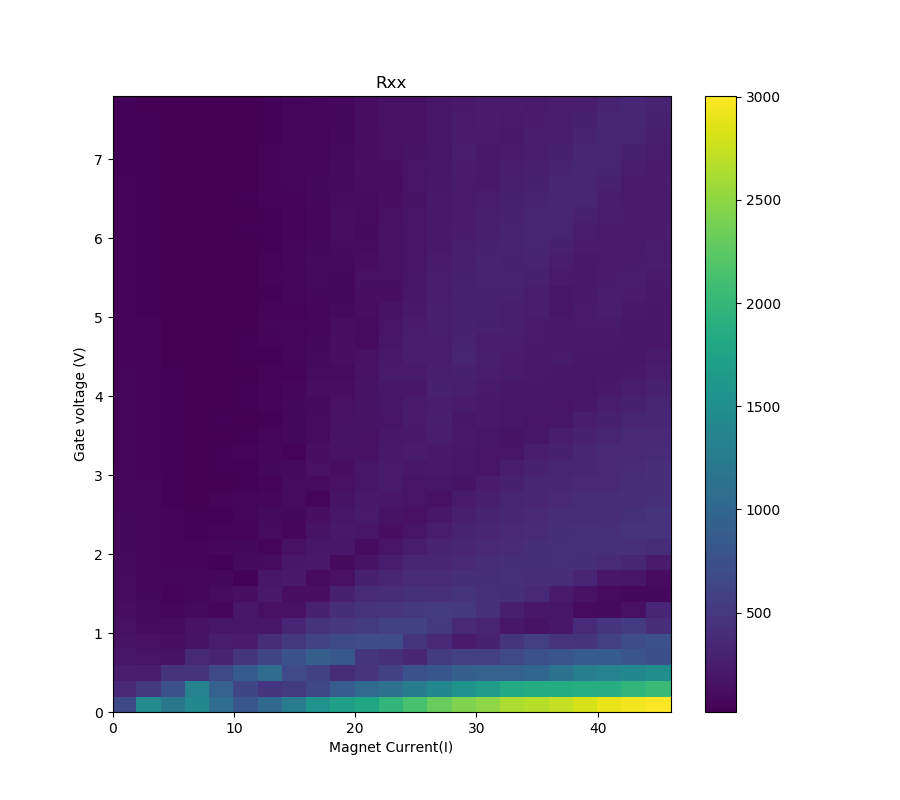

(4.039108350993581, 0.00019528615268737774)

In [564]:
data = loaddata('052718/134318.pkl')
fig = plt.figure(figsize=(9, 8)) 
plt.title('Rxx')
plt.xlabel('Magnet Current(I)')
plt.ylabel('Gate voltage (V)')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(data.IMag, data.GateV)
plt.pcolor(X, Y, np.transpose(data.Rxx))
#plt.clim(0,10000)
#plt.imshow()
plt.colorbar()
plt.show()
#plt.savefig(data.filename+'B_Vboth_Rxx_heatmap'+'.png')
data.T


<IPython.core.display.Javascript object>


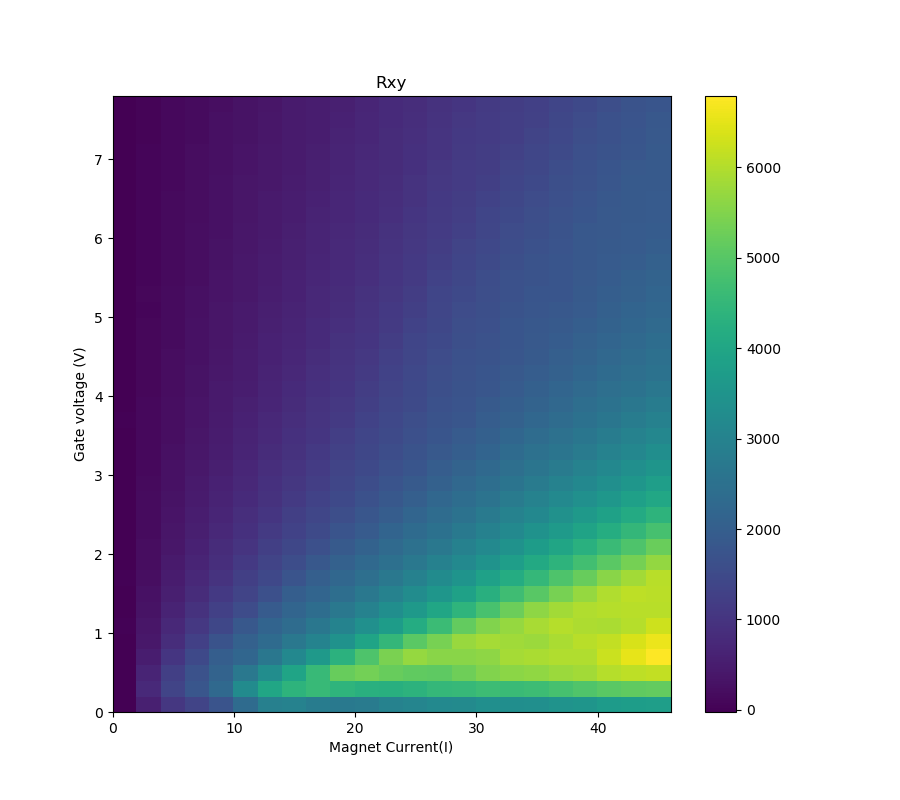

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [562]:
data = B_Vboth_R
fig = plt.figure(figsize=(9, 8))
plt.title('Rxy')
plt.xlabel('Magnet Current(I)')
plt.ylabel('Gate voltage (V)')
#plt.zlabel('Rxx')
Rxy = Tp(np.zeros((len(data.IMag),len(data.GateV))))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        #B[j] = IMag_to_B(data.IMag[j])
        Rxy[i][j]= V_to_R(data.Vxy[j][i][0])


X, Y = np.meshgrid(data.IMag, data.GateV)
plt.pcolor(X, Y, Rxy)

#plt.clim(0,10000)
#plt.imshow()
plt.colorbar()
plt.show()
plt.savefig(data.filename+'B_Vboth_Rxy_heatmap'+'.png')
#data.T

<IPython.core.display.Javascript object>


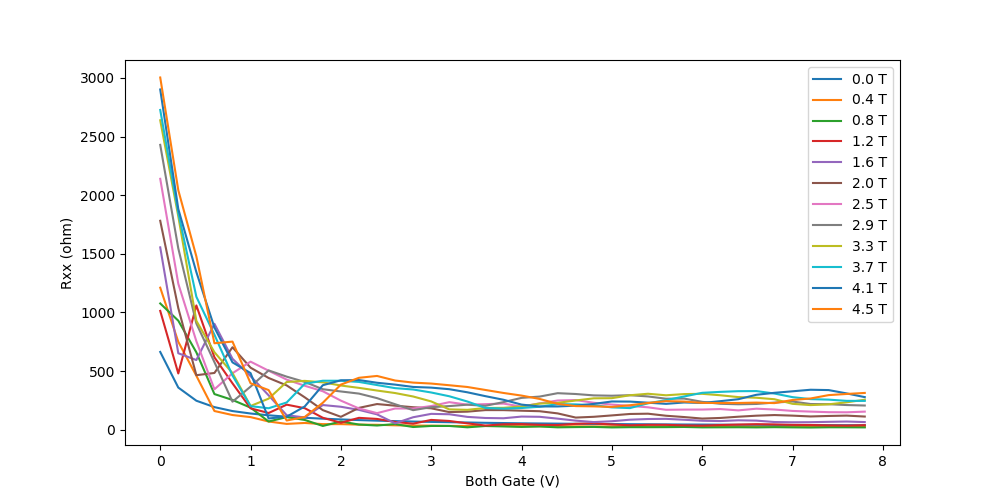

In [85]:
fig = plt.figure(figsize=(10, 5))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
B = np.zeros(len(data.IMag))
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxx (ohm)')
for j in range(len(data.IMag)):
    B[j] = IMag_to_B(data.IMag[j])

for i in range(len(data.IMag)):
    if i%2==0:
        plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend()
#plt.savefig(data.filename+'_Vboth_Rxx'+'.png')
plt.show()

<IPython.core.display.Javascript object>


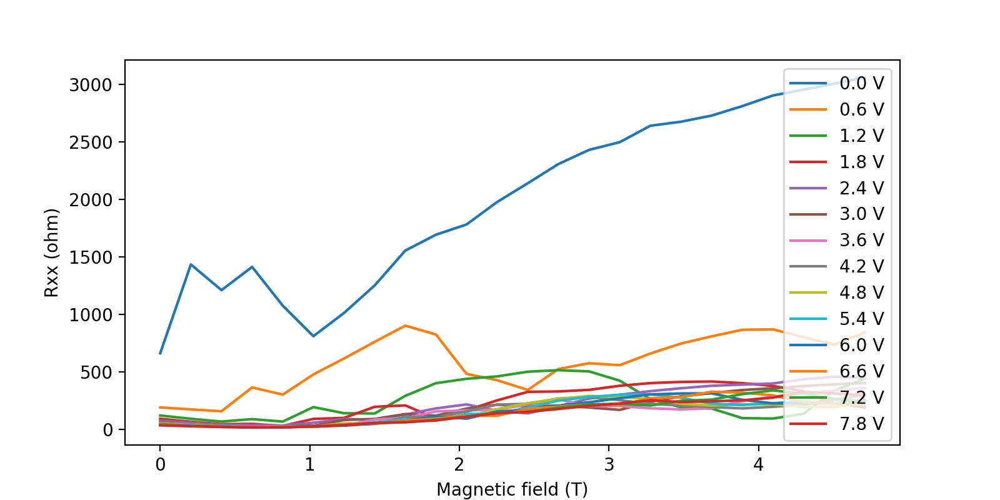

In [504]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Magnetic field (T)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
for j in range(len(data.IMag)):
    B[j] = IMag_to_B(data.IMag[j])
for i in range(len(data.GateV)):
    if i%3 == 0:
        plt.plot(B,Tp(Tp(data.Rxx)[i]),label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend()
plt.savefig(data.filename+'_B_Rxx'+'.png')
plt.show()

<IPython.core.display.Javascript object>


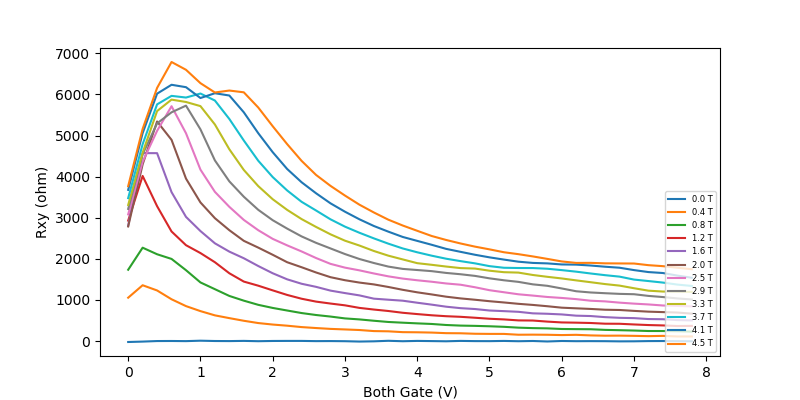

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [186]:
fig = plt.figure(figsize=(8, 4))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Both Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_Vboth_Rxy'+'.png')
plt.show()

<IPython.core.display.Javascript object>


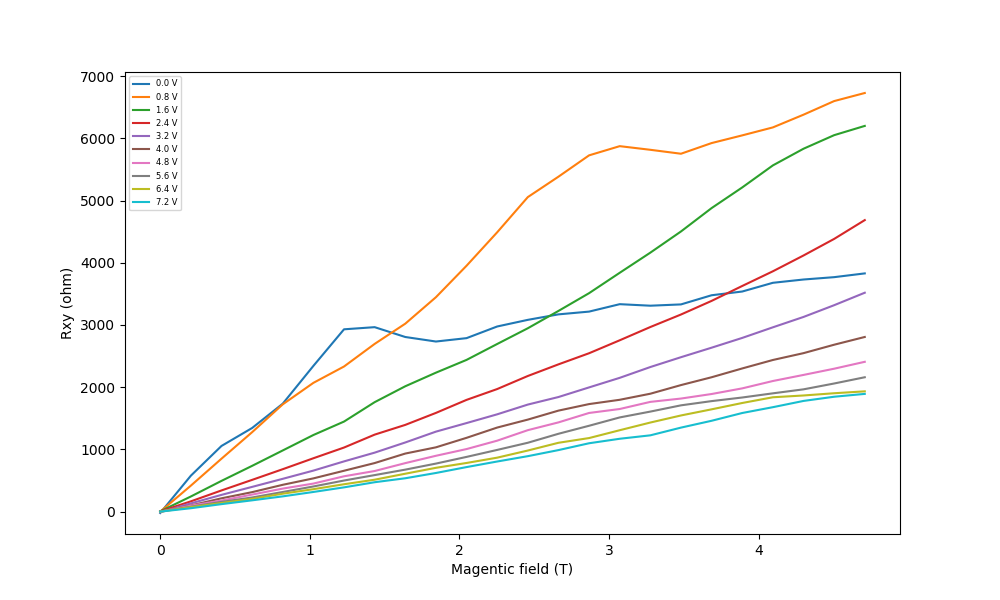

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [189]:
fig = plt.figure(figsize=(10, 6))
data = B_Vboth_R
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Magentic field (T)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = Tp(np.zeros((len(data.IMag),len(data.GateV))))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[i][j]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.GateV)):
    if i%4 == 0:
        plt.plot(B,Rxy[i],label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'upper left', fontsize = 6)
#plt.savefig(data.filename+'_B_Rxy_'+'.png')
plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


<IPython.core.display.Javascript object>


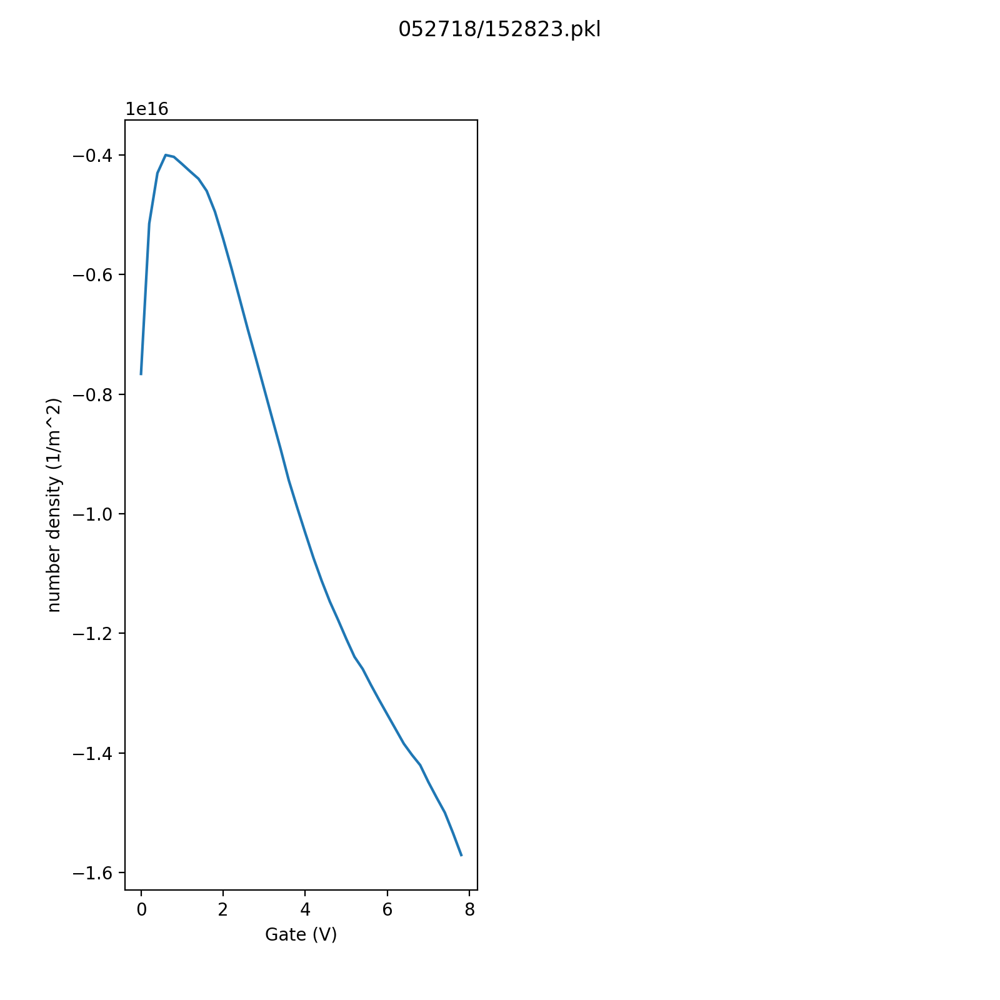

(-1627891354676731.8, -3322829570185606.0)

In [498]:
B_Vg_R_to_Vg_to_n(B_Vboth_R)

<IPython.core.display.Javascript object>


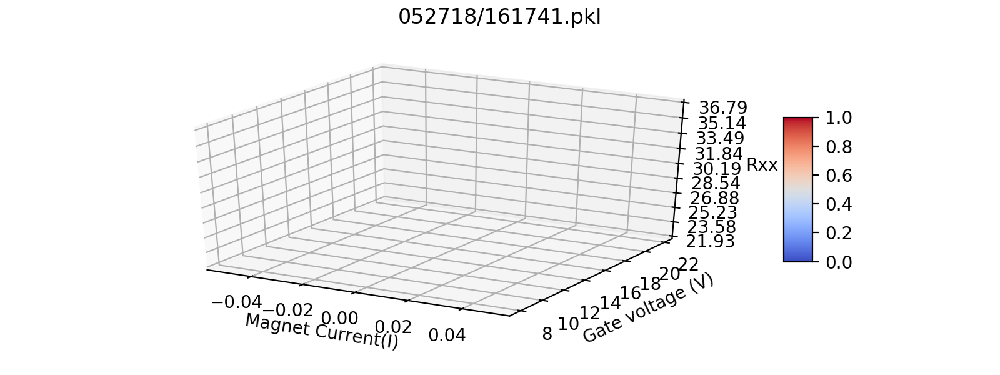

In [523]:
Rxx_Vboth=B_Vg_R(GateV_k2400,GateV_E3640A,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[0], np.arange(8, 22, 0.2),4)# IMag=0, Vg[],delay 

In [515]:
Rxx_Vboth.T

(4.028406510184735, 0.00019528645545772712)

<IPython.core.display.Javascript object>


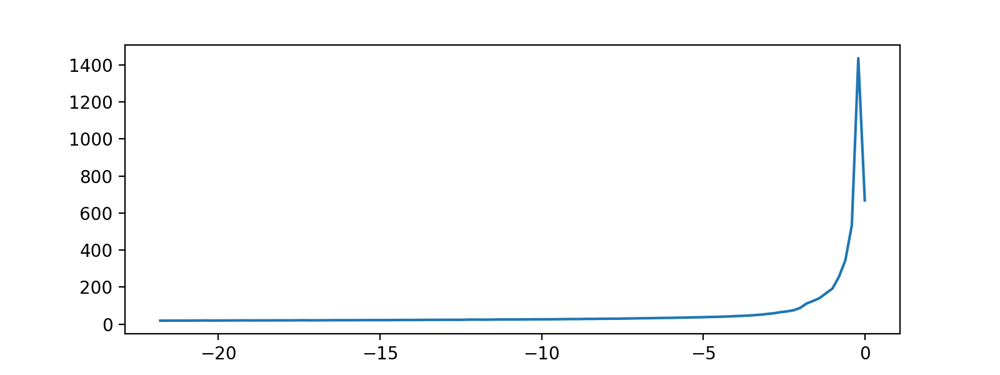

In [517]:
fig = plt.figure(figsize=(8, 3)) 
plt.plot(Rxx_Vboth.GateV,Rxx_Vboth.Rxx[0])
fig.savefig(Rxx_Vboth.filename+'neg_Vboth'+'.png')

<IPython.core.display.Javascript object>


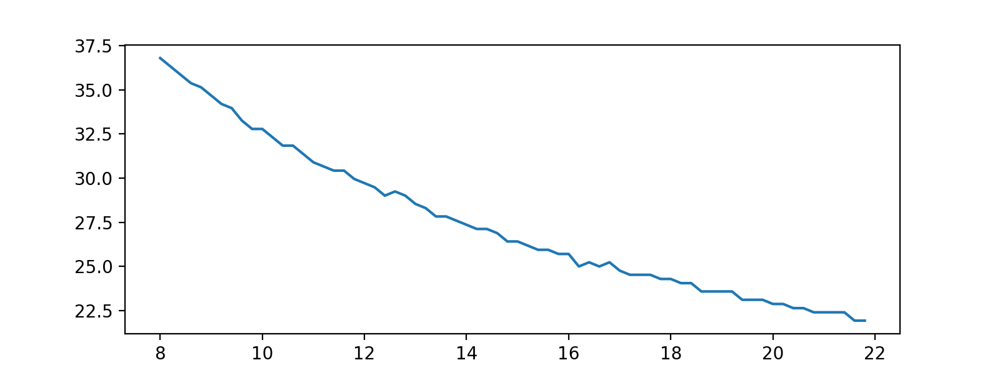

In [525]:
fig = plt.figure(figsize=(8, 3)) 
plt.plot(Rxx_Vboth.GateV,Rxx_Vboth.Rxx[0])
fig.savefig(Rxx_Vboth.filename+'pos_Vboth'+'.png')

<IPython.core.display.Javascript object>


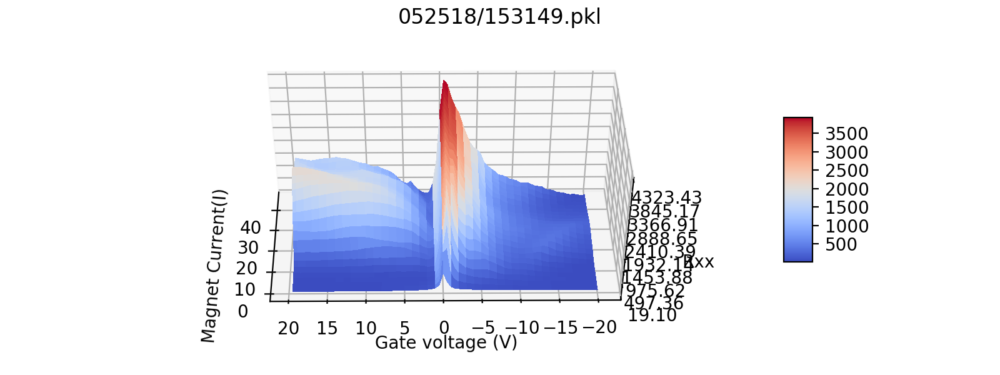

In [46]:
B_Vg_R_meas=B_Vg_R(GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,np.arange(0, 47, 2), np.arange(-20, 20, 0.5),2)# IMag=0, Vg[],delay 

In [3]:
B_Vg_R_meas = loaddata('052518/153149.pkl')

<IPython.core.display.Javascript object>


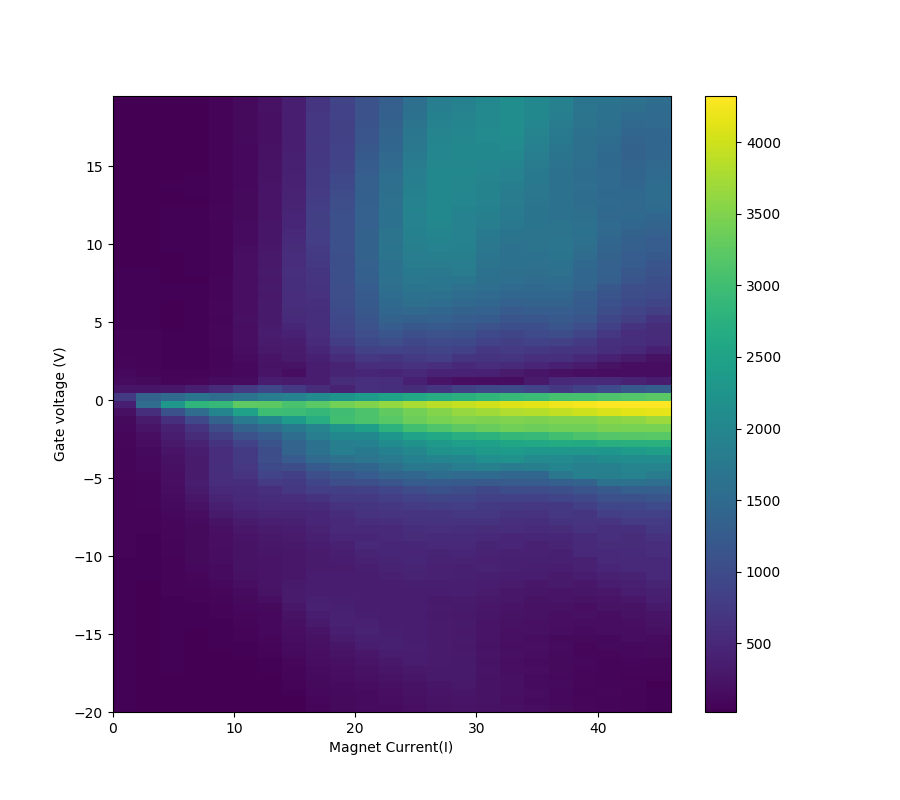

In [22]:
data = B_Vg_R_meas
fig = plt.figure(figsize=(9, 8)) 
plt.xlabel('Magnet Current(I)')
plt.ylabel('Gate voltage (V)')
#plt.zlabel('Rxx')
X, Y = np.meshgrid(data.IMag, data.GateV)
plt.pcolor(X, Y, np.transpose(data.Rxx))
#plt.clim(0,10000)
#plt.imshow()
plt.colorbar()
plt.show()

<IPython.core.display.Javascript object>


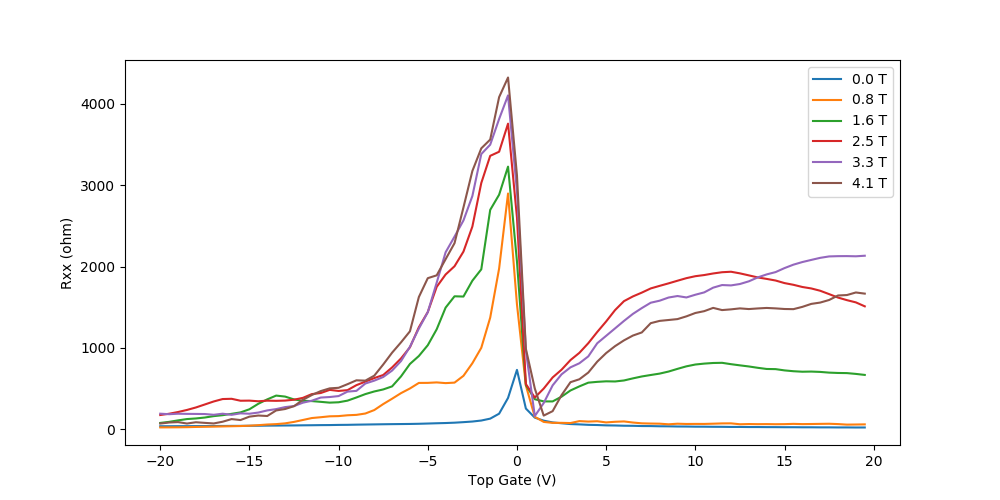

In [23]:
    fig = plt.figure(figsize=(10, 5))
    data = B_Vg_R_meas
    # not sure what to plot...
    #ax1=plt.axes(projection='2d')
    B = np.zeros(len(data.IMag))
    plt.xlabel('Top Gate (V)')
    plt.ylabel('Rxx (ohm)')
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])

    for i in range(len(data.IMag)):
        if i%4 ==0:
            plt.plot(data.GateV,data.Rxx[i],label="%1.1f T"%B[i])
    #ax1.set_zlabel('Rxx')
    #X, Y = np.meshgrid(data.IMag, data.GateV)
    #surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
    #ax1.zaxis.set_major_locator(LinearLocator(10))
    #ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    #fig.colorbar(fig, shrink=0.5, aspect=5)
    plt.legend()
    #plt.savefig(data.filename+'_V_g_Rxx'+'.png')
    plt.show()

<IPython.core.display.Javascript object>


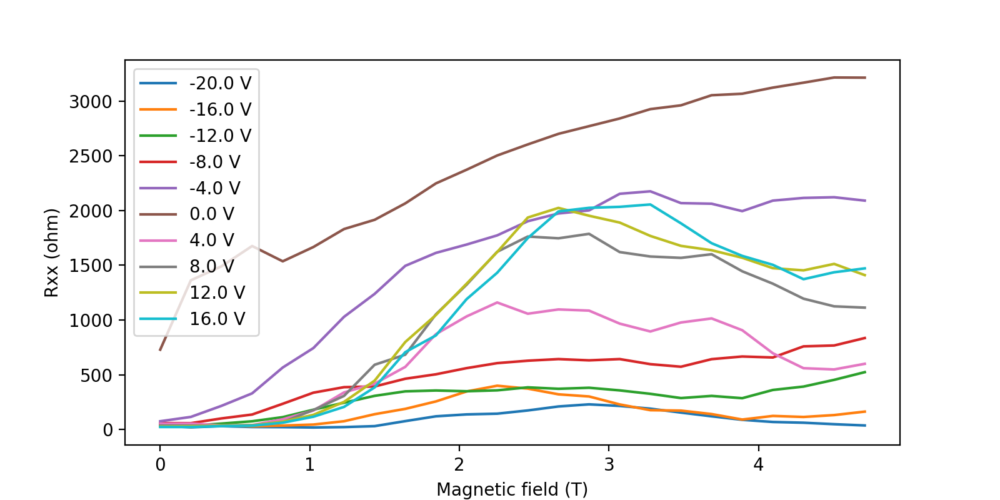

In [68]:
fig = plt.figure(figsize=(8, 4))
data = B_Vg_R_meas
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Magnetic field (T)')
plt.ylabel('Rxx (ohm)')
B = np.zeros(len(data.IMag))
for j in range(len(data.IMag)):
    B[j] = IMag_to_B(data.IMag[j])
for i in range(len(data.GateV)):
    if i%8 == 0:
        plt.plot(B,Tp(Tp(data.Rxx)[i]),label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend()
#plt.savefig(data.filename+'_B_Rxx'+'.png')
plt.show()

<IPython.core.display.Javascript object>


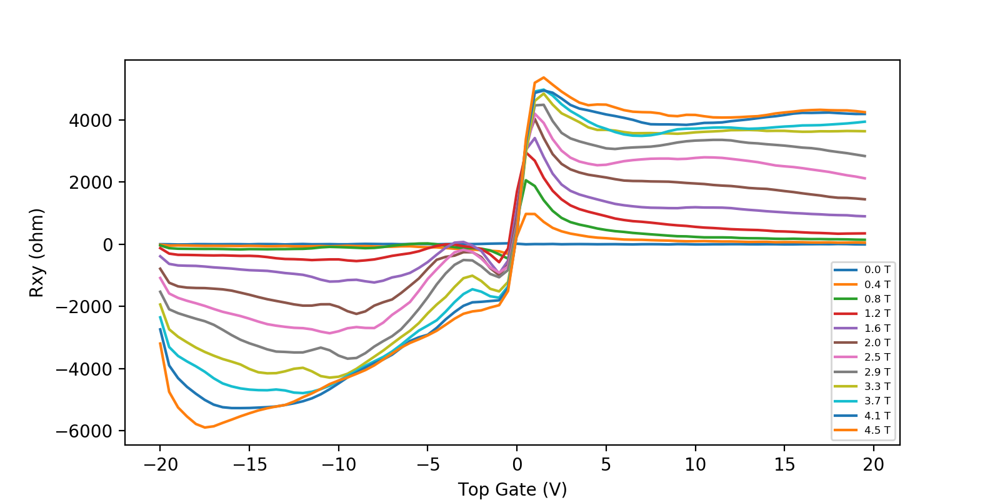

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [84]:
fig = plt.figure(figsize=(8, 4))
data = B_Vg_R_meas
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Top Gate (V)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = np.zeros((len(data.IMag),len(data.GateV)))
for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.IMag)):
    if i%2 ==0:
        plt.plot(data.GateV,Rxy[i],label="%1.1f T"%B[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'lower right',fontsize = 6)
#plt.savefig(data.filename+'_V_g_Rxy'+'.png')
plt.show()

<IPython.core.display.Javascript object>


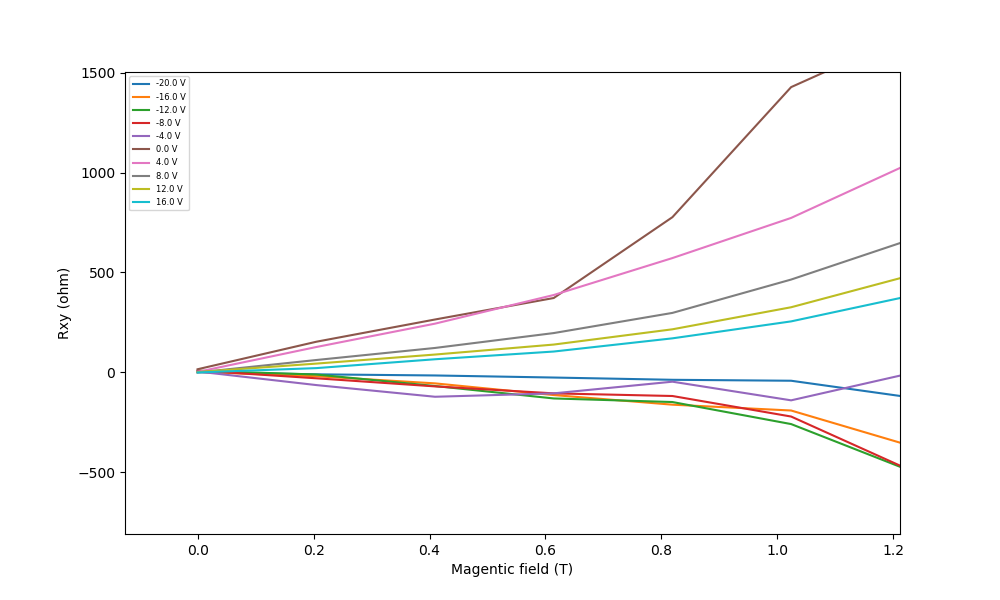

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [26]:
fig = plt.figure(figsize=(10, 6))
data = B_Vg_R_meas
# not sure what to plot...
#ax1=plt.axes(projection='2d')
plt.xlabel('Magentic field (T)')
plt.ylabel('Rxy (ohm)')
B = np.zeros(len(data.IMag))
Rxy = Tp(np.zeros((len(data.IMag),len(data.GateV))))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[i][j]= V_to_R(data.Vxy[j][i][0])

for i in range(len(data.GateV)):
    if i%8 == 0:
        plt.plot(B,Rxy[i],label="%1.1f V"%data.GateV[i])
#ax1.set_zlabel('Rxx')
#X, Y = np.meshgrid(data.IMag, data.GateV)
#surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
#fig.colorbar(fig, shrink=0.5, aspect=5)
plt.legend(loc = 'upper left', fontsize = 6)
#plt.savefig(data.filename+'_B_Rxy_+V_g'+'.png')
plt.show()

<IPython.core.display.Javascript object>


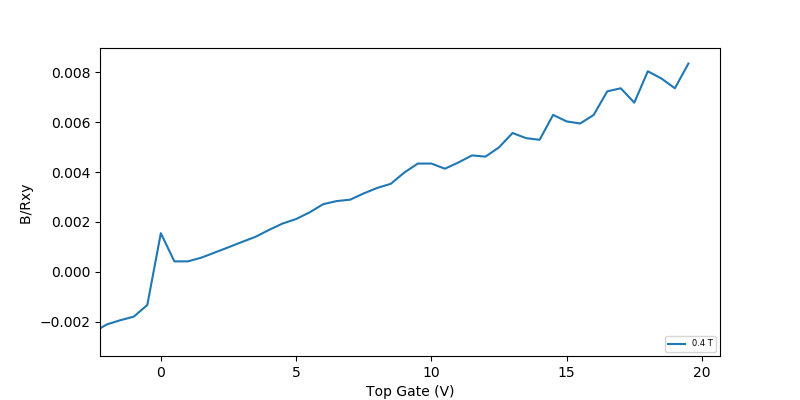

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in double_scalars
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  


In [31]:
    fig = plt.figure(figsize=(8, 4))
    data = B_Vg_R_meas
    # not sure what to plot...
    #ax1=plt.axes(projection='2d')
    plt.xlabel('Top Gate (V)')
    plt.ylabel('B/Rxy ')
    B = np.zeros(len(data.IMag))
    Rxy = np.zeros((len(data.IMag),len(data.GateV)))
    B_over_Rxy = Rxy
    for i in range(len(data.GateV)):
        for j in range(len(data.IMag)):
            B[j] = IMag_to_B(data.IMag[j])
            Rxy[j][i]= V_to_R(data.Vxy[j][i][0])
            B_over_Rxy[j][i] = B[j]/Rxy[j][i]
    
    for i in range(len(data.IMag)):
        if i ==2:
            plt.plot(data.GateV,B_over_Rxy[i],label="%1.1f T"%B[i])
    #ax1.set_zlabel('Rxx')
    #X, Y = np.meshgrid(data.IMag, data.GateV)
    #surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
    #ax1.zaxis.set_major_locator(LinearLocator(10))
    #ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    #fig.colorbar(fig, shrink=0.5, aspect=5)
    plt.legend(loc = 'lower right',fontsize = 6)
    #plt.savefig(data.filename+'_V_g_Rxy'+'.png')
    plt.show()

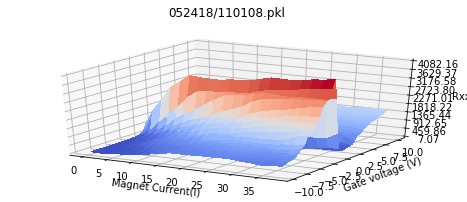

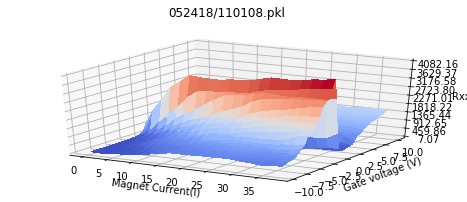

In [8]:
# hacking, runing the lower one!
Rxx_n=B_Vg_R(GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,np.arange(0,40, 2), np.arange(10, -10, -0.5),3)# IMag=0, Vg[],delay 

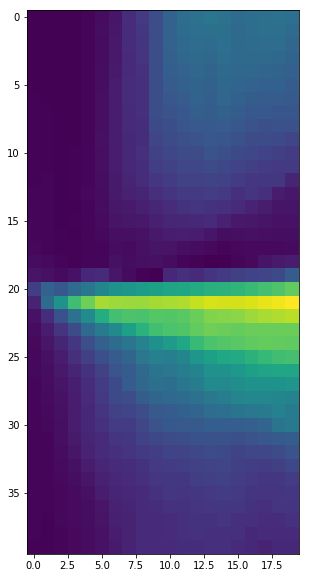

In [17]:
fig = plt.figure(figsize=(10, 10)) 
#ax1=fig.gca(projection='3d')
ax1.set_xlabel('Magnet Current(I)')
ax1.set_ylabel('Gate voltage (V)')
ax1.set_zlabel('Rxx')
X, Y = np.meshgrid(Rxx_n.IMag, Rxx_n.GateV)
plt.imshow(np.transpose(Rxx_n.Rxx))
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
#fig.colorbar(surf, shrink=0.5, aspect=5)
#display.clear_output(wait=True)
#display.display(plt.gcf())


<IPython.core.display.Javascript object>


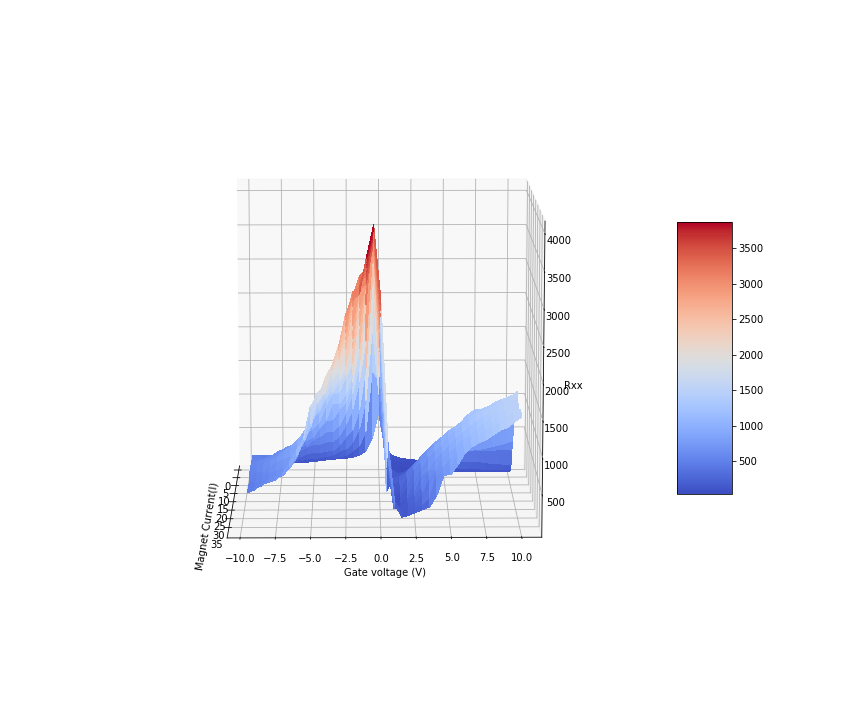

In [40]:
    fig = plt.figure(figsize=(12, 10))
    data = Rxx_n
    # not sure what to plot...
    ax1=plt.axes(projection='3d')
    ax1.set_xlabel('Magnet Current(I)')
    ax1.set_ylabel('Gate voltage (V)')
    ax1.set_zlabel('Rxx')
    X, Y = np.meshgrid(data.IMag, data.GateV)
    surf = ax1.plot_surface(X, Y, np.transpose(data.Rxx), cmap=cm.coolwarm, linewidth=0, antialiased=False)
    #ax1.zaxis.set_major_locator(LinearLocator(10))
    #ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    fig.colorbar(surf, shrink=0.5, aspect=5)
    plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


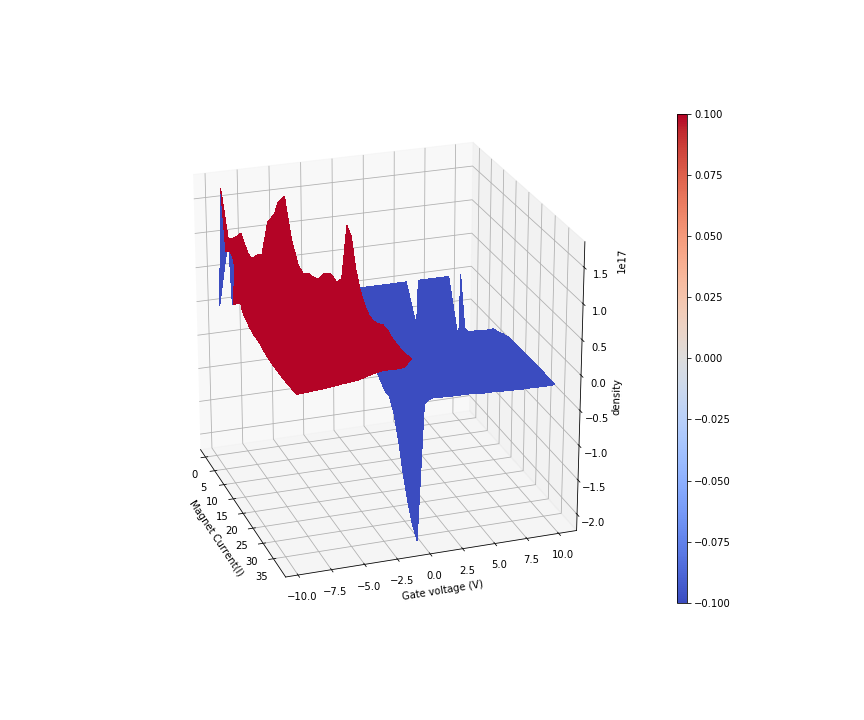

/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:29: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims)
/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:26: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims)


In [50]:
data = Rxx_n

Density = np.zeros((len(data.IMag),len(data.GateV)))
B =np.zeros(len(data.IMag))
Rxy =np.zeros(len(data.IMag))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        B[j] = IMag_to_B(data.IMag[j])
        Rxy[j]= V_to_R(data.Vxy[j][i][0])
        Density[j][i]=-B[j]/Rxy[j]/consts.e*3 
    #a, b, r_value, p_value, std_err = stats.linregress(Rxy,B)    
    #plt.plot(x, a*x + b, 'r', label='Fitted line')
    # formula
    
fig = plt.figure(figsize=(12, 10))
# not sure what to plot...
ax1=plt.axes(projection='3d')
ax1.set_xlabel('Magnet Current(I)')
ax1.set_ylabel('Gate voltage (V)')
ax1.set_zlabel('density')

X, Y = np.meshgrid(data.IMag, data.GateV)
surf = ax1.plot_surface(X, Y, np.transpose(Density), cmap=cm.coolwarm, linewidth=1, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
fig.colorbar(surf, shrink=0.9, aspect=50)
plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


<IPython.core.display.Javascript object>


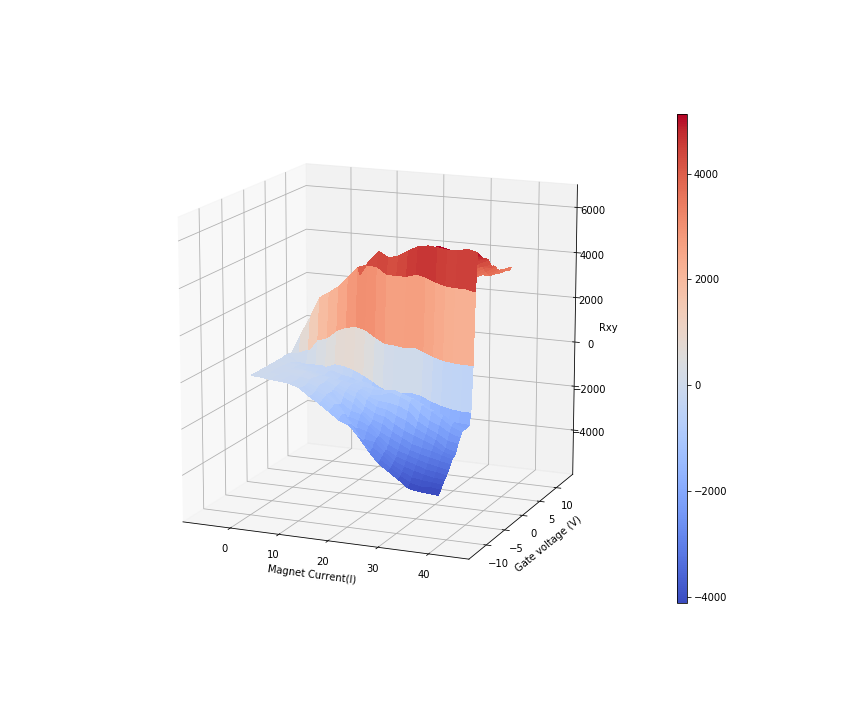

In [52]:
data = Rxx_n

Rxy = np.zeros((len(data.IMag),len(data.GateV)))
#B =np.zeros(len(data.IMag))
#Rxy =np.zeros(len(data.IMag))

for i in range(len(data.GateV)):
    for j in range(len(data.IMag)):
        Rxy[j][i]= V_to_R(data.Vxy[j][i][0])
        
    #a, b, r_value, p_value, std_err = stats.linregress(Rxy,B)    
    #plt.plot(x, a*x + b, 'r', label='Fitted line')
    # formula
    
fig = plt.figure(figsize=(12, 10))
# not sure what to plot...
ax1=plt.axes(projection='3d')
ax1.set_xlabel('Magnet Current(I)')
ax1.set_ylabel('Gate voltage (V)')
ax1.set_zlabel('Rxy')

X, Y = np.meshgrid(data.IMag, data.GateV)
surf = ax1.plot_surface(X, Y, np.transpose(Rxy), cmap=cm.coolwarm, linewidth=1, antialiased=False)
#ax1.zaxis.set_major_locator(LinearLocator(10))
#ax1.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
fig.colorbar(surf, shrink=0.9, aspect=50)
plt.show()

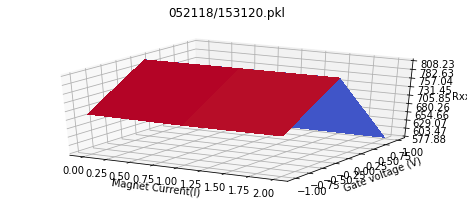

2.01
2.01
1.98
1.95
1.92
1.89
1.86
1.83
1.8
1.77
1.74
1.71
1.68
1.65
1.62
1.59
1.56
1.53
1.5
1.47
1.44
1.41
1.38
1.35
1.32
1.29
1.26
1.23
1.2
1.17
1.14
1.11
1.08
1.05
1.02
0.99
0.96
0.93
0.9
0.87
0.84
0.81
0.78
0.75
0.72
0.69
0.66
0.63
0.6
0.57
0.54
0.51
0.48
0.45
0.42
0.39
0.36
0.33
0.3
0.27
0.24
0.21
0.18
0.15
0.12
0.09
0.06


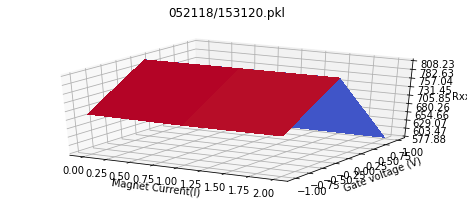

In [7]:
Hall = B_Vg_R(GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[0,1,2],[-1,0,1],1)

(-3.035996151099265e+16, 1.1581488400162772e+16)

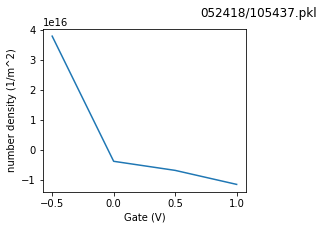

In [6]:
B_Vg_R_to_Vg_to_n(Rxx_n)

<IPython.core.display.Javascript object>


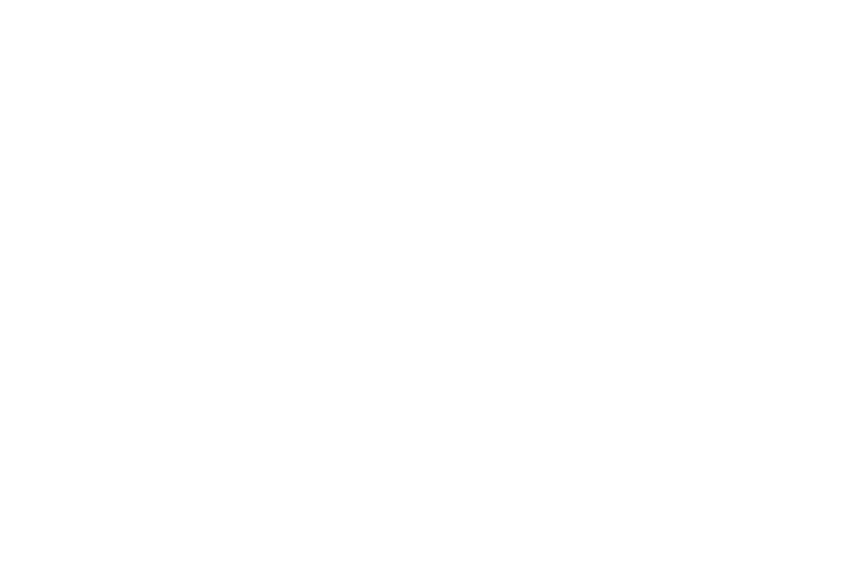

<IPython.core.display.Javascript object>


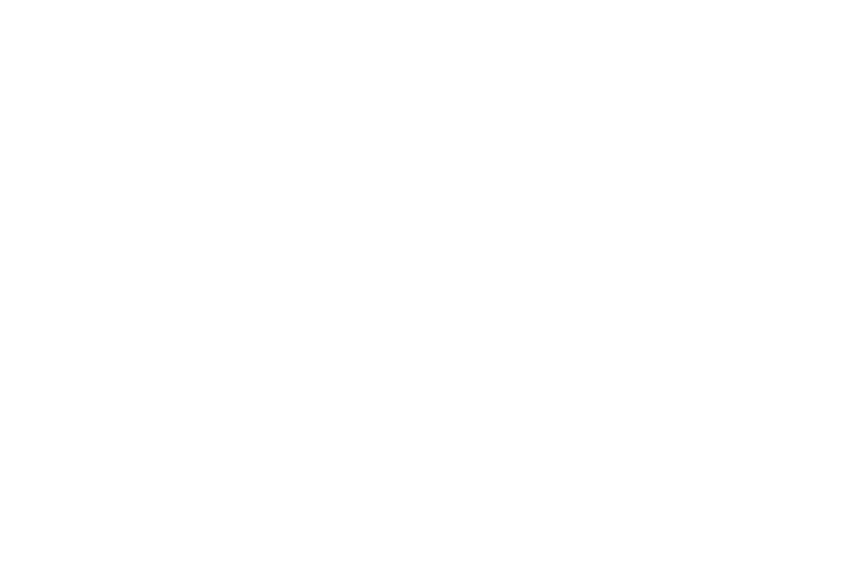

In [31]:
fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
X = np.arange(-5, 5, 0.25)
Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()



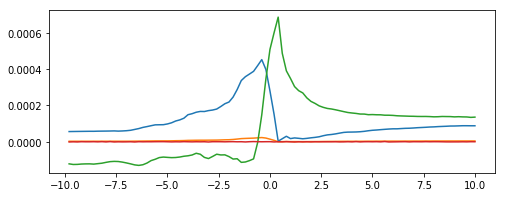

In [16]:
# 15 A
fig = plt.figure(figsize=(8, 3)) 
plt.plot(Rxx_n.GateV,Rxx_n.Vxx[0])
plt.plot(Rxx_n.GateV,Rxx_n.Vxy[0])

(-1.25e+17, 1.25e+17)

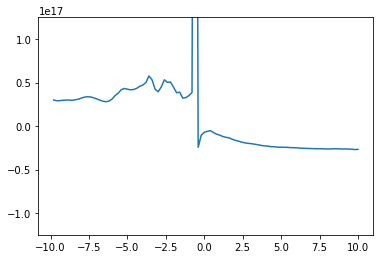

In [25]:
for i in range(len(Rxx_n.GateV)):
    Rxx_n.density[0][i]=-IMag_to_B(15)/V_to_R(Rxx_n.Vxy[0][i][0])/consts.e*3
plt.plot(Rxx_n.GateV,Rxx_n.density[0])
plt.ylim([-1.25*10**17,1.25*10**17])

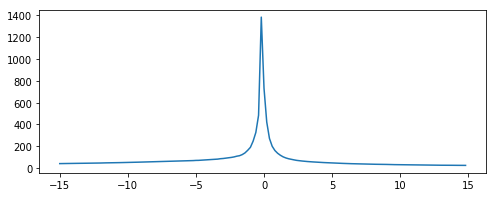

In [115]:
#0 T TG
fig = plt.figure(figsize=(8, 3)) 
plt.plot(Rxx_n.GateV,Rxx_n.Rxx[0])


<IPython.core.display.Javascript object>


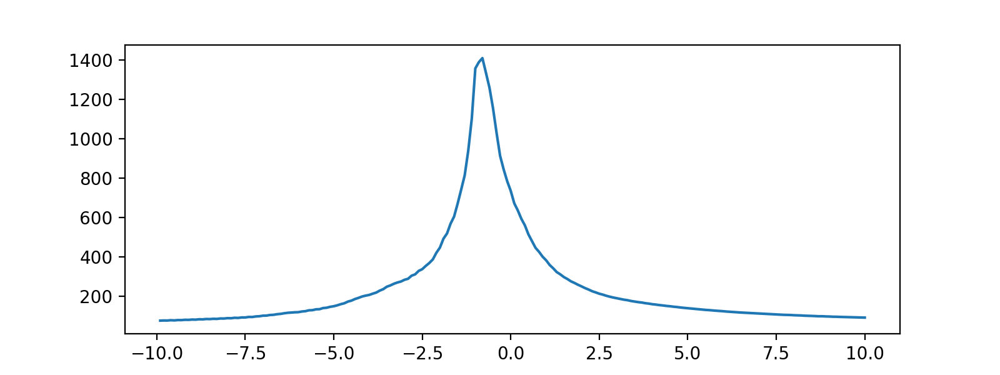

In [21]:
# 0 T BG 
fig = plt.figure(figsize=(8, 3)) 
plt.plot(Rxx_n.GateV,Rxx_n.Rxx[0])


<IPython.core.display.Javascript object>


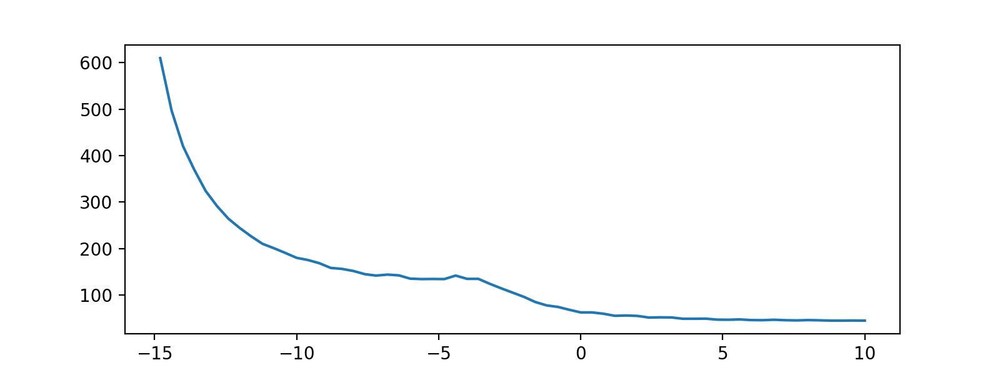

In [28]:
#0 T TG =3V, sweep BG -15,10 
fig = plt.figure(figsize=(8, 3)) 
plt.plot(Rxx_n.GateV,Rxx_n.Rxx[0])



<IPython.core.display.Javascript object>


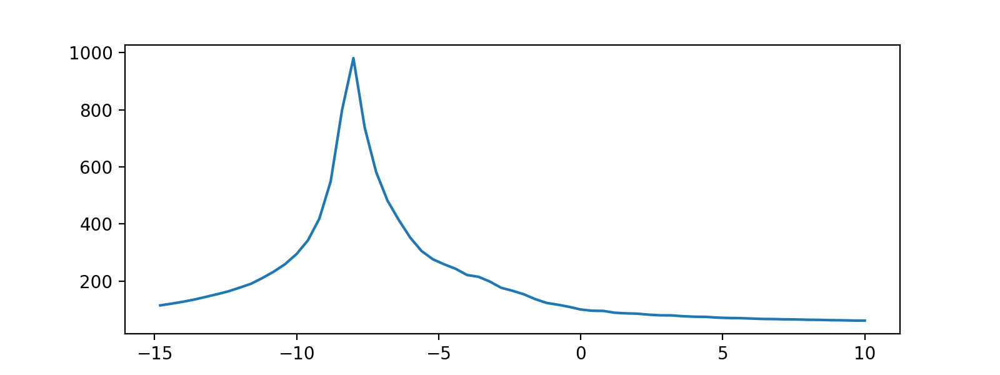

In [32]:
#1207 0 T TG =1.5, sweep BG -15,10 
fig = plt.figure(figsize=(8, 3)) 
plt.plot(Rxx_n.GateV,Rxx_n.Rxx[0])


<IPython.core.display.Javascript object>


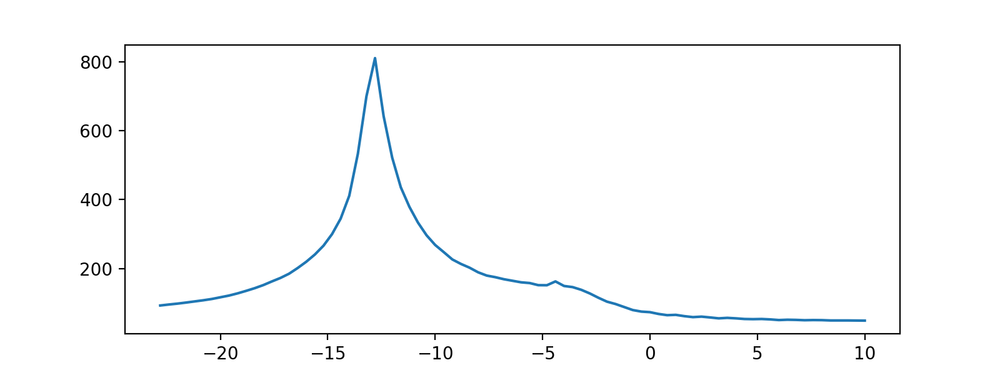

In [36]:
#1228 0 T TG =2.5, sweep BG -23,10 
fig = plt.figure(figsize=(8, 3)) 
plt.plot(Rxx_n.GateV,Rxx_n.Rxx[0])



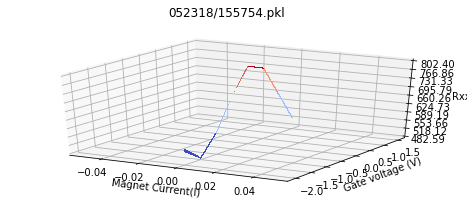

0.0


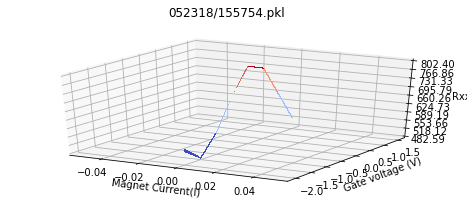

In [8]:
Rxx_n=B_Vg_R(GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[0,0], np.arange(-2, 2, 0.5),0.5)# IMag=0, Vg[],delay 

[[-7.83807e-06  4.47037e-07]
 [-1.52887e-05  8.04666e-07]
 [-1.61232e-05  1.37091e-06]
 [-1.63318e-05  1.49012e-06]
 [-1.56463e-05  7.45062e-07]
 [-1.51396e-05  6.25852e-07]
 [-1.44542e-05  1.75834e-06]
 [-1.36495e-05  1.63914e-06]
 [-1.36495e-05  4.47037e-07]
 [-1.58848e-05  1.16230e-06]
 [-1.80007e-05  1.46032e-06]
 [-1.89842e-05  1.16230e-06]
 [-2.02657e-05  8.64271e-07]
 [-2.07425e-05  1.13250e-06]
 [-2.05339e-05  8.94073e-07]
 [-2.08617e-05  1.60933e-06]
 [-2.30969e-05  1.16230e-06]
 [-2.37228e-05  9.83484e-07]
 [-2.25009e-05  1.69874e-06]
 [-2.04445e-05  2.08617e-07]
 [-2.07723e-05  1.43052e-06]
 [-2.21432e-05  1.19210e-06]
 [-2.30969e-05  2.23519e-06]
 [-2.32757e-05  2.26499e-06]
 [-2.39910e-05  1.22190e-06]
 [-2.53917e-05  1.19210e-06]
 [-2.63752e-05  1.69874e-06]
 [-2.96832e-05  1.40072e-06]
 [-3.20973e-05  1.60933e-06]
 [-3.41537e-05  1.90736e-06]
 [-3.35875e-05  2.14578e-06]
 [-3.22165e-05  3.01005e-06]
 [-3.11735e-05  2.62262e-06]
 [-3.46305e-05  2.02657e-06]
 [-3.58226e-05

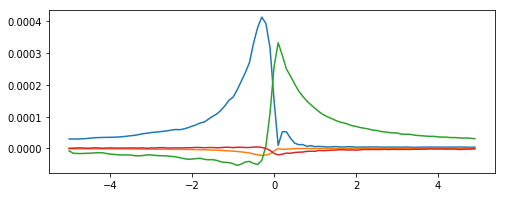

In [96]:
#0.51 T
fig = plt.figure(figsize=(8, 3)) 
plt.plot(Rxx_n.GateV,Rxx_n.Vxx[0])
plt.plot(Rxx_n.GateV,Rxx_n.Vxy[0])
print(Rxx_n.Vxy[0])

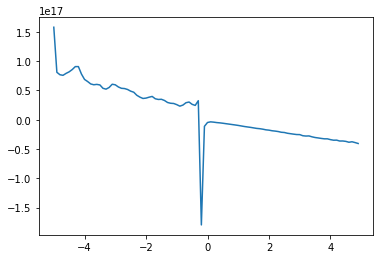

In [102]:
for i in range(len(Rxx_n.GateV)):
    Rxx_n.density[0][i]=-IMag_to_B(5.1)/V_to_R(Rxx_n.Vxy[0][i][0])/consts.e*3
plt.plot(Rxx_n.GateV,Rxx_n.density[0])


In [27]:
lock_Vxx.query_ascii_values('SENS?')
time.sleep(1)
x=lock_Vxx.query_ascii_values('OUTP?3')
print (x)
#print(readsrs(lock_Vxx))

[15.0]


In [39]:
lock_Vxx.query_ascii_values('SENS?')
lock_Vxx.query_ascii_values('SENS?')
lock_Vxx.write('AGAN')
time.sleep(3)
lock_Vxx.query_ascii_values('OUTP?3')
lock_Vxx.query_ascii_values('OUTP?3')

[0.000117399]

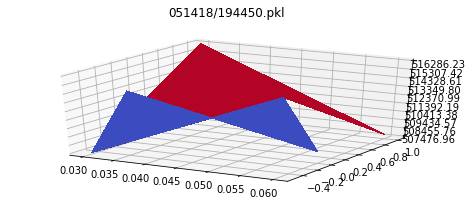

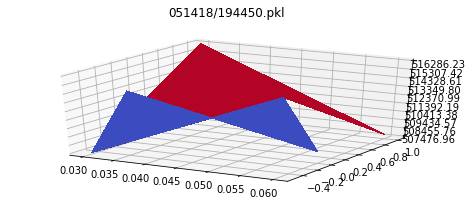

In [4]:
Fast_run_4k=B_Vg_R(GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[],[],)# IMag,Vg, delay

In [ ]:
Fine_run_4k=B_Vg_R(GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[],[],)# IMag,Vg, delay

In [ ]:
meas_T(lock_Vth,10,3)

In [ ]:
Hall_Vg_to_n=Vg_to_n(GateV_k2400,lock_Vxy,MagI_hp6031_U,MagI_hp6031_D,[-5,-4,-3,-2,-1,0,1,2,3,4,5],2,3,1.5) #delay,IMag,cutoffd

In [ ]:
Rxx_n=B_Vg_R(GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[0],[],1)# IMag=0, Vg[],delay 

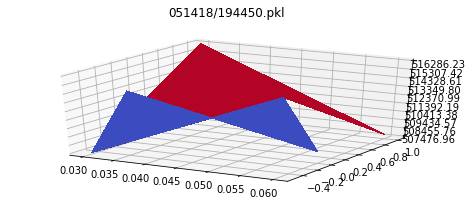

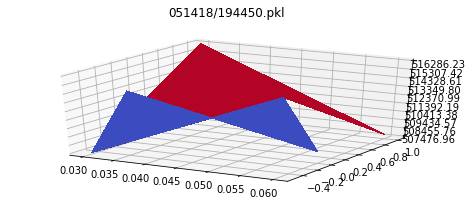

In [4]:
Fast_run_4k=B_Vg_R(GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[],[],)# IMag,Vg, delay

In [ ]:
Fine_run_4k=B_Vg_R(GateV_k2400,lock_Vxx,lock_Vxy,lock_Vth,MagI_hp6031_U,MagI_hp6031_D,[],[],)# IMag,Vg, delay

0.06


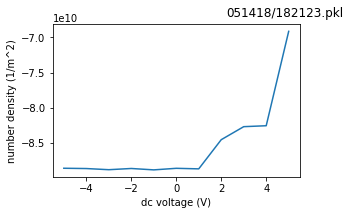

In [5]:
test1=Vg_to_n(GateV_k2400,lock_Vxy,MagI_hp6031_U,MagI_hp6031_D,[-5,-4,-3,-2,-1,0,1,2,3,4,5],1,0.05,1000)

In [4]:
test2.GateV

NameError: name 'test2' is not defined

In [9]:
np.savetxt('test',[1,1,1,1])

In [5]:
Mag_Resist

-1

In [10]:
2**[1,4,9,16]

TypeError: unsupported operand type(s) for ** or pow(): 'int' and 'list'

In [27]:
IsweepMag(MagI_hp6031_U,0)
#VreadMag(MagI_hp6031_U)
time.sleep(1)
#VsetMag(MagI_hp6031_U,0)
VsetMag(MagI_hp6031_U,Mag_tot_V_max/2)

0.0


(16, <StatusCode.success: 0>)

In [25]:
VsetMag(MagI_hp6031_U,0)
VsetMag(MagI_hp6031_U,Mag_tot_V_max/2)

(16, <StatusCode.success: 0>)

In [3]:
savetxtdata('gjmi',[1,2,3,2])

In [5]:
MeasMagR(MagI_hp6031_U,MagI_hp6031_D)

0.3
0.3
0.27
0.24
0.21
0.18
0.15
0.12
0.09
0.06
0.0
0.3
0.27
0.24
0.21
0.18
0.15
0.12
0.09
0.06
0.3
0.3
0.27
0.24
0.21
0.18
0.15
0.12
0.09
0.06


13.0

In [9]:
VreadMag(MagI_hp6031_D)

4.0

In [12]:
MagI_hp6031_U.query_ascii_values('VOUT?',converter='s')

['VOUT  3.915\r\n']

In [5]:
VreadMag(MagI_hp6031_U)

3.91

In [4]:
IreadE3640A(GateV_E3640A)

-4.631415e-05

In [5]:
meas_T(lock_Vth,1,1)

array([303.43605301])

In [ ]:
Vth_to_T(readsrs(lock_Vxx)[0])

In [ ]:
test_2=B_Vg_R(k2400,srs,hp6031,k33420,IMag,GateV,delay)